# Overview

Cochrane in 2011 explains the average US stock returns’ behavior by
identifying stock level characteristics that contain independent information.
Green et al. (2017) take Cochrane’s challenge using 94 stock level
characteristics to identify significant predictors statistically.
They use the Fama MacBeth regression, in which they include 94
characteristics from 1980 to 2014. They mainly focus on the OLS method
because its assumptions can significantly identify the most potent
independent determinants after accounting for all other factors.

# Goal

In this project, I will be developing an unsupervised technique (PCA model) to reduce the dimensionality of the data by identifying latent variables that explain patterns in the 94 firm characteristics.

# Challenge


Applying Principal Component Analysis (PCA) to high-dimensional time series data is challenging and complex due to several inherent properties and practical considerations of time series and high-dimensional datasets. Here are the key challenges:

1. Temporal Dependency Sequential Nature: Time series data points are temporally ordered and often exhibit dependencies, meaning that current values depend on previous values. Autocorrelation: The presence of autocorrelation (correlation of the time series with lagged versions of itself) complicates the assumption of independence among data points, which PCA relies on.

2. Non-Stationarity Changing Statistics: Time series data often exhibit non-stationarity, where statistical properties like mean and variance change over time due to trends, seasonality, and other factors. Trend and Seasonality: These components must be removed or accounted for before applying PCA, requiring additional preprocessing steps like differencing, detrending, or seasonal decomposition.

3. High Dimensionality Curse of Dimensionality: High-dimensional data can lead to computational inefficiencies and numerical instability in PCA calculations. Sparsity: As the number of dimensions increases, the data becomes sparse, making it harder to capture meaningful patterns. Interpretability: Interpreting principal components in a high-dimensional space can be challenging and less intuitive.

4. Feature Extraction Lagged Features: Creating lagged versions of the time series (e.g., using past values as features) increases the dimensionality further, complicating the analysis. Windowing: Dividing the time series into overlapping windows to capture local patterns introduces additional complexity in maintaining the temporal context.

5. Scalability Computational Resources: Performing PCA on large high-dimensional datasets requires significant computational resources and memory. Efficiency: Efficient algorithms and data structures are needed to handle the computation of covariance matrices and eigen decomposition in high dimensions.

6. Handling Missing Data Imputation: Time series data often contains missing values, which need to be imputed accurately to avoid biasing the PCA results. Temporal Gaps: Temporal gaps and irregular time intervals pose additional challenges for consistent data preprocessing.

7. Multivariate Time Series Interdependencies: In multivariate time series, different time series may be interdependent, adding complexity to capturing these relationships with PCA. Dimension Explosion: Combining multiple time series into a single dataset further increases dimensionality and computational burden.

# Data Overview

The data sample covers 60 years, starting in March 1957, ending December
2016. They include a total of 6,200 in each month with individual returns
obtained from CRSP for all NYSE, NASDAQ, and AMEX firms. The data
set also contains stocks with share codes beyond 10 and 11, prices below $5,
and financial firms. One reason for selecting the largest pool of assets is that one can avoid overfitting by increasing the number of observations. The
stock-level predictive characteristics consist of 20 monthly, 13 quarterly, and
61 annually updated features that are constructed based on Green et al. (2017)
with some minor modifications.

The original data contains 869,347 observations for 97 variables. Ninety-four variables correspond to
the stock-level characteristics. The two variables represent DATE and Permno, respectively. 

**Permno:** is a unique identifier for one particular stock in the database

**DATE:** is of the form yy-mm-dd.

<u>**Note:**</u> This data is huge, therefore, for the sake of representation, I am going to extract data from 2005 till 2016

## EDA - Exaplanatory Data Analysis

### Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
import plotly.express as px
import datetime as dt
from collections import Counter
import os

In [2]:
df = pd.read_csv("/Users/adel/Desktop/Masters Thesis/datashare/datashare.csv")

In [3]:
df.head()

,permno,DATE,mvel1,beta,betasq,chmom,dolvol,idiovol,indmom,mom1m,...,stdcf,ms,baspread,ill,maxret,retvol,std_dolvol,std_turn,zerotrade,sic2
0,10006,19570329,86308.500,1.117907,1.249717,0.134574,10.296745,0.024863,0.05954,0.002016,...,NaN,NaN,0.013856,1.557681e-07,0.029167,0.013546,0.914592,0.802461,1.066005e-07,37.0
1,10014,19570329,3903.375,0.331304,0.109762,0.006667,7.032404,0.065248,0.05954,-0.086957,...,NaN,NaN,0.031389,8.383815e-06,0.071429,0.031165,0.943409,0.716406,1.105263e+00,NaN
2,10022,19570329,9841.000,0.942052,0.887461,0.058761,7.294038,0.029338,0.05954,-0.037037,...,NaN,NaN,0.010066,5.360386e-06,0.020000,0.016886,0.993558,0.534808,2.387797e-07,NaN
3,10030,19570329,51901.000,0.886532,0.785940,-0.032065,9.516942,0.022007,0.05954,0.000000,...,NaN,NaN,0.009523,1.090908e-07,0.017857,0.009104,0.736000,0.712647,9.202902e-08,NaN
4,10057,19570329,35250.000,1.229520,1.511719,-0.102811,8.421013,0.025453,0.05954,-0.030717,...,NaN,NaN,0.007661,2.386914e-07,0.007194,0.006748,0.889503,0.775954,6.631579e+00,NaN


### Discover the data set 

In [4]:
df.columns

Index(['permno', 'DATE', 'mvel1', 'beta', 'betasq', 'chmom', 'dolvol',
       'idiovol', 'indmom', 'mom1m', 'mom6m', 'mom12m', 'mom36m', 'pricedelay',
       'turn', 'absacc', 'acc', 'age', 'agr', 'bm', 'bm_ia', 'cashdebt',
       'cashpr', 'cfp', 'cfp_ia', 'chatoia', 'chcsho', 'chempia', 'chinv',
       'chpmia', 'convind', 'currat', 'depr', 'divi', 'divo', 'dy', 'egr',
       'ep', 'gma', 'grcapx', 'grltnoa', 'herf', 'hire', 'invest', 'lev',
       'lgr', 'mve_ia', 'operprof', 'orgcap', 'pchcapx_ia', 'pchcurrat',
       'pchdepr', 'pchgm_pchsale', 'pchquick', 'pchsale_pchinvt',
       'pchsale_pchrect', 'pchsale_pchxsga', 'pchsaleinv', 'pctacc', 'ps',
       'quick', 'rd', 'rd_mve', 'rd_sale', 'realestate', 'roic', 'salecash',
       'saleinv', 'salerec', 'secured', 'securedind', 'sgr', 'sin', 'sp',
       'tang', 'tb', 'aeavol', 'cash', 'chtx', 'cinvest', 'ear', 'nincr',
       'roaq', 'roavol', 'roeq', 'rsup', 'stdacc', 'stdcf', 'ms', 'baspread',
       'ill', 'maxret', 'retvol', '

Here's a detailed description of the variables, which are commonly used in financial and economic research, particularly in the context of firm characteristics and stock market analysis:

1. **mvel1**: Market value of equity lagged by one month.
2. **beta**: Measure of a stock's volatility relative to the overall market.
3. **betasq**: Square of the beta value.
4. **chmom**: Change in momentum; typically calculates the difference in momentum over two periods.
5. **dolvol**: Dollar volume; total value of shares traded over a period.
6. **idiovol**: Idiosyncratic volatility; stock-specific risk independent of overall market movement.
7. **indmom**: Industry momentum; average return of stocks within the same industry.
8. **mom1m**: One-month price momentum.
9. **mom6m**: Six-month price momentum.
10. **mom12m**: Twelve-month price momentum.
11. **mom36m**: Thirty-six month price momentum.
12. **pricedelay**: Measures the lag in a stock’s price adjustment to information.
13. **turn**: Turnover; ratio of the volume of shares traded to the number of shares available.
14. **absacc**: Absolute value of accruals, indicating the quality of earnings.
15. **acc**: Accruals component of earnings.
16. **age**: Age of the firm.
17. **agr**: Asset growth rate.
18. **bm**: Book-to-market ratio.
19. **bm_ia**: Industry-adjusted book-to-market ratio.
20. **cashdebt**: Ratio of cash holdings to debt.
21. **cashpr**: Cash profitability; cash flow to price ratio.
22. **cfp**: Cash flow to price ratio.
23. **cfp_ia**: Industry-adjusted cash flow to price ratio.
24. **chatoia**: Change in asset turnover, industry adjusted.
25. **chcsho**: Change in the number of shares outstanding.
26. **chempia**: Change in employee efficiency, industry adjusted.
27. **chinv**: Change in inventory levels.
28. **chpmia**: Change in profit margin, industry adjusted.
29. **convind**: Convertible indicator; marks if the firm has convertible securities.
30. **currat**: Current ratio; a liquidity ratio that measures a company’s ability to pay short-term obligations.
31. **depr**: Depreciation rate relative to total assets.
32. **divi**: Dividend initiation.
33. **divo**: Dividend omission.
34. **dy**: Dividend yield.
35. **egr**: Earnings growth rate.
36. **ep**: Earnings to price ratio.
37. **gma**: Gross margin.
38. **grcapx**: Growth in capital expenditures.
39. **grltnoa**: Growth in long-term net operating assets.
40. **herf**: Herfindahl index, a measure of the size of firms in relation to the industry and an indicator of the amount of competition among them.
41. **hire**: Hiring rate.
42. **invest**: Investment rate.
43. **lev**: Leverage ratio.
44. **lgr**: Long-term growth rate.
45. **mve_ia**: Market value of equity, industry adjusted.
46. **operprof**: Operating profitability.
47. **orgcap**: Organizational capital.
48. **pchcapx_ia**: Percentage change in capital expenditures, industry adjusted.
49. **pchcurrat**: Percentage change in current ratio.
50. **pchdepr**: Percentage change in depreciation.
51. **pchgm_pchsale**: Changes in gross margin relative to changes in sales.
52. **pchquick**: Percentage change in quick ratio.
53. **pchsale_pchinvt**: Sales growth minus inventory growth.
54. **pchsale_pchrect**: Sales growth minus receivables growth.
55. **pchsale_pchxsga**: Sales growth minus growth in SG&A expenses.
56. **pchsaleinv**: Sales growth relative to inventory growth.
57. **pctacc**: Percentage accruals.
58. **ps**: Price to sales ratio.
59. **quick**: Quick ratio, a measure of a company’s ability to meet its short-term obligations with its most liquid assets.
60. **rd**: Research and development expenses.
61. **rd_mve**: R&D to market value ratio.
62. **rd_sale**: R&D to sales ratio.
63. **realestate**: Proportion of assets in real estate.
64. **roic**: Return on invested capital.
65. **salecash**: Sales to cash ratio.
66. **saleinv**: Sales to inventory ratio.
67. **salerec**: Sales to receivables ratio.
68. **secured**: Secured debts.
69. **securedind**: Secured debt indicator.
70. **sgr**: Sales growth rate.


71. **sin**: Sin stock indicator (typically for industries like alcohol, tobacco, gambling).
72. **sp**: Sales to price ratio.
73. **tang**: Tangibility; proportion of physical assets relative to total assets.
74. **tb**: Tax burden.
75. **aeavol**: Abnormal earnings volatility.
76. **cash**: Cash holdings.
77. **chtx**: Corporate tax rate.
78. **cinvest**: Corporate investment.
79. **ear**: Earnings announcement returns.
80. **nincr**: Number of consecutive years of earnings increases.
81. **roaq**: Return on average equity.
82. **roavol**: Return on assets volatility.
83. **roeq**: Return on equity.
84. **rsup**: Relative supply; measures stock availability in the market.
85. **stdacc**: Standard deviation of accruals.
86. **stdcf**: Standard deviation of cash flows.
87. **ms**: Mass sentiment; measures market sentiment.
88. **baspread**: Bid-ask spread.
89. **ill**: Illiquidity measure.
90. **maxret**: Maximum return.
91. **retvol**: Return volatility.
92. **std_dolvol**: Standard deviation of dollar volume.
93. **std_turn**: Standard deviation of turnover.
94. **zerotrade**: Days with zero trades.
95. **sic2**: The first two digits of the Standard Industrial Classification code.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3760208 entries, 0 to 3760207
Data columns (total 97 columns):
 #   Column           Dtype  
---  ------           -----  
 0   permno           int64  
 1   DATE             int64  
 2   mvel1            float64
 3   beta             float64
 4   betasq           float64
 5   chmom            float64
 6   dolvol           float64
 7   idiovol          float64
 8   indmom           float64
 9   mom1m            float64
 10  mom6m            float64
 11  mom12m           float64
 12  mom36m           float64
 13  pricedelay       float64
 14  turn             float64
 15  absacc           float64
 16  acc              float64
 17  age              float64
 18  agr              float64
 19  bm               float64
 20  bm_ia            float64
 21  cashdebt         float64
 22  cashpr           float64
 23  cfp              float64
 24  cfp_ia           float64
 25  chatoia          float64
 26  chcsho           float64
 27  chempia     

### Filter the data from 2005 to 2016
As I mentioned before, I am going to extract only a portion from the data due to its high dimensionality. The extraction process will be from january of 2005 to december of 2016.

In [6]:
#create a copy of data frame
df0 = df.copy()

In [7]:
#check for unique dates
df0['DATE'].unique()

array([19570329, 19570430, 19570531, 19570628, 19570731, 19570830,
       19570930, 19571031, 19571129, 19571231, 19580131, 19580228,
       19580331, 19580430, 19580529, 19580630, 19580731, 19580829,
       19580930, 19581031, 19581128, 19581231, 19590130, 19590227,
       19590331, 19590430, 19590529, 19590630, 19590731, 19590831,
       19590930, 19591030, 19591130, 19591231, 19600129, 19600229,
       19600331, 19600429, 19600531, 19600630, 19600729, 19600831,
       19600930, 19601031, 19601130, 19601230, 19610131, 19610228,
       19610330, 19610428, 19610531, 19610630, 19610731, 19610831,
       19610929, 19611031, 19611130, 19611229, 19620131, 19620228,
       19620330, 19620430, 19620531, 19620629, 19620731, 19620831,
       19620928, 19621031, 19621130, 19621231, 19630131, 19630228,
       19630329, 19630430, 19630531, 19630628, 19630731, 19630830,
       19630930, 19631031, 19631129, 19631231, 19640131, 19640228,
       19640331, 19640430, 19640528, 19640630, 19640731, 19640

The first data point for the year 2005 is: **20050131**
Therefore, I am going to subset the data to account for all data point beyond 2005-01-31. Call the new data frame *df1*

In [8]:
df1 = df0[df0['DATE'] >= 20050131]

In [9]:
df2 = df1.copy()

### Dealing with dates

In [10]:
df2['DATE'].unique()

array([20050131, 20050228, 20050331, 20050429, 20050531, 20050630,
       20050729, 20050831, 20050930, 20051031, 20051130, 20051230,
       20060131, 20060228, 20060331, 20060428, 20060531, 20060630,
       20060731, 20060831, 20060929, 20061031, 20061130, 20061229,
       20070131, 20070228, 20070330, 20070430, 20070531, 20070629,
       20070731, 20070831, 20070928, 20071031, 20071130, 20071231,
       20080131, 20080229, 20080331, 20080430, 20080530, 20080630,
       20080731, 20080829, 20080930, 20081031, 20081128, 20081231,
       20090130, 20090227, 20090331, 20090430, 20090529, 20090630,
       20090731, 20090831, 20090930, 20091030, 20091130, 20091231,
       20100129, 20100226, 20100331, 20100430, 20100528, 20100630,
       20100730, 20100831, 20100930, 20101029, 20101130, 20101231,
       20110131, 20110228, 20110331, 20110429, 20110531, 20110630,
       20110729, 20110831, 20110930, 20111031, 20111130, 20111230,
       20120131, 20120229, 20120330, 20120430, 20120531, 20120

In [11]:
# Assuming 'DATE' is the datetime column
# Convert datetime to string and extract the microseconds part which contains the actual date
df2['custom_date'] = df2['DATE'].astype(str).str[-8:]

# Now convert this 'custom_date' to a proper datetime
df2['parsed_date'] = pd.to_datetime(df2['custom_date'], format='%Y%m%d')

# Check the results
print(df2[['DATE', 'custom_date', 'parsed_date']].head())

             DATE custom_date parsed_date
2890861  20050131    20050131  2005-01-31
2890862  20050131    20050131  2005-01-31
2890863  20050131    20050131  2005-01-31
2890864  20050131    20050131  2005-01-31
2890865  20050131    20050131  2005-01-31


In [12]:
# Print unique datetime values to see a sample
print(df2['parsed_date'].unique()[:12])  # Print the first 12 unique datetime values


<DatetimeArray>
['2005-01-31 00:00:00', '2005-02-28 00:00:00', '2005-03-31 00:00:00',
 '2005-04-29 00:00:00', '2005-05-31 00:00:00', '2005-06-30 00:00:00',
 '2005-07-29 00:00:00', '2005-08-31 00:00:00', '2005-09-30 00:00:00',
 '2005-10-31 00:00:00', '2005-11-30 00:00:00', '2005-12-30 00:00:00']
Length: 12, dtype: datetime64[ns]


In [13]:
#Create the final date column which takes the correct date format without timestamp
df2['date'] = df2['parsed_date'].dt.date

In [14]:
print(df2['date'].unique()[:12]) 

[datetime.date(2005, 1, 31) datetime.date(2005, 2, 28)
 datetime.date(2005, 3, 31) datetime.date(2005, 4, 29)
 datetime.date(2005, 5, 31) datetime.date(2005, 6, 30)
 datetime.date(2005, 7, 29) datetime.date(2005, 8, 31)
 datetime.date(2005, 9, 30) datetime.date(2005, 10, 31)
 datetime.date(2005, 11, 30) datetime.date(2005, 12, 30)]


In [15]:
#Drop the DATE, custom date, and parsed date columns
columns_to_drop = ['DATE','custom_date','parsed_date']
df2.drop(columns=columns_to_drop,inplace=True)

I have to dynamically reorder columns (e.g., move a specific column to the first position without hardcoding all column names), I can use the following approach:

In [16]:
#Re-order the created date column
# Check if 'date' is in the columns
if 'date' in df2.columns:
    # Column to move
    column_to_move = 'date'

    # Create a new order for the columns, moving 'date' to the first position
    new_order = [column_to_move] + [col for col in df2.columns if col != column_to_move]

    # Apply the new order
    df2 = df2[new_order]

    print("Dynamically Reordered DataFrame:")
    print(df2)
else:
    print("Column 'date' not found in DataFrame df2.")


Dynamically Reordered DataFrame:
               date  permno         mvel1      beta    betasq     chmom  \
2890861  2005-01-31   10001  1.793310e+04  0.171490  0.029409 -0.083292   
2890862  2005-01-31   10002  2.712268e+05  0.439592  0.193241  0.311928   
2890863  2005-01-31   10012  2.444396e+04  2.390431  5.714160  1.160606   
2890864  2005-01-31   10025  1.239738e+05  1.280627  1.640004  0.189081   
2890865  2005-01-31   10026  4.423486e+05  0.552956  0.305761  0.122591   
...             ...     ...           ...       ...       ...       ...   
3760203  2016-12-30   93428  1.250976e+06  1.595315  2.545028 -0.137348   
3760204  2016-12-30   93429  5.600537e+06  0.298267  0.088963  0.206434   
3760205  2016-12-30   93433  2.473625e+04  2.324893  5.405128  0.328248   
3760206  2016-12-30   93434  8.573280e+04  0.628519  0.395036  0.020854   
3760207  2016-12-30   93436  2.840318e+07  1.588092  2.522036 -0.121017   

            dolvol   idiovol    indmom     mom1m  ...       stdcf 

### Investigating data types

It looks like all the variables have reasonable data types, However, I will only transform the date column from **object** to **datetime object**

In [17]:
# Convert 'date' column to datetime
df2['date'] = pd.to_datetime(df2['date'], errors='coerce')

# Check the changes
print(df2['date'].dtype)

datetime64[ns]


### Dealing with missing values

In [18]:
#Create a copy of df2
df3 = df2.copy()

In [19]:
print(df3.isna().sum())

date              0
permno            0
mvel1           151
beta          59802
betasq        59802
              ...  
retvol          433
std_dolvol      460
std_turn        209
zerotrade       113
sic2           1288
Length: 97, dtype: int64


It looks like the dataframe contains a significant amount of missing values, therefore, I will investigate the missing values and decide on whether to simply remove them or perform certain imputation process.

#### Create some visualizations to better understand

##### Create a visualization for the COUNT of missing values

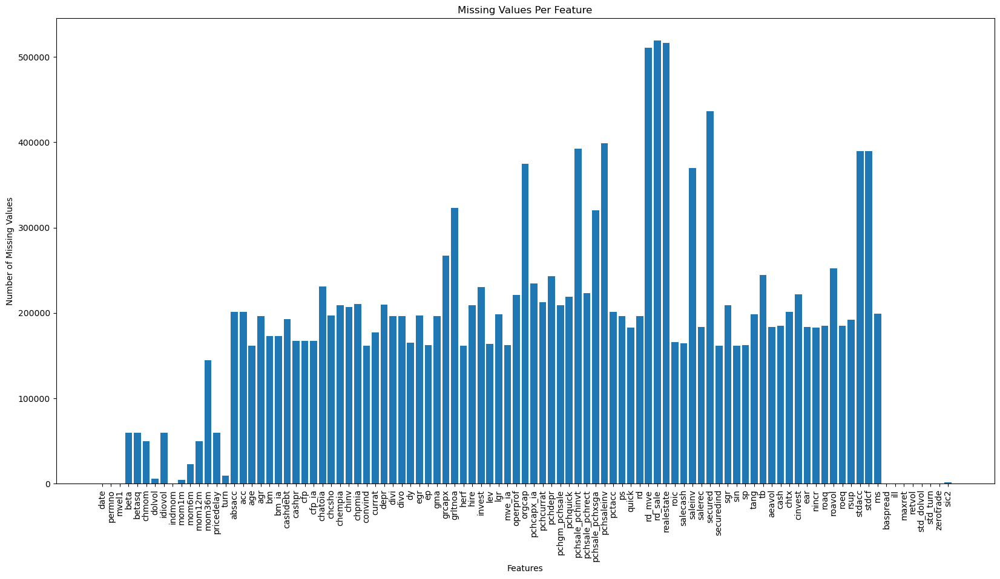

In [20]:
# Calculate the number of missing values per column
missing_data_counts = df3.isnull().sum()

# Plotting
fig, ax = plt.subplots(figsize=(20, 10))
ax.bar(missing_data_counts.index, missing_data_counts.values)

# Set the tick positions and labels
ax.set_xticks(np.arange(len(missing_data_counts)))  # Set ticks at every integer index
ax.set_xticklabels(missing_data_counts.index, rotation=90)  # Rotate tick labels for readability

plt.xlabel('Features')
plt.ylabel('Number of Missing Values')
plt.title('Missing Values Per Feature')
plt.show()

# Ensure the directory exists
#save_dir = 'Missing Values Per Feature'
#if not os.path.exists(save_dir):
   # os.makedirs(save_dir)

# Save the plot
#plot_path = os.path.join(save_dir, 'missing_values_per_Feature.png')
#plt.savefig(plot_path)
#plt.close()

#print(f"Plot saved to {plot_path}")

##### Create a Visualization for the percentage of missing values from the total dataset

In [21]:
# Calculate the percentage of missing data for each column
missing_percentage = df3.isnull().sum() / len(df3) * 100

# Sort the series for better visualization if you have many variables
missing_percentage_sorted = missing_percentage.sort_values(ascending=False)

# Display the results
print(missing_percentage_sorted)

rd_sale       59.737481
realestate    59.436681
rd_mve        58.786537
secured       50.212746
pchsaleinv    45.872822
                ...    
baspread       0.002186
maxret         0.002186
indmom         0.000920
permno         0.000000
date           0.000000
Length: 97, dtype: float64


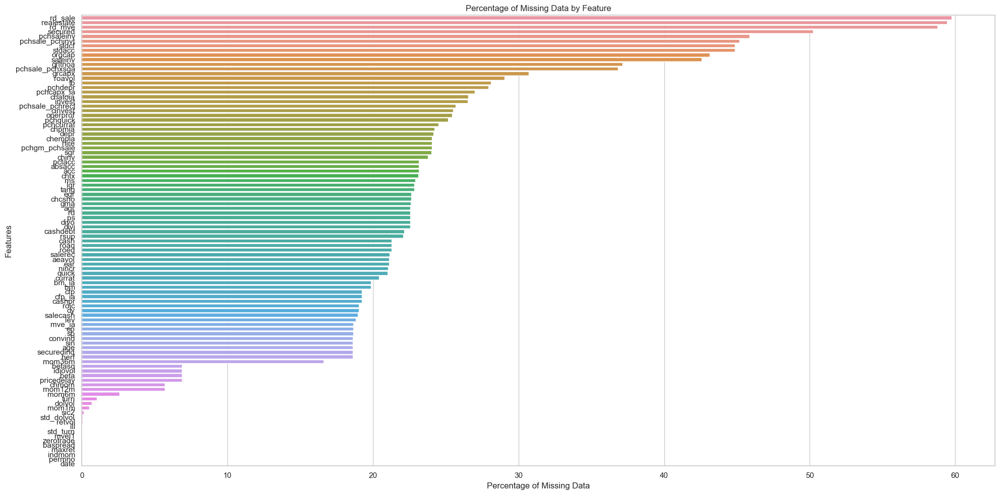

In [22]:
# Set the visual style
sns.set(style="whitegrid")

# Creating the plot
plt.figure(figsize=(20, 10))  # Adjust the size as needed
sns.barplot(x=missing_percentage_sorted.values, y=missing_percentage_sorted.index)
plt.title('Percentage of Missing Data by Feature')
plt.xlabel('Percentage of Missing Data')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

#plot_path = os.path.join(save_dir, 'Percentage of Missing Data by Feature.png')
#plt.savefig(plot_path)
#plt.close()

#print(f"Plot saved to {plot_path}")

##### Create a Visualization using plotly 
The Plotly library is a powerful, interactive graphing library that lets you create high-quality, interactive, and aesthetically pleasing graphs directly from your data. It supports a wide range of static, animated, and interactive visualizations and is particularly suited for web and interactive applications. Plotly is available for Python, R, and JavaScript.

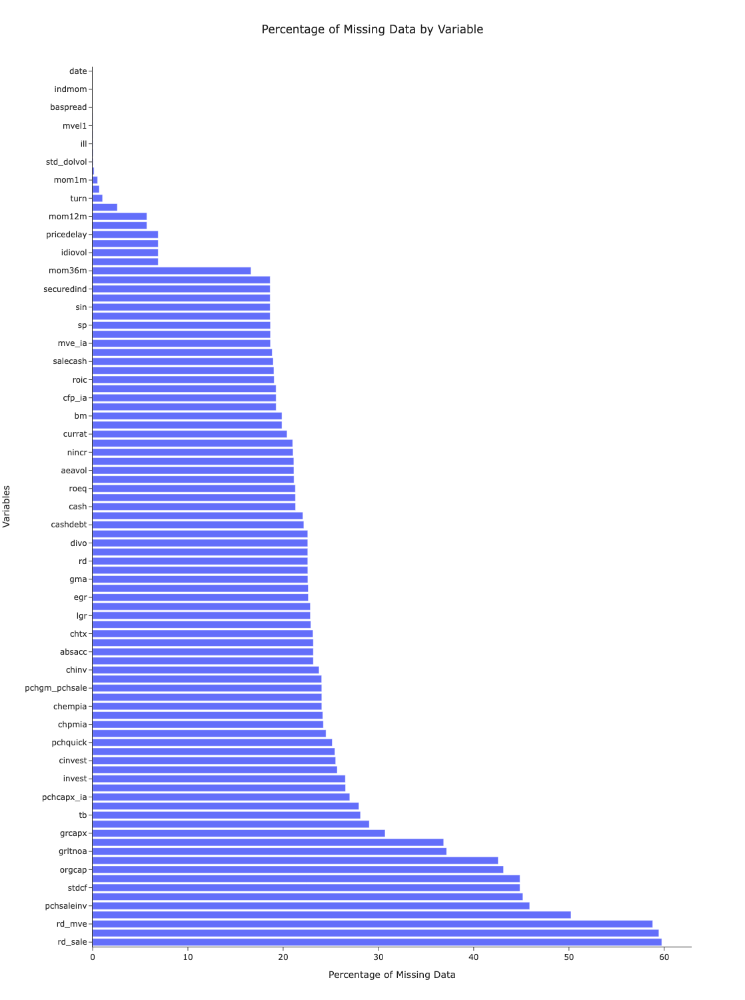

In [23]:
# Create a horizontal bar plot using Plotly Express

fig = px.bar(missing_percentage_sorted,
             x=missing_percentage_sorted.values,
             y=missing_percentage_sorted.index,
             orientation='h',  # This makes the bar horizontal
             labels={'y': 'Variables', 'x': 'Percentage of Missing Data'},  # Labeling axes
             title='Percentage of Missing Data by Variable')

# Improve layout and styling
fig.update_layout(
    autosize=False,  # Allow manual resizing
    width=1000,      # Width of the figure in pixels
    height=1500,     # Height of the figure in pixels, adjust as needed for the number of variables
    yaxis_title='Variables',
    xaxis_title='Percentage of Missing Data',
    title={'x':0.5, 'xanchor': 'center'},  # Center the title
    template='simple_white'
)

# Show the interactive plot
fig.show()

### Missing Values Imputation

Since Principal Component Analysis (PCA) is sensitive to missing values and given that I visualize the missing values which are significant ratio of total data points, I have to figure out a way to impute missing values.

Imputing missing values in cross-sectional stock market data can be quite challenging due to the nature of the data, which often contains variables like stock prices, volumes, financial ratios, etc. The choice of imputation method can significantly affect the results of any subsequent analyses, such as portfolio optimization, risk assessment, or trading algorithms. The best method often depends on the specific characteristics of your data and the goals of your analysis.

Here are some common techniques for imputing missing values in stock market data, along with considerations for each:

* **1. Mean or Median Imputation:** This method is simple and can be effective if the data is roughly normally distributed without outliers.

    Pros: Easy to implement and understand.
    
    Cons: Can reduce the variance of the dataset and is not suitable for data with trends or seasonality.
    

* **2. Last Observation Carried Forward (LOCF):** Useful for time-series data where the most recent observation might be the best guess for the next value, such as stock prices or indices.

    Pros: Maintains continuity in data that is sequentially dependent.
    
    Cons: Can introduce bias if the previous value is not representative of future values, especially over longer gaps.
    
    
* **3. Linear Interpolation:** Effective for time-series data where values are expected to change incrementally over time.

    Pros: Provides a smooth estimate of missing values based on surrounding data points.
    
    Cons: May not be appropriate for volatile stock data where changes are not gradual.
    
    
* **4. Regression Imputation:** When other related variables (predictors) can be used to estimate the missing values. For example, using sector indices to estimate missing individual stock prices.

    Pros: Can provide accurate imputations if the relationships between variables are strong and well understood.
    
    Cons: Risk of introducing bias if the model is misspecified; computationally intensive.
    
    
* **5. Multiple Imputation:** Considered a more sophisticated approach to handle missing data by creating multiple complete datasets using a stochastic (random) method, analyzing each dataset separately, and then pooling the results.

    Pros: Accounts for the uncertainty in the imputations and typically provides more accurate inference than single imputation methods.
    
    Cons: More complex to implement and interpret; requires statistical software capable of performing multiple imputation and combining results.
    
    
* **6. Advanced Machine Learning Methods (e.g., K-Nearest Neighbors, Deep Learning)** When you have large datasets and computational resources to support more complex imputation models. These methods can consider non-linear relationships and interactions between features.

    Pros: Can capture complex patterns in the data, potentially leading to more accurate imputation.
    
    Cons: Requires significant computational resources; risk of overfitting; complex models can be difficult to interpret.


#### Checking for data distribution

In [24]:
df3['tb'].describe()

count    624946.000000
mean         -0.217033
std           1.907693
min         -39.740668
25%          -0.705720
50%          -0.225485
75%           0.298466
max          13.012188
Name: tb, dtype: float64

/opt/anaconda3/envs/ML/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



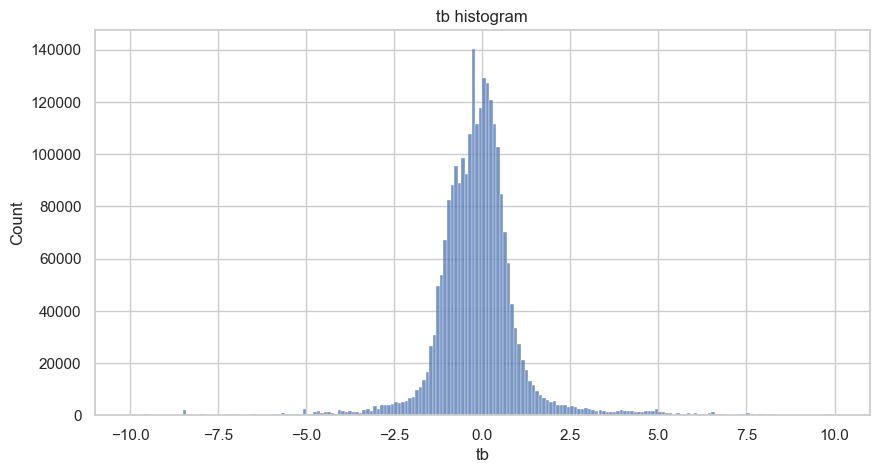

In [25]:
# Assuming the data ranges from some minimum to a maximum, you could set bins like this:
bin_width = 0.10  # Change the width as needed
#bins = np.arange(start=df3['tb'].min(), stop=df['tb'].max() + bin_width, step=bin_width)
bins = np.arange(start=-10, stop=10 + bin_width, step=bin_width)

plt.figure(figsize=(10,5))
sns.histplot(df['tb'].dropna(), bins=bins)
plt.title('tb histogram');
plt.show()
# Save the plot
#plot_path = os.path.join(save_dir, 'tb_histogram.png')
#plt.savefig(plot_path)
#plt.close()

#print(f"Plot saved to {plot_path}")

In [26]:
df3['roic'].describe()

count    703738.000000
mean         -0.182741
std           1.347103
min         -17.171965
25%           0.005300
50%           0.052349
75%           0.119513
max           3.592758
Name: roic, dtype: float64

/opt/anaconda3/envs/ML/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



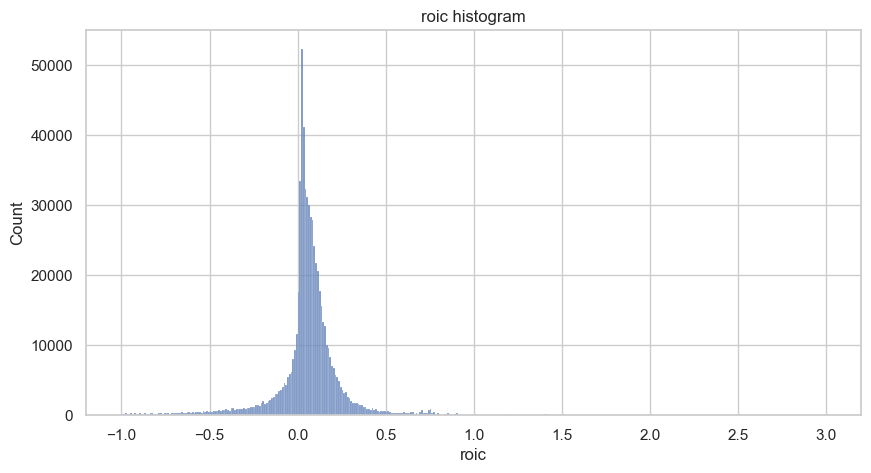

In [27]:
# Assuming the data ranges from some minimum to a maximum, you could set bins like this:
bin_width = 0.01  # Change the width as needed
#bins = np.arange(start=df3['roic'].min(), stop=df3['roic'].max() + bin_width, step=bin_width)
bins = np.arange(start=-1, stop=3 + bin_width, step=bin_width)

plt.figure(figsize=(10,5))
sns.histplot(df3['roic'].dropna(), bins=bins)
plt.title('roic histogram');
plt.show()
# Save the plot
#plot_path = os.path.join(save_dir, 'roic.png')
#plt.savefig(plot_path)
#plt.close()

#print(f"Plot saved to {plot_path}")


In [28]:
df3['rd_mve'].describe()

count    358288.000000
mean          0.062108
std           0.121480
min          -0.021012
25%           0.002726
50%           0.024561
75%           0.071112
max           2.370752
Name: rd_mve, dtype: float64

/opt/anaconda3/envs/ML/lib/python3.12/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



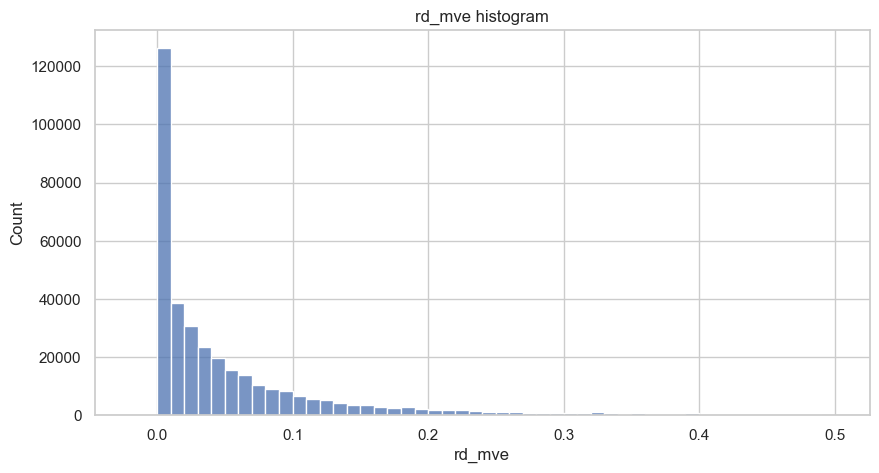

In [29]:
# Assuming the data ranges from some minimum to a maximum, you could set bins like this:
bin_width = 0.01  # Change the width as needed
#bins = np.arange(start=df3['roic'].min(), stop=df3['roic'].max() + bin_width, step=bin_width)
bins = np.arange(start=-0.02, stop=0.5 + bin_width, step=bin_width)

plt.figure(figsize=(10,5))
sns.histplot(df3['rd_mve'].dropna(), bins=bins)
plt.title('rd_mve histogram');
plt.show()
# Save the plot
#plot_path = os.path.join(save_dir, 'rd_mve.png')
#plt.savefig(plot_path)
#plt.close()

#print(f"Plot saved to {plot_path}")


It looks like some of the variables are normally distributed and some are skewed. **Therefore**, I decided to impute missing values using <u>**cross-sectional median**</u>

#### Why Cross-sectional Median Imputation


Imputing missing values using the cross-sectional median in a panel stock market data offers several advantages:

* Robustness to Outliers:The median is less sensitive to extreme values compared to the mean. Stock market data often contains outliers due to sudden market movements, and using the median helps to mitigate the influence of these anomalies.
  
* Simple and Intuitive:The median is straightforward to calculate and understand, making it an accessible method for handling missing data without requiring complex algorithms or assumptions.
  
* Preservation of Data Distribution:Using the median helps maintain the central tendency of the data, ensuring that the imputed values are representative of the typical values within the cross-section at each time point.
  
* Effective for Skewed Data:Stock market data can be highly skewed. The median is a better measure of central tendency for skewed distributions, providing a more accurate reflection of the data's central value.
  
* Consistency Across Time:In panel data, consistency in imputation methods is crucial. Using the cross-sectional median ensures that the method is uniformly applied across different time points, enhancing the reliability of the imputed values.
  
* Reduction of Bias:Imputing missing values with the cross-sectional median helps reduce bias in the data. It avoids over-representing or under-representing certain values that might occur if mean imputation were used in the presence of skewed distributions or outliers.
  
* Preservation of Variability:While the median is a measure of central tendency, it does not significantly distort the variability within the data. This helps in preserving the inherent characteristics and variability of the stock market data.
  
* Ease of Implementation:Median imputation is computationally efficient and easy to implement, making it a practical choice for large datasets, such as those often encountered in stock market analyses.

#### Impute Missing Values Using the Computed Medians
Grouping and Transform: Instead of grouping and then applying a function row by row, transform is used. This method applies a function to each group and then returns a DataFrame having the same indices as the original, which makes it perfect for filling NA values directly.

Fill NA with Medians: The fillna() method is inherently vectorized and when passed the DataFrame of medians (aligned with the original DataFrame), it fills the missing values efficiently.


In [30]:
# Calculate the median for each date
medians = df3[df3.columns.difference(['permno', 'date'])].groupby(df3['date']).transform('median')
#This line is used to select all columns except permno and the date column
#(which typically wouldn't be imputed or included in median calculations).

# Fill missing values with medians obtained (using vectorization)
df_filled = df3.fillna(medians)

print("DataFrame after efficient median imputation:")
print(df_filled)

DataFrame after efficient median imputation:
              date  permno         mvel1      beta    betasq     chmom  \
2890861 2005-01-31   10001  1.793310e+04  0.171490  0.029409 -0.083292   
2890862 2005-01-31   10002  2.712268e+05  0.439592  0.193241  0.311928   
2890863 2005-01-31   10012  2.444396e+04  2.390431  5.714160  1.160606   
2890864 2005-01-31   10025  1.239738e+05  1.280627  1.640004  0.189081   
2890865 2005-01-31   10026  4.423486e+05  0.552956  0.305761  0.122591   
...            ...     ...           ...       ...       ...       ...   
3760203 2016-12-30   93428  1.250976e+06  1.595315  2.545028 -0.137348   
3760204 2016-12-30   93429  5.600537e+06  0.298267  0.088963  0.206434   
3760205 2016-12-30   93433  2.473625e+04  2.324893  5.405128  0.328248   
3760206 2016-12-30   93434  8.573280e+04  0.628519  0.395036  0.020854   
3760207 2016-12-30   93436  2.840318e+07  1.588092  2.522036 -0.121017   

            dolvol   idiovol    indmom     mom1m  ...       stdcf 

In [31]:
#Check if all missing values were imputed
df_filled.isna().sum()

date          0
permno        0
mvel1         0
beta          0
betasq        0
             ..
retvol        0
std_dolvol    0
std_turn      0
zerotrade     0
sic2          0
Length: 97, dtype: int64

In [32]:
df_filled.head()

,date,permno,mvel1,beta,betasq,chmom,dolvol,idiovol,indmom,mom1m,...,stdcf,ms,baspread,ill,maxret,retvol,std_dolvol,std_turn,zerotrade,sic2
2890861,2005-01-31,10001,17933.100248,0.171490,0.029409,-0.083292,8.392405,0.049040,0.176481,0.161616,...,0.336042,0.0,0.041104,9.287831e-07,0.098305,0.030536,1.367916,4.837150,9.545455e-01,49.0
2890862,2005-01-31,10002,271226.816730,0.439592,0.193241,0.311928,10.671044,0.038464,0.135236,0.161502,...,0.185937,3.0,0.034417,7.604804e-08,0.060646,0.022040,0.559003,0.589179,7.357441e-08,60.0
2890863,2005-01-31,10012,24443.959321,2.390431,5.714160,1.160606,9.875205,0.100392,0.034932,0.618360,...,94.834975,3.0,0.129012,2.736418e-07,0.382637,0.109612,1.415737,89.852010,2.705058e-09,36.0
2890864,2005-01-31,10025,123973.750000,1.280627,1.640004,0.189081,9.949223,0.089470,0.378205,0.342129,...,0.061179,3.0,0.029248,4.595289e-08,0.077533,0.023926,1.124214,3.482231,2.491929e-08,30.0
2890865,2005-01-31,10026,442348.648990,0.552956,0.305761,0.122591,12.040063,0.049196,0.182657,0.043409,...,0.060416,5.0,0.027760,1.817653e-08,0.038527,0.016033,0.528608,1.208872,4.650884e-08,20.0


In [33]:
#Double check if the shape of original data frame is similar to the cleaned data frame
print(df_filled.shape)
print(df1.shape)

(869347, 97)
(869347, 97)


#### Save the final cleaned data frame 

In [34]:
#df_filled.to_csv('Cleaned_data1_2005-2016.csv', index=False)  # 'index=False' omits the index from the filed

## PCA applied on Multi-dimensional Time Series Data

### Definition

Principal Component Analysis (PCA) is a statistical technique used for dimensionality reduction. It transforms a dataset with potentially correlated variables into a set of linearly uncorrelated variables called principal components. The primary goal of PCA is to reduce the number of variables (dimensions) in the data while preserving as much variance (information) as possible. Here’s a detailed definition and explanation:

### Key Concepts

* 1- Dimensionality Reduction: PCA reduces the number of variables in a dataset by transforming it into a new set of variables, the principal components, which are fewer in number and uncorrelated.
  
* 2- Principal Components: These are new variables constructed as linear combinations of the original variables.
Each principal component captures the maximum possible variance in the data, subject to the constraint that it is orthogonal to (uncorrelated with) the preceding components.

* 3- Variance Maximization: PCA aims to capture the maximum amount of variance with the fewest number of principal components.
The first principal component accounts for the largest possible variance, the second principal component (orthogonal to the first) accounts for the next largest variance, and so on.

* 4- Orthogonality: Principal components are orthogonal (uncorrelated) to each other, ensuring that each component captures unique information from the dataset.

### Steps in PCA

* 1- Standardization: If the variables have different units or scales, standardize the data to have a mean of zero and a standard deviation of one.
  
* 2- Covariance Matrix Computation: Compute the covariance matrix to understand how the variables in the dataset vary with respect to each other.
  
* 3- Eigenvalues and Eigenvectors: Calculate the eigenvalues and eigenvectors of the covariance matrix. The eigenvectors determine the direction of the principal components, and the eigenvalues determine their magnitude (amount of variance they capture).
  
* 4- Principal Components Calculation: Sort the eigenvalues and corresponding eigenvectors in descending order of the eigenvalues. The top eigenvectors become the principal components.
  
* 5- Transform Data: Project the original data onto the principal components to get the transformed dataset.

### Application of PCA

* 1- Data Visualization: Reduce high-dimensional data to 2 or 3 principal components for easy visualization.
 
* 2- Noise Reduction: Remove noise and redundant information from data by keeping only the most significant components.

* 3- Feature Extraction and Engineering: Generate new features that capture the most important information from the original data.

* 4- Preprocessing for Machine Learning: Simplify models by reducing the number of input variables, leading to faster training and potentially better performance by eliminating irrelevant features.

### Project Goal and the Challenge

Applying Principal Component Analysis (PCA) to high-dimensional time series data is challenging and complex due to several inherent properties and practical considerations of time series and high-dimensional datasets. Here are the key challenges:

**1. Temporal Dependency**
Sequential Nature: Time series data points are temporally ordered and often exhibit dependencies, meaning that current values depend on previous values.
Autocorrelation: The presence of autocorrelation (correlation of the time series with lagged versions of itself) complicates the assumption of independence among data points, which PCA relies on.

**2. Non-Stationarity**
Changing Statistics: Time series data often exhibit non-stationarity, where statistical properties like mean and variance change over time due to trends, seasonality, and other factors.
Trend and Seasonality: These components must be removed or accounted for before applying PCA, requiring additional preprocessing steps like differencing, detrending, or seasonal decomposition.

**3. High Dimensionality**
Curse of Dimensionality: High-dimensional data can lead to computational inefficiencies and numerical instability in PCA calculations.
Sparsity: As the number of dimensions increases, the data becomes sparse, making it harder to capture meaningful patterns.
Interpretability: Interpreting principal components in a high-dimensional space can be challenging and less intuitive.

**4. Feature Extraction**
Lagged Features: Creating lagged versions of the time series (e.g., using past values as features) increases the dimensionality further, complicating the analysis.
Windowing: Dividing the time series into overlapping windows to capture local patterns introduces additional complexity in maintaining the temporal context.

**5. Scalability**
Computational Resources: Performing PCA on large high-dimensional datasets requires significant computational resources and memory.
Efficiency: Efficient algorithms and data structures are needed to handle the computation of covariance matrices and eigen decomposition in high dimensions.

**6. Handling Missing Data**
Imputation: Time series data often contains missing values, which need to be imputed accurately to avoid biasing the PCA results.
Temporal Gaps: Temporal gaps and irregular time intervals pose additional challenges for consistent data preprocessing.

**7. Multivariate Time Series**
Interdependencies: In multivariate time series, different time series may be interdependent, adding complexity to capturing these relationships with PCA.
Dimension Explosion: Combining multiple time series into a single dataset further increases dimensionality and computational burden.

### Notes

Note the following:

* 1- An extensive EDA has been applied to this data in another project
* 2- Missing values were imputed in another project using cross-sectional median imputation
* 3- Time series analysis was applied in another project were I studied the stationarity and linearity of the variables
* 4- Statistical tests (ADF and KPSS) were applied before do investigate stationarity of time series

* **MOST Importantly:** The aim of the following PCA anlysis is to just extract the most informative feauters out of 95 stock level characteristics to reduce the dimensionality of the data set so I can use it later to develop advanced machine learning techniques on the US stock market data.

#### Imports

In [35]:
import numpy as np
import pandas as pd

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


import matplotlib.pyplot as plt
import warnings

import datetime as dt
import os

from collections import Counter

In [36]:
df = pd.read_csv('/Users/adel/Desktop/Masters Thesis/Cleaned_data1_2005-2016.csv')

#### Subset the data to take all stock ids that are available in all years

In [37]:
# Ensure the date column is of datetime type
df['date'] = pd.to_datetime(df['date'])

# Step 1: Identify all unique dates in the dataset
unique_dates = df['date'].nunique()

# Step 2: Group by permno and count the unique dates for each permno
permno_date_counts = df.groupby('permno')['date'].nunique()

# Step 3: Filter permno values that are present in all unique dates
permno_in_all_dates = permno_date_counts[permno_date_counts == unique_dates].index

# Filter the original DataFrame to include only rows with these permno values (if needed)
df_filtered = df[df['permno'].isin(permno_in_all_dates)]

#### Filter the data to take only year of 2015 and 2016

In [38]:
df1 = df_filtered[df_filtered['date'] >= '2015-01-30']

#### Randomly select 50 stock ids to perform the analysis on 

In [39]:
# Ensure the permno column has the desired number of unique permno values
unique_permno = df1['permno'].unique()

# Check the number of unique permno values
total_unique_permno = len(unique_permno)
print(f"Total unique permno values: {total_unique_permno}")

# Define the number of permno values you want to subset
num_permno_to_select = 50

# Set the random seed for reproducibility
np.random.seed(40)

# Randomly select the desired number of permno values
selected_permno = np.random.choice(unique_permno, num_permno_to_select, replace=False)

# Filter the original DataFrame to include only rows with these selected permno values
df_50 = df1[df1['permno'].isin(selected_permno)]

Total unique permno values: 2867


In [40]:
df_50['permno'].unique()

array([10044, 11581, 11786, 18403, 20117, 24969, 52090, 53225, 61508,
       62958, 63125, 63765, 64629, 70033, 72996, 75039, 76123, 76804,
       77768, 78629, 79864, 80233, 81044, 81084, 81740, 82276, 82541,
       83856, 83976, 84032, 84397, 85058, 85346, 85839, 87379, 87447,
       87505, 87541, 88466, 88615, 88742, 89365, 89591, 89708, 89746,
       89879, 89897, 89965, 90266, 90346])

In [41]:
df_50['date'] = pd.to_datetime(df_50['date'])
df_50['year'] = df_50['date'].dt.year

/var/folders/y2/nn4ysj1j0vjgh4j8xg9_nbl00000gq/T/ipykernel_3886/927320829.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/y2/nn4ysj1j0vjgh4j8xg9_nbl00000gq/T/ipykernel_3886/927320829.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [42]:
df_50_f = df_50.copy()

#### Create a nested for loop to iterate over every permno for each year and fit a PCA model 
By creating a nested for loop that iterates on both a unique stock ID and a unique date, this will take into consideration that PCA model is being applied not only on a time series data but on a Panel Data (Time Series Data + Cross-sectional Data)

**Limitations:** It has an increased computation cost since its fitting a pca model on every stock ID and specific year 

**advantages:** This model is optimal in working with high dimensional panel data and provides acurate results that accomedates for temperoral changes in a time series 

In [43]:
# List to store PCA results
pca_results = []

# Get unique stock IDs and years
unique_stock_ids = df_50_f['permno'].unique()
unique_years = df_50_f['year'].unique()

# Iterate over each stock ID and year combination
for stock_id in unique_stock_ids:
    for year in unique_years:
        # Print current stock_id and year to track progress
        print(f"Processing stock_id: {stock_id}, year: {year}")
        print("________________________________________________________")
        # Filter the DataFrame for the current stock ID and year
        subset_df = df_50_f[(df_50_f['permno'] == stock_id) & (df_50_f['date'].dt.year == year)]
        print("Subset data frame", subset_df)
        print("_________________________________________________________")

        # Ensure we're working with a copy
        subset_df = subset_df.copy()
        
        # Check if the subset is not empty and has more than one sample
        if not subset_df.empty and len(subset_df) > 1:
            # Drop non-feature columns
            features_df = subset_df.drop(columns=['date', 'permno','year'], axis=1)
            print("-----------------------------------------------------")
            print("Features dataframe", features_df)
           
            # Initialize the scaler and standardize the data   
            scaler = StandardScaler()
            standardized_features = scaler.fit_transform(features_df)
            print("------------------------------------------------------")
            print("Standardized features:", standardized_features)
                  
            # Determine the number of components dynamically
            n_components = min(len(features_df), features_df.shape[1])

            # Apply PCA
            pca = PCA(n_components=n_components)
            principal_components = pca.fit_transform(standardized_features)
            print("Principal Components:", principal_components)

            # Store the results
            pca_result = {
                'stock_id': stock_id,
                'year': year,
                'principal_components': principal_components,
                'explained_variance': pca.explained_variance_ratio_,
                'loadings': pca.components_.T
            }
            pca_results.append(pca_result)
            
            print("------------------------------------------------------")
            print(pca_result)
            print("------------------------------------------------------")

Processing stock_id: 10044, year: 2015
________________________________________________________
Subset data frame              date  permno         mvel1      beta    betasq     chmom  \
731062 2015-01-30   10044  80071.359302  0.583461  0.340426 -0.145679   
736830 2015-02-27   10044  83047.590697  0.596085  0.355317 -0.036235   
742593 2015-03-31   10044  91818.512753  0.611652  0.374118  0.086244   
748348 2015-04-30   10044  84001.611606  0.628821  0.395415  0.045085   
754094 2015-05-29   10044  76665.750000  0.653673  0.427288  0.042118   
759848 2015-06-30   10044  77991.387958  0.800777  0.641244 -0.060070   
765621 2015-07-31   10044  78269.310453  0.804101  0.646578  0.009101   
771427 2015-08-31   10044  77140.137280  0.805957  0.649567 -0.114640   
777257 2015-09-30   10044  70036.471562  0.753410  0.567627 -0.398830   
783079 2015-10-30   10044  65688.750000  0.758733  0.575675 -0.311738   
788890 2015-11-30   10044  64754.510891  0.759332  0.576585 -0.185564   
794701 201

#### Store the PC's and loadings into a dataframe 

In [44]:
# Lists to store the principal components and loadings dataframes
principal_dfs = []
loadings_dfs = []

# Iterate over all PCA results
for i, result in enumerate(pca_results):
    print(f"Processing PCA result {i+1}")
    
    print("Stock ID:", result['stock_id'])
    print("Year:",result['year'])
    print("Explained Variance Ratios:", result['explained_variance'])
    print("Principal Components:\n", result['principal_components'])
    print("Loadings (Eigenvectors):\n", result['loadings'])


    # Save the results into a dataframe
    principal_df = pd.DataFrame(data=result['principal_components'])
    
    # Save the loadings into a dataframe
    loadings_df = pd.DataFrame(data=result['loadings'], columns=[f'PC{j+1}' for j in range(result['loadings'].shape[1])],
                               index=features_df.columns)


    # Append the dataframes to the lists
    principal_dfs.append(principal_df)
    loadings_dfs.append(loadings_df)

Processing PCA result 1
Stock ID: 10044
Year: 2015
Explained Variance Ratios: [7.00554692e-01 8.56548477e-02 7.18086030e-02 5.22637549e-02
 2.93022386e-02 2.50228178e-02 1.56620836e-02 8.06584982e-03
 5.33175633e-03 4.23555958e-03 2.09779711e-03 2.02779533e-32]
Principal Components:
 [[-6.07815764e+00 -2.82656856e+00  3.12302215e-01 -2.90875319e+00
  -1.13628687e+00  6.56539468e-01 -1.30932994e-01  1.11322395e+00
  -1.40845597e+00  1.83660379e-01  3.29293244e-01  1.32822511e-15]
 [-6.21745282e+00 -3.72137969e+00 -3.11754829e-01 -1.56301368e+00
  -1.81959638e+00 -3.56330927e-02  5.03800239e-01 -1.39910406e-01
   1.62254115e+00  5.22598777e-01  6.66998553e-02  1.32822511e-15]
 [-6.31930738e+00 -3.46454801e+00  6.41303766e-02 -4.51620708e-01
   1.51068351e+00 -2.32106824e+00 -1.00417968e-01 -1.06100517e+00
  -3.08341158e-01 -1.02818670e+00 -3.39939899e-01  1.32822511e-15]
 [-6.14557270e+00 -7.17940026e-01 -2.70440349e-01  3.88435684e+00
   1.46352498e-01  9.86026965e-01 -1.99776153e-01 -1

#### Extract the top 20 informative feautures

In [45]:
# Define the stock_id and year arrays
stock_ids = np.array([10044, 11581, 11786, 18403, 20117, 24969, 52090, 53225, 61508,
       62958, 63125, 63765, 64629, 70033, 72996, 75039, 76123, 76804,
       77768, 78629, 79864, 80233, 81044, 81084, 81740, 82276, 82541,
       83856, 83976, 84032, 84397, 85058, 85346, 85839, 87379, 87447,
       87505, 87541, 88466, 88615, 88742, 89365, 89591, 89708, 89746,
       89879, 89897, 89965, 90266, 90346])

years = np.array([2015, 2016])

# Create the list of dictionaries
metadata = [{"stock_id": stock_id, "year": year} for stock_id in stock_ids for year in years]

# Print the list of dictionaries
for entry in metadata:
    print(entry)

{'stock_id': 10044, 'year': 2015}
{'stock_id': 10044, 'year': 2016}
{'stock_id': 11581, 'year': 2015}
{'stock_id': 11581, 'year': 2016}
{'stock_id': 11786, 'year': 2015}
{'stock_id': 11786, 'year': 2016}
{'stock_id': 18403, 'year': 2015}
{'stock_id': 18403, 'year': 2016}
{'stock_id': 20117, 'year': 2015}
{'stock_id': 20117, 'year': 2016}
{'stock_id': 24969, 'year': 2015}
{'stock_id': 24969, 'year': 2016}
{'stock_id': 52090, 'year': 2015}
{'stock_id': 52090, 'year': 2016}
{'stock_id': 53225, 'year': 2015}
{'stock_id': 53225, 'year': 2016}
{'stock_id': 61508, 'year': 2015}
{'stock_id': 61508, 'year': 2016}
{'stock_id': 62958, 'year': 2015}
{'stock_id': 62958, 'year': 2016}
{'stock_id': 63125, 'year': 2015}
{'stock_id': 63125, 'year': 2016}
{'stock_id': 63765, 'year': 2015}
{'stock_id': 63765, 'year': 2016}
{'stock_id': 64629, 'year': 2015}
{'stock_id': 64629, 'year': 2016}
{'stock_id': 70033, 'year': 2015}
{'stock_id': 70033, 'year': 2016}
{'stock_id': 72996, 'year': 2015}
{'stock_id': 7

In [46]:
# Directory to save the plots
#save_dir = 'pca_plots'
#os.makedirs(save_dir, exist_ok=True)

Processing DataFrame 1
Variable Importance:
dolvol        2.273977
pricedelay    2.159608
std_turn      1.874858
beta          1.801401
retvol        1.669552
                ...   
convind       0.000000
sin           0.000000
divi          0.000000
divo          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.273977
pricedelay    2.159608
std_turn      1.874858
beta          1.801401
retvol        1.669552
maxret        1.654766
std_dolvol    1.651837
ill           1.642768
mvel1         1.628655
indmom        1.621629
mom1m         1.547191
mom12m        1.534203
rsup          1.517205
chmom         1.469780
turn          1.466550
orgcap        1.466075
mom36m        1.460835
zerotrade     1.442365
idiovol       1.410921
baspread      1.402985
dtype: float64


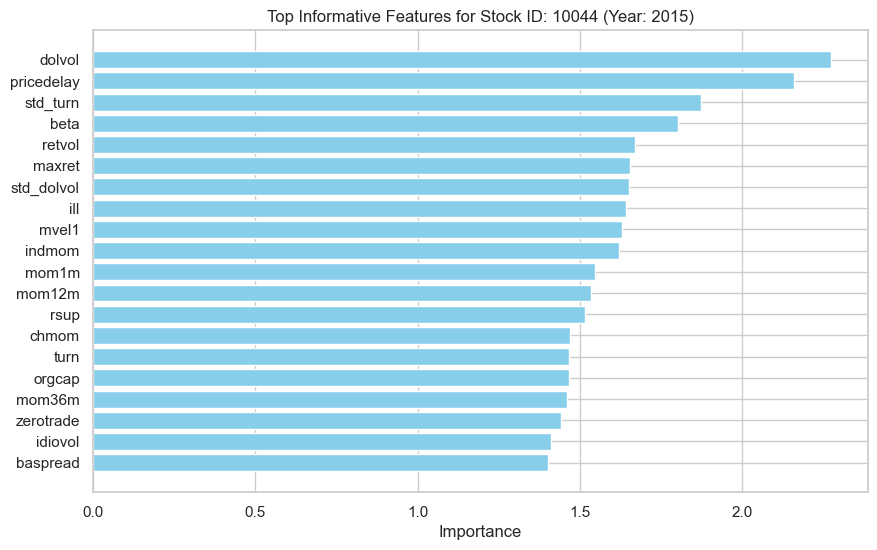

Processing DataFrame 2
Variable Importance:
mvel1         2.375240
dolvol        2.176685
pricedelay    2.154383
betasq        2.027252
std_dolvol    1.998076
                ...   
securedind    0.000000
secured       0.000000
rd            0.000000
ps            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1         2.375240
dolvol        2.176685
pricedelay    2.154383
betasq        2.027252
std_dolvol    1.998076
chmom         1.952629
indmom        1.825802
maxret        1.819976
mom1m         1.814073
zerotrade     1.789569
turn          1.788871
std_turn      1.736184
beta          1.722836
ill           1.686604
stdacc        1.566354
rd_sale       1.560826
orgcap        1.511277
baspread      1.479226
roavol        1.411768
idiovol       1.378789
dtype: float64


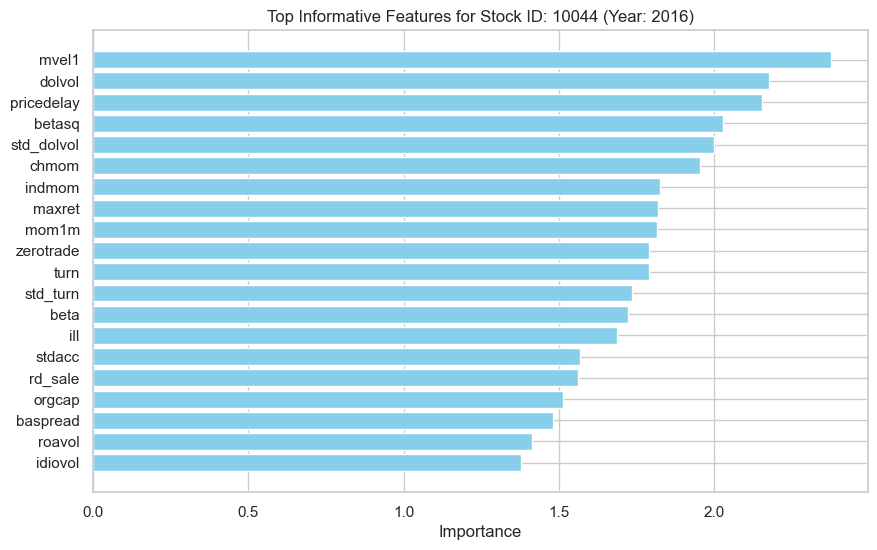

Processing DataFrame 3
Variable Importance:
pricedelay    2.453401
ill           2.048141
std_turn      1.955227
dolvol        1.920020
realestate    1.849224
                ...   
sin           0.000000
securedind    0.000000
rd            0.000000
ps            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.453401
ill           2.048141
std_turn      1.955227
dolvol        1.920020
realestate    1.849224
mom36m        1.790110
mvel1         1.786071
mom6m         1.774814
mom1m         1.761630
chmom         1.755997
std_dolvol    1.736772
turn          1.706183
maxret        1.685672
idiovol       1.660993
mom12m        1.658973
zerotrade     1.614386
chtx          1.604963
betasq        1.573950
aeavol        1.567825
beta          1.448265
dtype: float64


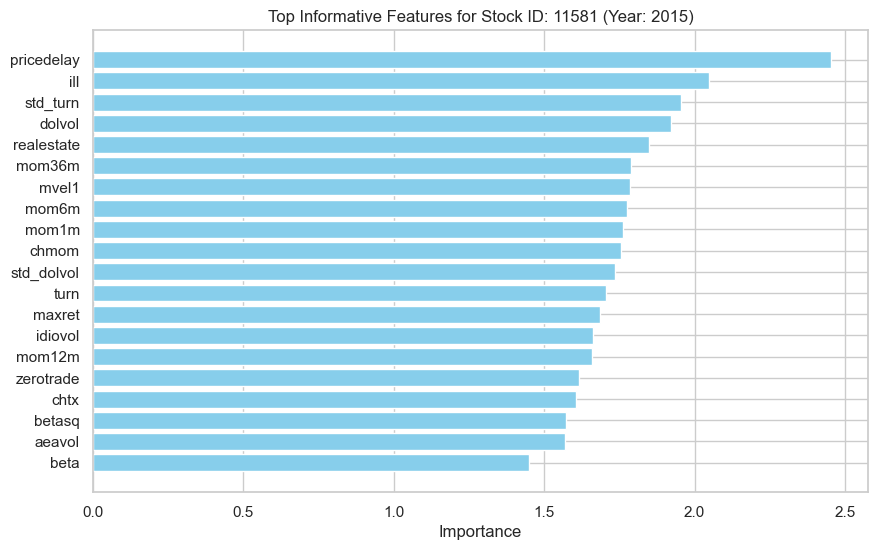

Processing DataFrame 4
Variable Importance:
mom12m        2.222073
dolvol        2.076867
ill           2.015672
mvel1         2.004817
pricedelay    1.834556
                ...   
divo          0.000000
sin           0.000000
securedind    0.000000
ps            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom12m        2.222073
dolvol        2.076867
ill           2.015672
mvel1         2.004817
pricedelay    1.834556
rsup          1.728142
chmom         1.718844
turn          1.684446
realestate    1.663580
mom1m         1.648868
mom6m         1.646214
baspread      1.641228
idiovol       1.572238
maxret        1.557521
zerotrade     1.547858
chtx          1.519171
betasq        1.490923
beta          1.477565
std_turn      1.460616
std_dolvol    1.459666
dtype: float64


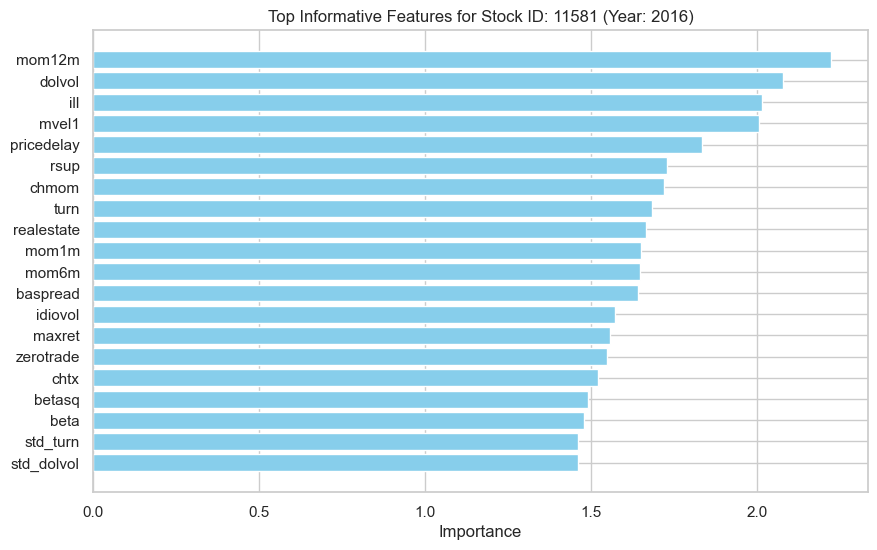

Processing DataFrame 5
Variable Importance:
ill           2.267202
mvel1         2.092592
dolvol        2.061908
pricedelay    2.055769
mom12m        1.899947
                ...   
divo          0.000000
dy            0.000000
securedind    0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
ill           2.267202
mvel1         2.092592
dolvol        2.061908
pricedelay    2.055769
mom12m        1.899947
mom1m         1.859365
mom36m        1.836373
std_dolvol    1.730115
saleinv       1.727366
zerotrade     1.675443
aeavol        1.671385
maxret        1.654252
stdcf         1.627261
beta          1.560447
retvol        1.553382
betasq        1.551481
mom6m         1.524933
stdacc        1.517967
std_turn      1.504186
indmom        1.495902
dtype: float64


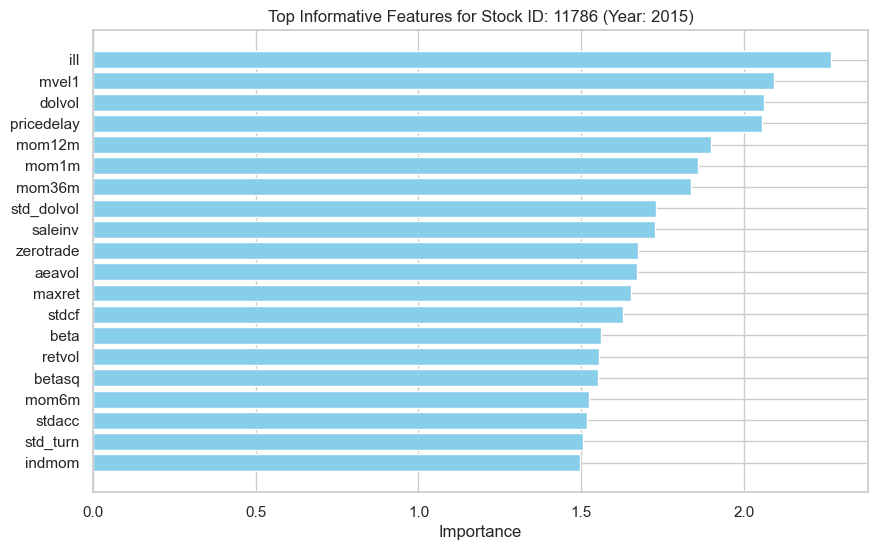

Processing DataFrame 6
Variable Importance:
indmom        2.166707
maxret        2.147598
pricedelay    2.145618
dolvol        2.035878
std_turn      2.011188
                ...   
securedind    0.000000
sin           0.000000
convind       0.000000
dy            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.166707
maxret        2.147598
pricedelay    2.145618
dolvol        2.035878
std_turn      2.011188
realestate    2.005952
mvel1         1.947637
cash          1.727999
std_dolvol    1.724181
ill           1.704852
stdcf         1.673036
zerotrade     1.646175
mom1m         1.632000
beta          1.620220
roeq          1.614701
mom6m         1.568280
baspread      1.568189
stdacc        1.561468
mom36m        1.513287
roaq          1.508479
dtype: float64


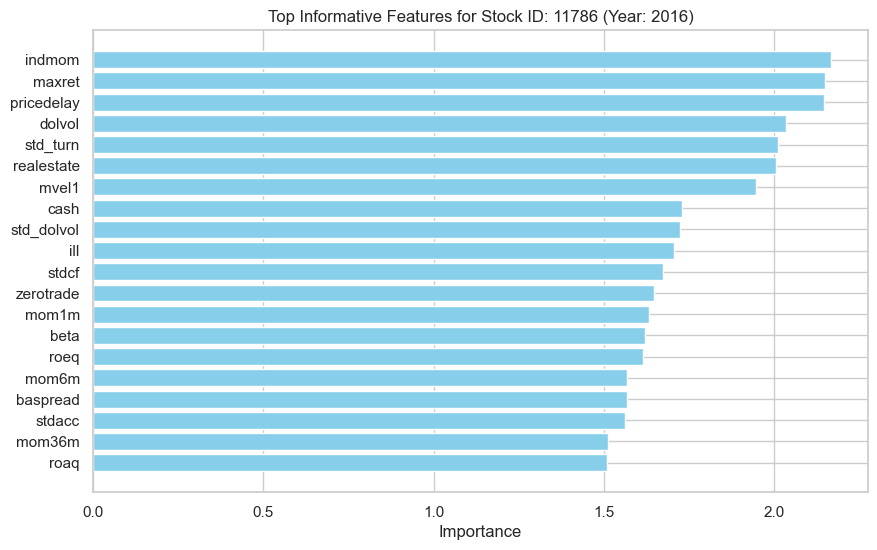

Processing DataFrame 7
Variable Importance:
dolvol        2.357168
zerotrade     2.215530
mvel1         2.160735
pricedelay    2.053480
std_turn      1.912876
                ...   
sin           0.000000
rd_sale       0.000000
rd_mve        0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.357168
zerotrade     2.215530
mvel1         2.160735
pricedelay    2.053480
std_turn      1.912876
mom1m         1.906559
maxret        1.862290
std_dolvol    1.723053
ill           1.697084
idiovol       1.697029
baspread      1.621723
indmom        1.555855
age           1.513503
mom12m        1.503878
aeavol        1.492703
retvol        1.486190
mom36m        1.445044
mve_ia        1.422995
cinvest       1.416461
betasq        1.405335
dtype: float64


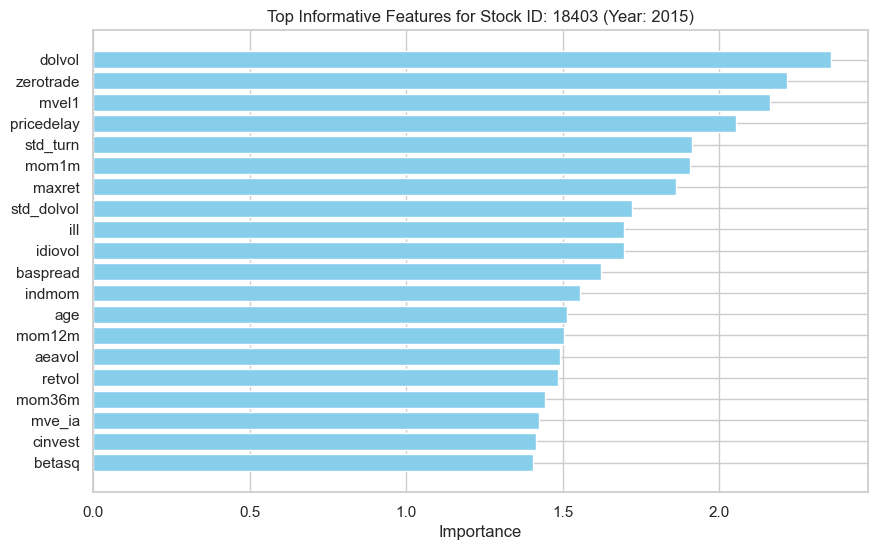

Processing DataFrame 8
Variable Importance:
turn        2.234484
mom12m      2.006988
dolvol      1.892534
chmom       1.873287
baspread    1.841490
              ...   
rd_sale     0.000000
rd_mve      0.000000
rd          0.000000
ps          0.000000
sic2        0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
turn          2.234484
mom12m        2.006988
dolvol        1.892534
chmom         1.873287
baspread      1.841490
zerotrade     1.822966
aeavol        1.813090
beta          1.777435
mvel1         1.755624
mve_ia        1.680703
age           1.650837
orgcap        1.605795
roavol        1.597769
pricedelay    1.565031
mom1m         1.562366
betasq        1.549453
std_turn      1.522920
cinvest       1.411328
std_dolvol    1.408549
mom6m         1.401238
dtype: float64


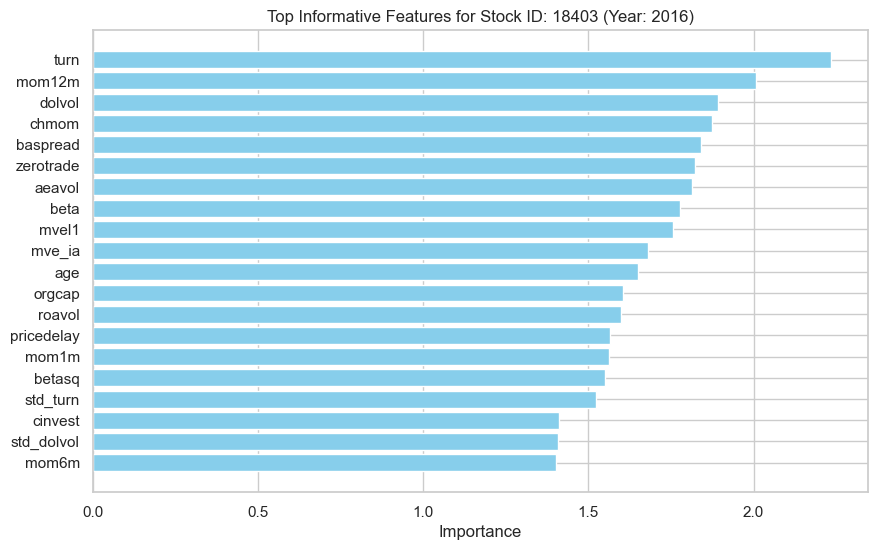

Processing DataFrame 9
Variable Importance:
baspread      2.234817
maxret        2.122722
dolvol        2.106579
pricedelay    1.992422
mvel1         1.831172
                ...   
divi          0.000000
divo          0.000000
dy            0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
baspread           2.234817
maxret             2.122722
dolvol             2.106579
pricedelay         1.992422
mvel1              1.831172
mom1m              1.800676
ill                1.795951
indmom             1.760078
std_dolvol         1.690386
cinvest            1.676692
std_turn           1.631997
zerotrade          1.609495
pchsale_pchinvt    1.554666
beta               1.526766
rsup               1.516463
mom6m              1.465895
betasq             1.447684
turn               1.441543
chtx               1.435795
pchsaleinv         1.427662
dtype: float64


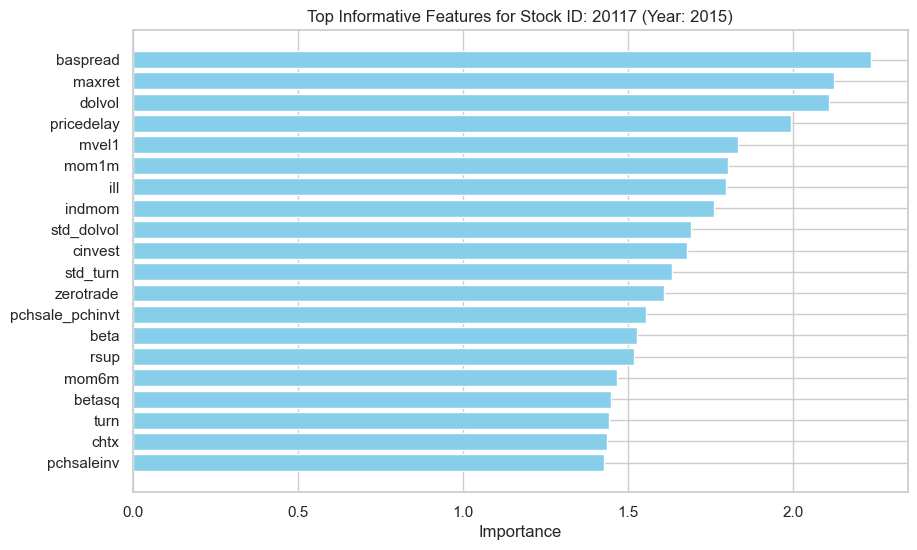

Processing DataFrame 10
Variable Importance:
mvel1         2.341970
mom1m         2.220698
dolvol        2.119796
mom12m        1.957661
zerotrade     1.912994
                ...   
divi          0.000000
divo          0.000000
dy            0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1              2.341970
mom1m              2.220698
dolvol             2.119796
mom12m             1.957661
zerotrade          1.912994
pricedelay         1.831082
ill                1.720143
saleinv            1.699462
std_dolvol         1.676654
indmom             1.659393
chmom              1.625529
baspread           1.555338
mom6m              1.551571
turn               1.539084
orgcap             1.519288
rsup               1.508760
std_turn           1.500865
maxret             1.424006
pchsale_pchinvt    1.417624
retvol             1.398671
dtype: float64


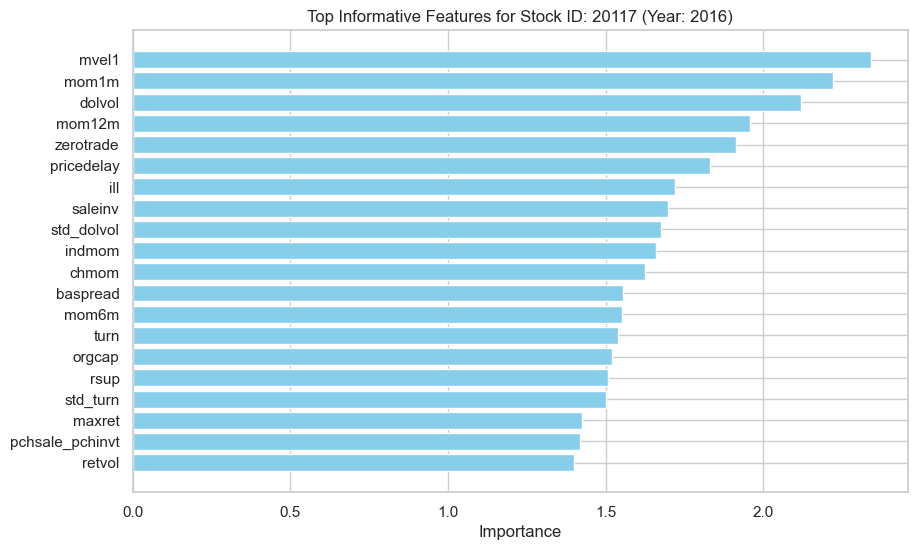

Processing DataFrame 11
Variable Importance:
mvel1         2.165055
dolvol        2.100384
std_dolvol    2.050078
chmom         1.940985
zerotrade     1.923456
                ...   
convind       0.000000
divi          0.000000
divo          0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1         2.165055
dolvol        2.100384
std_dolvol    2.050078
chmom         1.940985
zerotrade     1.923456
turn          1.880023
mom1m         1.868061
maxret        1.843259
nincr         1.824853
baspread      1.786980
ill           1.746209
aeavol        1.571730
cinvest       1.555749
chtx          1.551601
mom36m        1.512827
betasq        1.479741
retvol        1.377963
std_turn      1.364365
beta          1.359559
mom6m         1.358072
dtype: float64


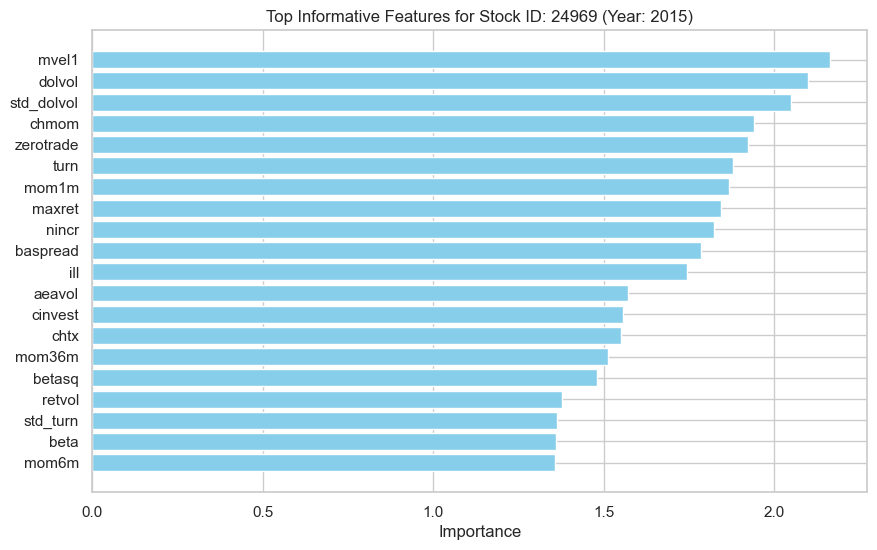

Processing DataFrame 12
Variable Importance:
dolvol        2.490891
maxret        2.261563
zerotrade     2.139677
retvol        2.079300
std_turn      2.056542
                ...   
convind       0.000000
divi          0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.490891
maxret        2.261563
zerotrade     2.139677
retvol        2.079300
std_turn      2.056542
mom1m         2.032523
mvel1         2.008016
std_dolvol    1.917705
pricedelay    1.900877
mom6m         1.812888
baspread      1.733754
ill           1.688325
aeavol        1.674011
betasq        1.584010
turn          1.563185
realestate    1.540344
chmom         1.508401
roavol        1.452220
idiovol       1.413535
nincr         1.339499
dtype: float64


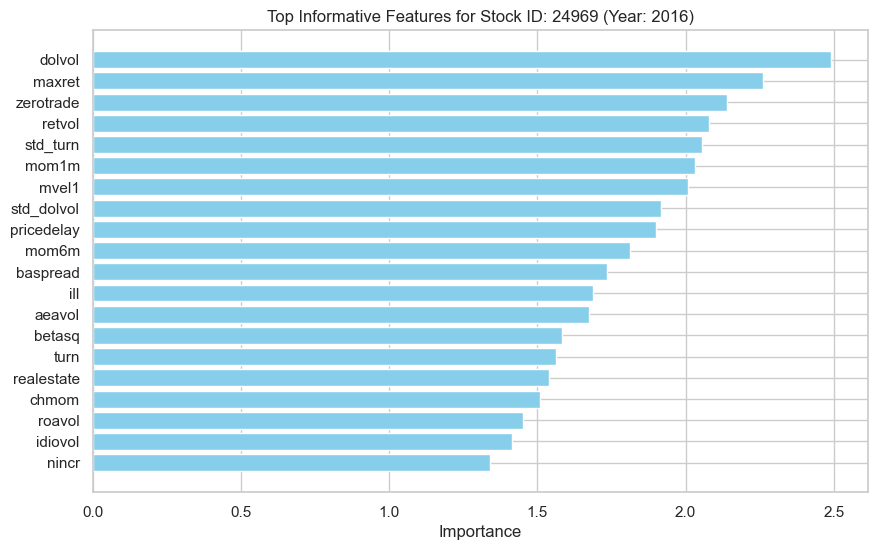

Processing DataFrame 13
Variable Importance:
mom1m         2.501363
pricedelay    2.460196
mom6m         2.087778
std_turn      1.915822
indmom        1.898750
                ...   
rd            0.000000
convind       0.000000
sin           0.000000
divi          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom1m         2.501363
pricedelay    2.460196
mom6m         2.087778
std_turn      1.915822
indmom        1.898750
chmom         1.898677
mom12m        1.885029
ill           1.848015
maxret        1.838111
mvel1         1.831375
dolvol        1.739601
std_dolvol    1.700662
aeavol        1.607132
cash          1.562587
betasq        1.527545
baspread      1.520039
idiovol       1.519003
turn          1.505504
beta          1.498462
zerotrade     1.390648
dtype: float64


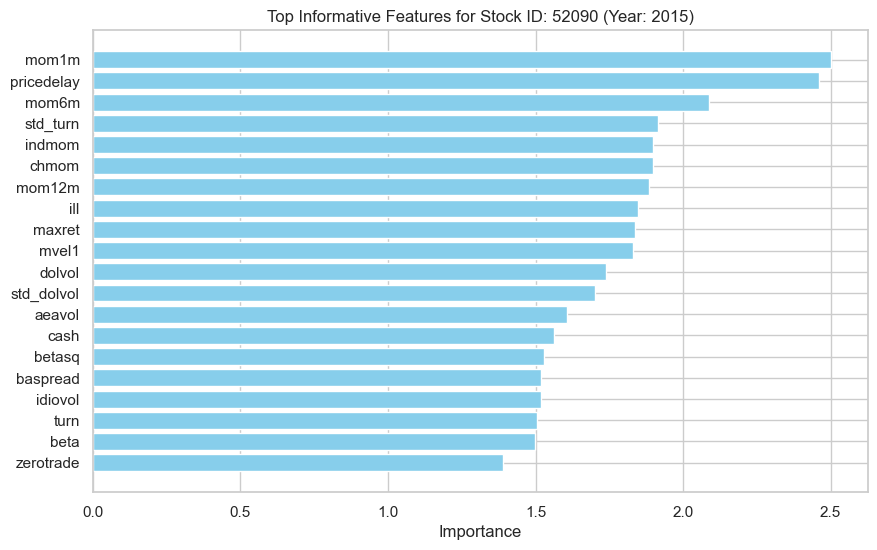

Processing DataFrame 14
Variable Importance:
ill           2.211957
dolvol        2.210035
std_dolvol    2.171696
mom12m        2.125714
mom6m         2.054780
                ...   
sin           0.000000
convind       0.000000
divi          0.000000
divo          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
ill           2.211957
dolvol        2.210035
std_dolvol    2.171696
mom12m        2.125714
mom6m         2.054780
baspread      1.985167
mom1m         1.929329
zerotrade     1.915616
retvol        1.873727
mvel1         1.813721
std_turn      1.772004
indmom        1.687225
chmom         1.650234
aeavol        1.589937
maxret        1.564893
mom36m        1.478500
idiovol       1.468026
pricedelay    1.450273
stdcf         1.436789
stdacc        1.404735
dtype: float64


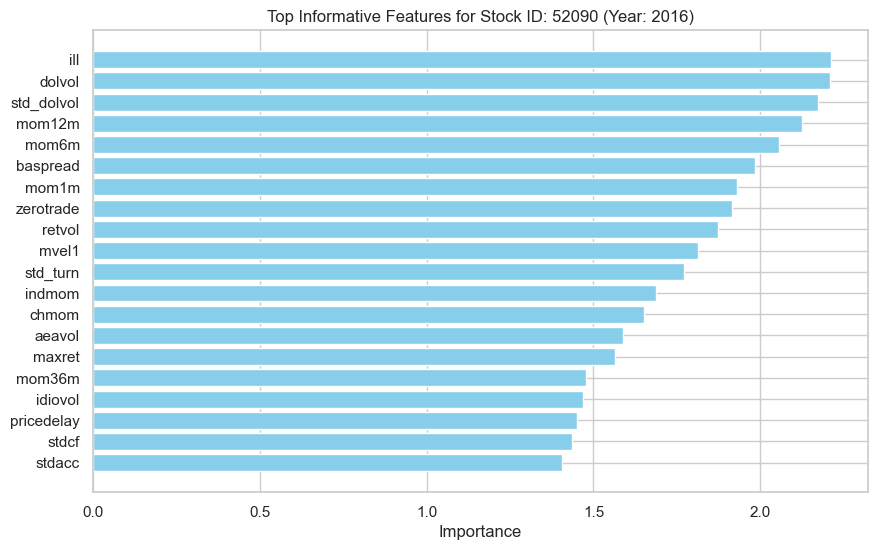

Processing DataFrame 15
Variable Importance:
std_dolvol    2.271145
maxret        2.185034
zerotrade     2.159953
std_turn      2.081975
retvol        2.032445
                ...   
rd            0.000000
divo          0.000000
divi          0.000000
convind       0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
std_dolvol    2.271145
maxret        2.185034
zerotrade     2.159953
std_turn      2.081975
retvol        2.032445
mvel1         2.030938
pricedelay    1.978494
indmom        1.970354
dolvol        1.767115
mom1m         1.758551
mom36m        1.684536
mom12m        1.681838
ill           1.510740
cinvest       1.509728
chmom         1.503758
beta          1.487026
betasq        1.465336
stdcf         1.434560
stdacc        1.427934
aeavol        1.426022
dtype: float64


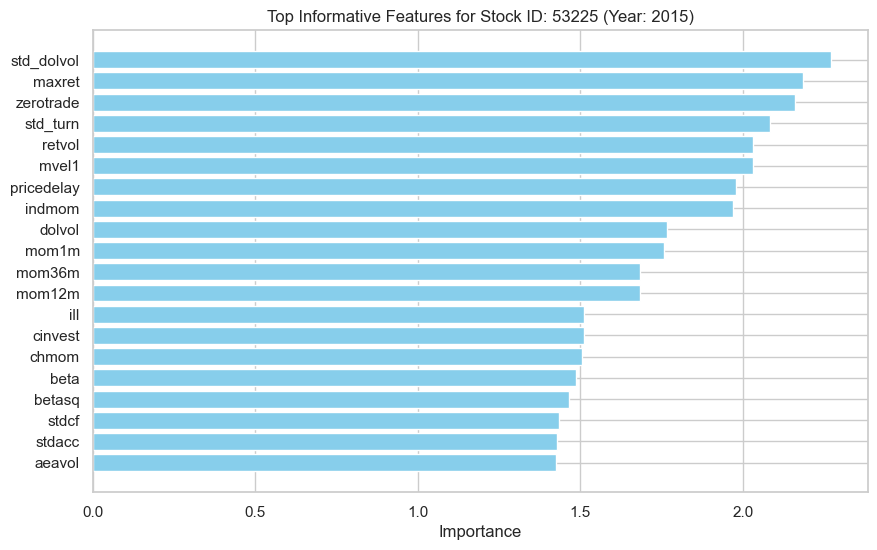

Processing DataFrame 16
Variable Importance:
zerotrade     2.164775
dolvol        2.126535
std_dolvol    2.055418
beta          2.030180
pricedelay    1.973948
                ...   
securedind    0.000000
sin           0.000000
divi          0.000000
divo          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
zerotrade     2.164775
dolvol        2.126535
std_dolvol    2.055418
beta          2.030180
pricedelay    1.973948
mvel1         1.942743
std_turn      1.933284
mom1m         1.835527
ill           1.795958
maxret        1.751605
betasq        1.721022
indmom        1.659905
mom12m        1.646599
chtx          1.589561
nincr         1.571139
rsup          1.533522
mom36m        1.500686
retvol        1.341438
baspread      1.336072
idiovol       1.298065
dtype: float64


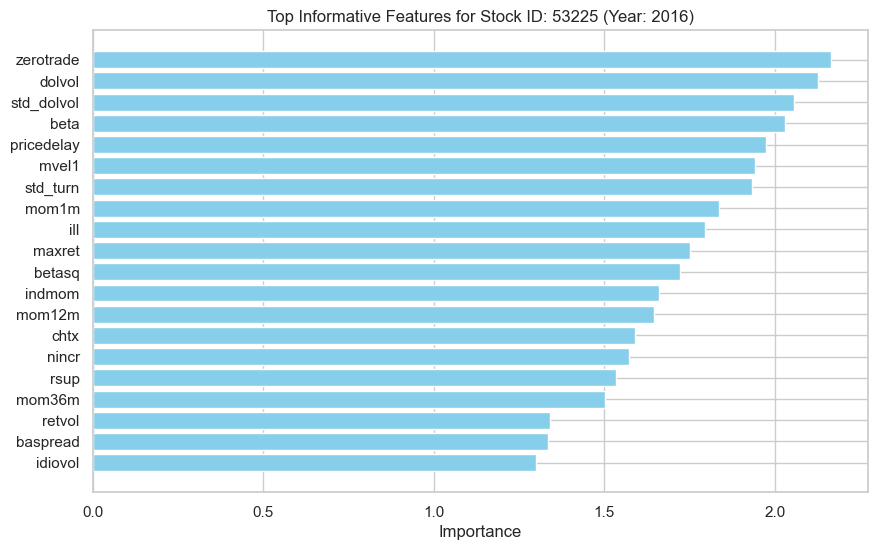

Processing DataFrame 17
Variable Importance:
pricedelay    2.289413
dolvol        2.246430
std_turn      2.221927
zerotrade     2.213340
std_dolvol    2.115277
                ...   
divi          0.000000
divo          0.000000
dy            0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.289413
dolvol        2.246430
std_turn      2.221927
zerotrade     2.213340
std_dolvol    2.115277
mom1m         2.083334
ill           2.080228
mom36m        2.069766
mom6m         1.864351
retvol        1.827577
indmom        1.793230
turn          1.773712
chmom         1.662482
baspread      1.528018
maxret        1.507023
mvel1         1.490373
roeq          1.469202
roaq          1.458645
cash          1.366238
betasq        1.354107
dtype: float64


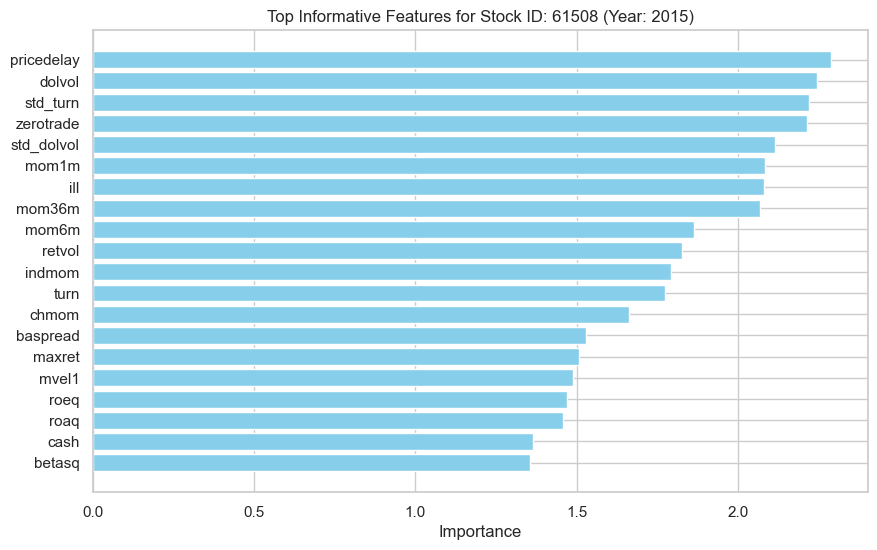

Processing DataFrame 18
Variable Importance:
ill           2.179763
zerotrade     2.119402
std_dolvol    1.975589
mvel1         1.971930
dolvol        1.960517
                ...   
divi          0.000000
divo          0.000000
dy            0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
ill           2.179763
zerotrade     2.119402
std_dolvol    1.975589
mvel1         1.971930
dolvol        1.960517
chtx          1.944866
idiovol       1.941618
mom6m         1.892589
mom1m         1.873169
std_turn      1.823051
retvol        1.739898
mom36m        1.706978
pricedelay    1.692570
baspread      1.637635
chmom         1.631319
maxret        1.545801
ear           1.511979
cinvest       1.452800
indmom        1.439606
betasq        1.388077
dtype: float64


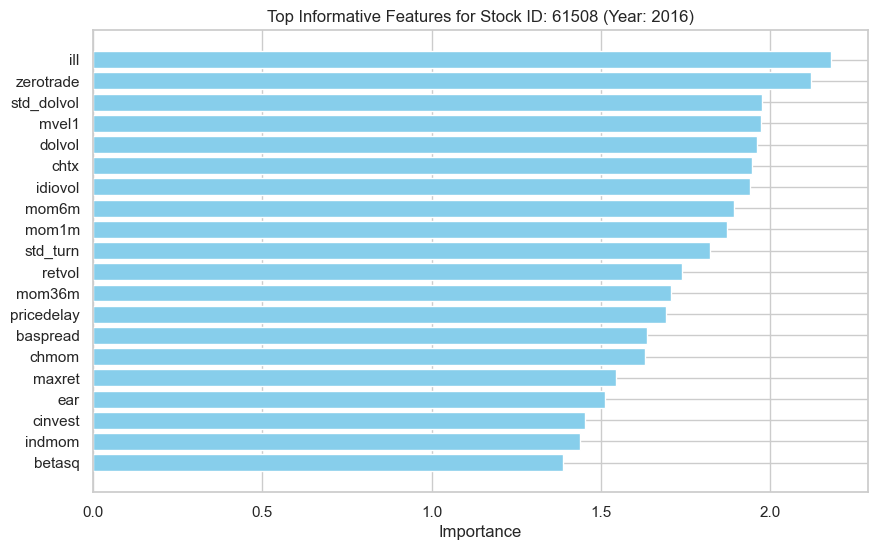

Processing DataFrame 19
Variable Importance:
dolvol        2.309134
mvel1         1.981547
idiovol       1.961420
mom1m         1.905512
mom12m        1.905218
                ...   
divi          0.000000
divo          0.000000
securedind    0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.309134
mvel1         1.981547
idiovol       1.961420
mom1m         1.905512
mom12m        1.905218
mom6m         1.834320
mom36m        1.757523
rd_sale       1.736683
std_dolvol    1.666377
baspread      1.655312
ill           1.646287
zerotrade     1.629930
std_turn      1.612617
turn          1.605792
chmom         1.583809
rd_mve        1.573772
pricedelay    1.530370
rsup          1.524488
maxret        1.498544
chtx          1.455248
dtype: float64


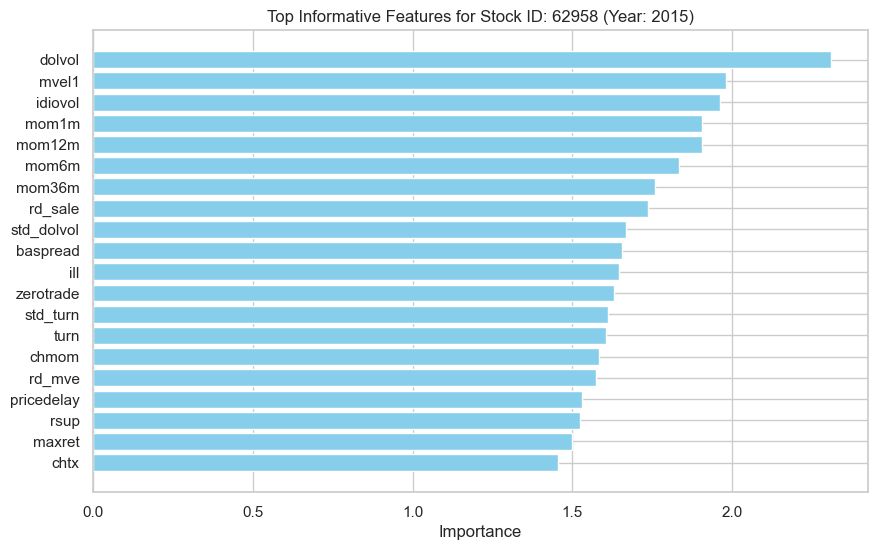

Processing DataFrame 20
Variable Importance:
dolvol     2.164558
mom1m      2.120073
mvel1      2.053808
beta       2.051996
ear        2.024634
             ...   
rd         0.000000
convind    0.000000
divo       0.000000
sin        0.000000
sic2       0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.164558
mom1m         2.120073
mvel1         2.053808
beta          2.051996
ear           2.024634
baspread      1.981316
pricedelay    1.978081
zerotrade     1.743653
mom36m        1.733231
ill           1.692579
std_turn      1.682053
std_dolvol    1.681744
rsup          1.666678
betasq        1.539893
mom6m         1.498586
maxret        1.489178
mom12m        1.390511
retvol        1.384601
chmom         1.327920
rd_mve        1.320797
dtype: float64


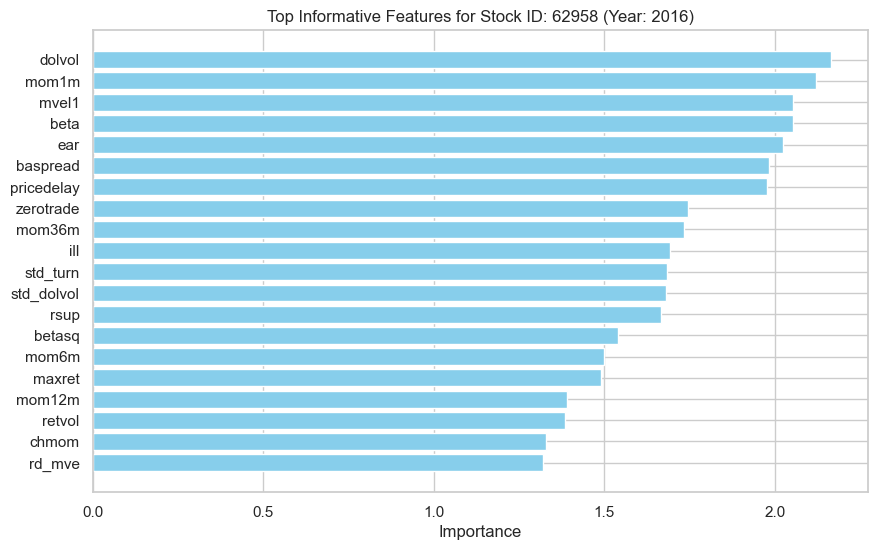

Processing DataFrame 21
Variable Importance:
indmom        2.302826
dolvol        2.200223
beta          2.149292
std_dolvol    1.936404
ill           1.907832
                ...   
dy            0.000000
ms            0.000000
secured       0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.302826
dolvol        2.200223
beta          2.149292
std_dolvol    1.936404
ill           1.907832
maxret        1.901328
zerotrade     1.853528
std_turn      1.782546
betasq        1.764634
baspread      1.702998
chtx          1.688481
mom36m        1.669249
turn          1.614267
mom12m        1.577784
pricedelay    1.545420
ear           1.509709
mom1m         1.494973
retvol        1.494093
roavol        1.423643
aeavol        1.416987
dtype: float64


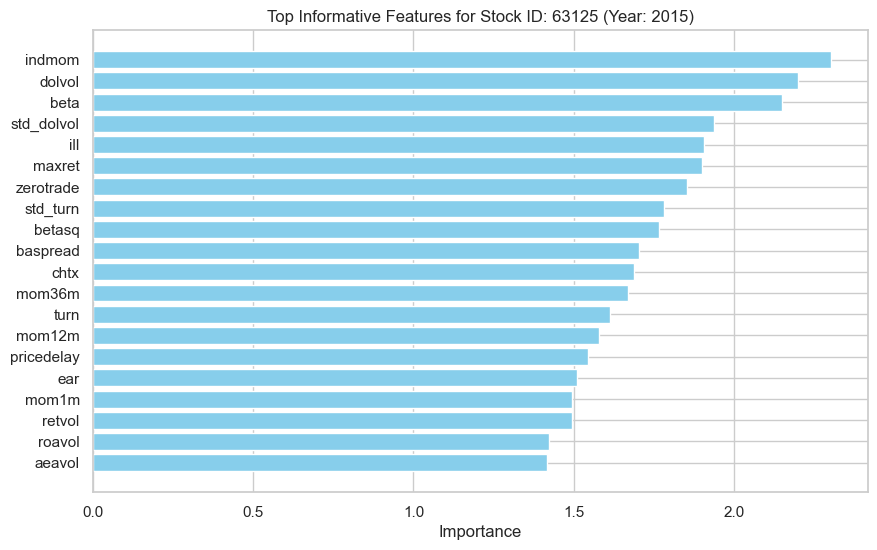

Processing DataFrame 22
Variable Importance:
dolvol        2.498015
idiovol       2.149800
std_turn      2.103913
mvel1         2.075400
std_dolvol    1.969054
                ...   
ms            0.000000
divi          0.000000
divo          0.000000
dy            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.498015
idiovol       2.149800
std_turn      2.103913
mvel1         2.075400
std_dolvol    1.969054
ill           1.792689
zerotrade     1.773156
beta          1.729077
retvol        1.728590
rsup          1.713864
mom6m         1.690835
cinvest       1.661949
mom1m         1.624744
maxret        1.617951
aeavol        1.598880
nincr         1.562138
baspread      1.551603
betasq        1.531784
mom12m        1.519347
chtx          1.456806
dtype: float64


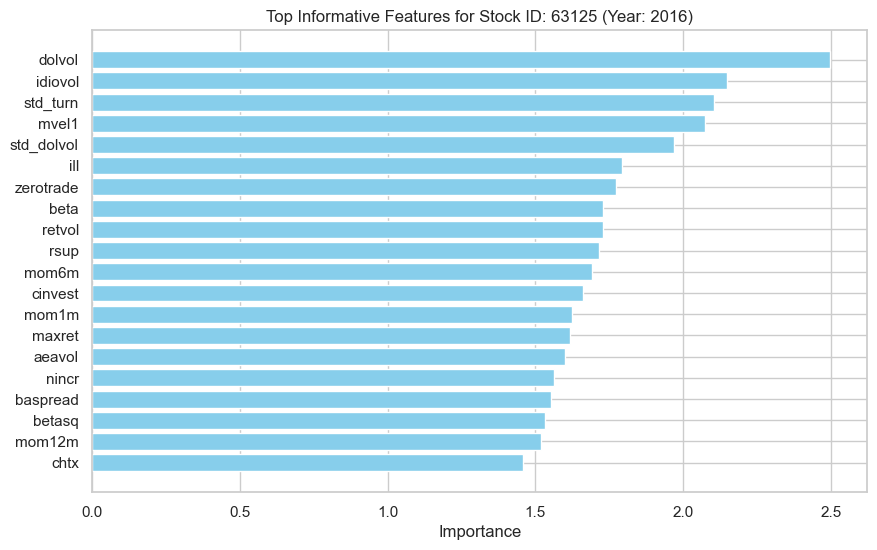

Processing DataFrame 23
Variable Importance:
dolvol        2.023060
turn          2.018087
zerotrade     1.989952
ill           1.883966
chmom         1.878680
                ...   
convind       0.000000
rd            0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.023060
turn          2.018087
zerotrade     1.989952
ill           1.883966
chmom         1.878680
pricedelay    1.804323
cinvest       1.768899
betasq        1.732663
mom1m         1.703601
beta          1.701341
maxret        1.621085
std_turn      1.608316
baspread      1.585618
mvel1         1.562083
indmom        1.528471
retvol        1.477779
std_dolvol    1.453613
mom6m         1.446846
mom36m        1.392837
orgcap        1.360120
dtype: float64


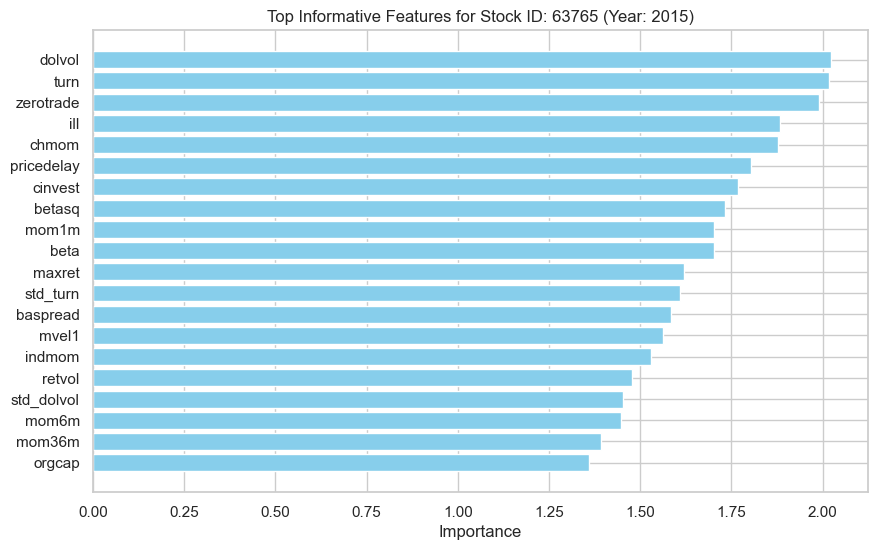

Processing DataFrame 24
Variable Importance:
pricedelay    2.318031
dolvol        2.208677
chmom         2.079885
realestate    2.050914
mom1m         2.047953
                ...   
divo          0.000000
sin           0.000000
securedind    0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.318031
dolvol        2.208677
chmom         2.079885
realestate    2.050914
mom1m         2.047953
std_dolvol    1.977519
maxret        1.874226
aeavol        1.783663
zerotrade     1.736130
std_turn      1.710462
mom6m         1.707721
mvel1         1.681174
orgcap        1.616639
ill           1.602126
roaq          1.587922
idiovol       1.553395
beta          1.527826
mom36m        1.500035
cash          1.485523
stdacc        1.425034
dtype: float64


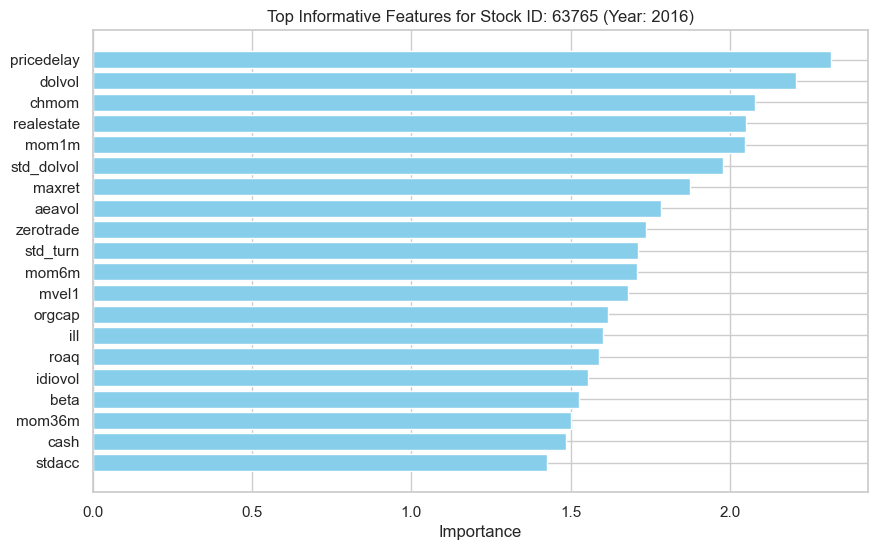

Processing DataFrame 25
Variable Importance:
dolvol        2.236048
pricedelay    2.112088
std_dolvol    2.039000
mvel1         1.980367
baspread      1.845731
                ...   
divo          0.000000
dy            0.000000
securedind    0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.236048
pricedelay    2.112088
std_dolvol    2.039000
mvel1         1.980367
baspread      1.845731
mom1m         1.808457
chmom         1.739691
cash          1.702108
mom36m        1.661869
betasq        1.659428
beta          1.643883
indmom        1.573109
ill           1.571618
rsup          1.566887
cinvest       1.545381
retvol        1.517292
std_turn      1.510763
zerotrade     1.501264
maxret        1.461999
ear           1.442928
dtype: float64


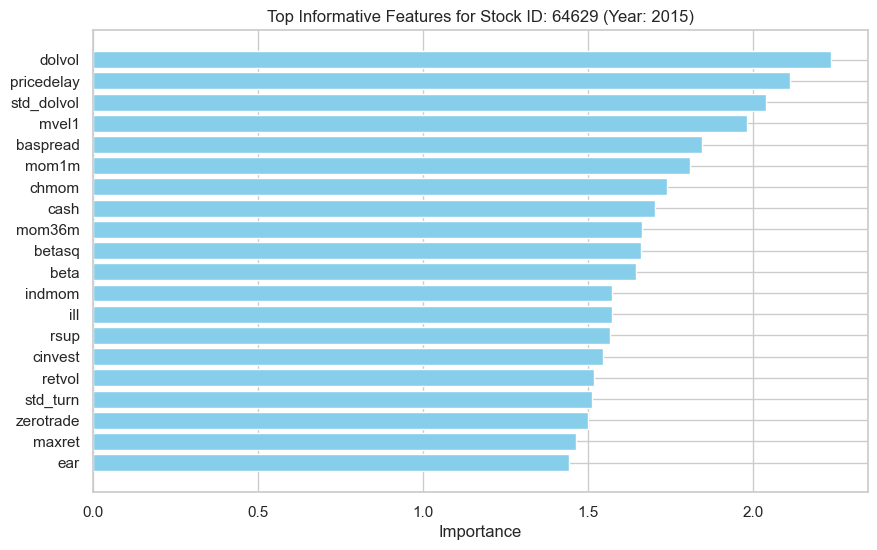

Processing DataFrame 26
Variable Importance:
mom1m         2.614363
mvel1         2.457572
dolvol        2.442920
maxret        2.249865
std_turn      1.952279
                ...   
divo          0.000000
sin           0.000000
dy            0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom1m         2.614363
mvel1         2.457572
dolvol        2.442920
maxret        2.249865
std_turn      1.952279
idiovol       1.949591
zerotrade     1.947996
indmom        1.919684
realestate    1.908347
std_dolvol    1.671587
pricedelay    1.636604
mom36m        1.533595
mom12m        1.494079
mom6m         1.431174
cash          1.409887
turn          1.403235
betasq        1.354229
chtx          1.339511
chmom         1.306794
retvol        1.303993
dtype: float64


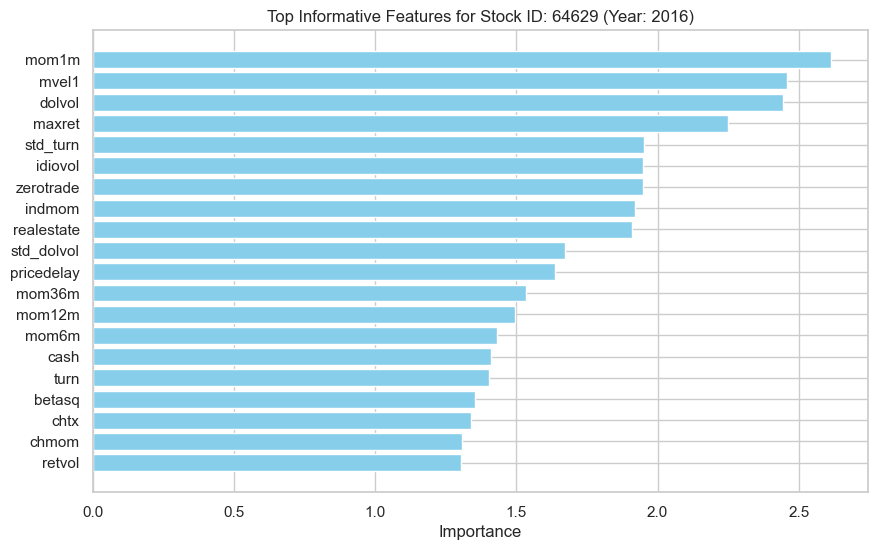

Processing DataFrame 27
Variable Importance:
pricedelay    2.360794
chmom         2.227313
maxret        2.117170
dolvol        2.074290
std_dolvol    2.023187
                ...   
convind       0.000000
sin           0.000000
divi          0.000000
divo          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.360794
chmom         2.227313
maxret        2.117170
dolvol        2.074290
std_dolvol    2.023187
betasq        2.022626
mom6m         1.994399
ill           1.964976
indmom        1.945918
mom36m        1.941751
mom12m        1.896900
baspread      1.781615
zerotrade     1.620731
mom1m         1.612501
idiovol       1.599297
retvol        1.546372
std_turn      1.507031
mvel1         1.498154
turn          1.467317
rsup          1.402046
dtype: float64


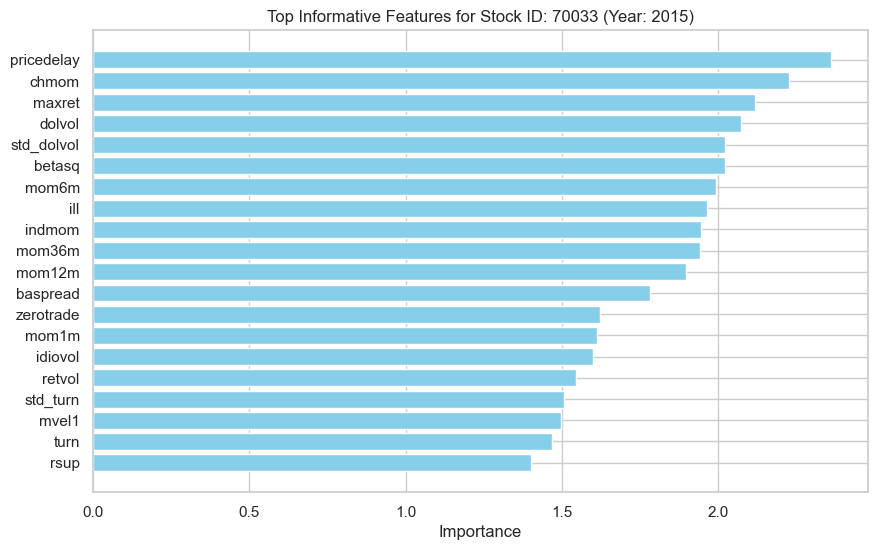

Processing DataFrame 28
Variable Importance:
pricedelay    2.482282
ill           2.389392
dolvol        2.345257
turn          2.316773
mvel1         2.246515
                ...   
divi          0.000000
sin           0.000000
securedind    0.000000
divo          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.482282
ill           2.389392
dolvol        2.345257
turn          2.316773
mvel1         2.246515
baspread      2.197146
indmom        1.965418
std_dolvol    1.900886
maxret        1.834643
zerotrade     1.830243
mom1m         1.771042
std_turn      1.678996
idiovol       1.598592
retvol        1.594788
roeq          1.567900
cinvest       1.535286
mom12m        1.509999
betasq        1.501051
mom6m         1.464455
rsup          1.440092
dtype: float64


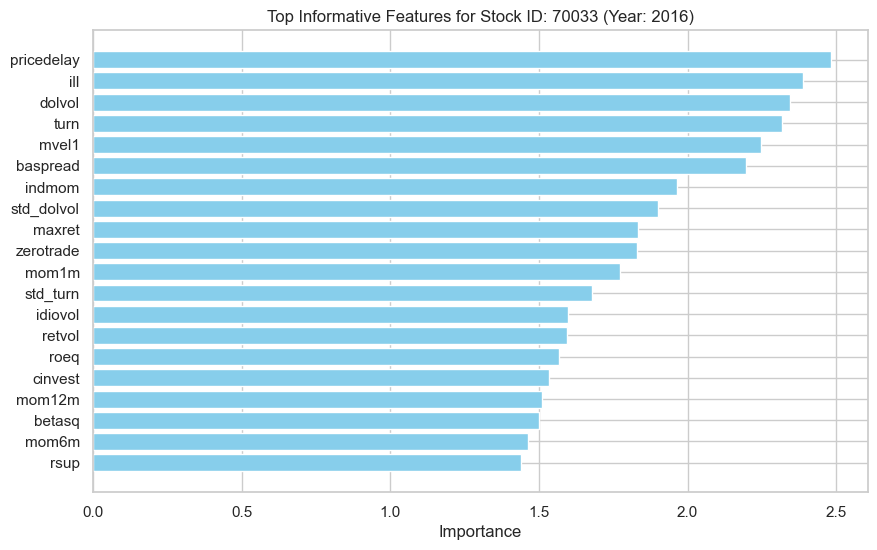

Processing DataFrame 29
Variable Importance:
mvel1         2.203855
mom1m         2.064523
zerotrade     2.055444
baspread      2.052958
std_turn      1.979571
                ...   
sin           0.000000
securedind    0.000000
secured       0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1         2.203855
mom1m         2.064523
zerotrade     2.055444
baspread      2.052958
std_turn      1.979571
std_dolvol    1.942965
cinvest       1.888000
pricedelay    1.887558
mom36m        1.871010
maxret        1.869946
dolvol        1.848425
stdcf         1.679821
stdacc        1.661706
cash          1.649878
idiovol       1.605061
ill           1.581457
chtx          1.521368
betasq        1.506151
indmom        1.500205
mom6m         1.483484
dtype: float64


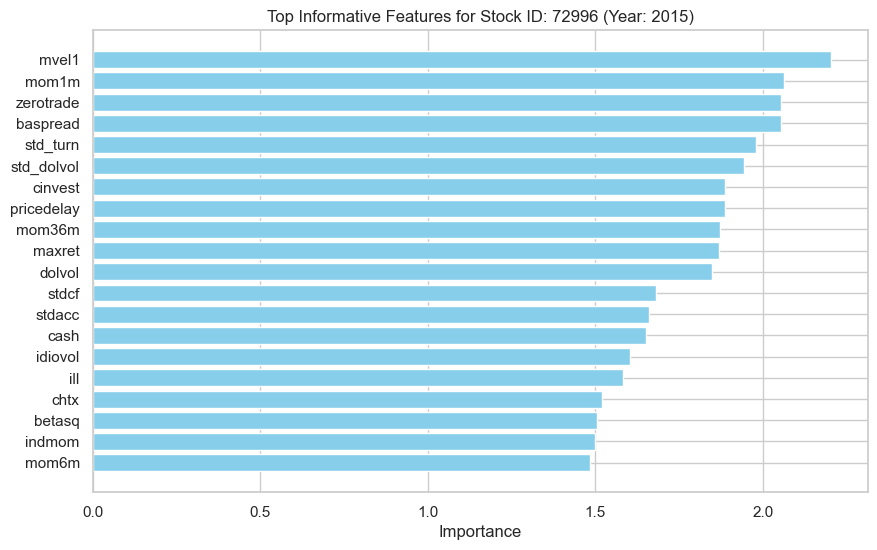

Processing DataFrame 30
Variable Importance:
pricedelay    2.361865
mvel1         2.245080
ill           2.222315
mom1m         2.149574
std_dolvol    1.961415
                ...   
sin           0.000000
dy            0.000000
securedind    0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.361865
mvel1         2.245080
ill           2.222315
mom1m         2.149574
std_dolvol    1.961415
stdcf         1.845050
retvol        1.836722
dolvol        1.792520
stdacc        1.776721
std_turn      1.769428
roaq          1.758912
indmom        1.746355
baspread      1.729802
zerotrade     1.706404
mom36m        1.676855
mom12m        1.639667
cash          1.626589
ear           1.605346
rsup          1.536994
nincr         1.515936
dtype: float64


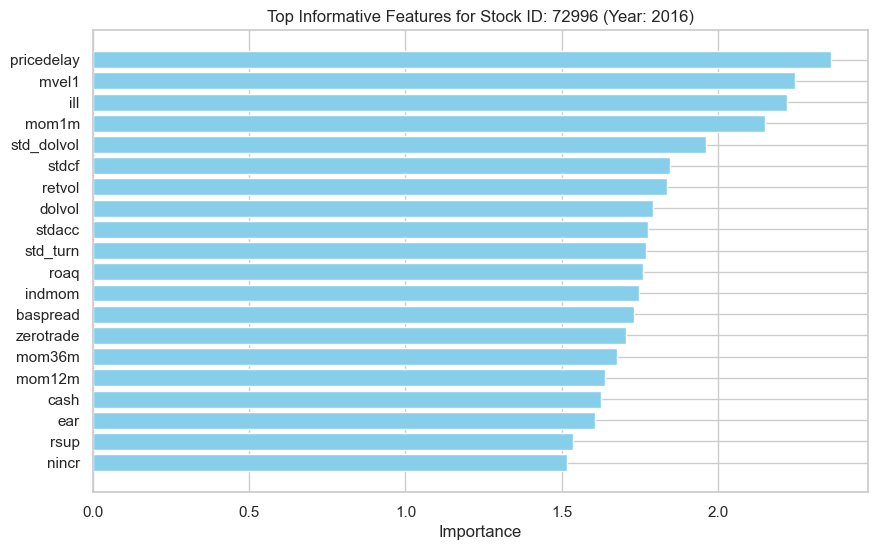

Processing DataFrame 31
Variable Importance:
std_turn    2.377341
dolvol      2.347685
maxret      2.254105
betasq      2.228772
beta        2.202931
              ...   
grcapx      0.000000
gma         0.000000
ep          0.000000
egr         0.000000
sic2        0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
std_turn      2.377341
dolvol        2.347685
maxret        2.254105
betasq        2.228772
beta          2.202931
std_dolvol    2.152359
pricedelay    2.116348
mom1m         1.961185
mom36m        1.903963
indmom        1.794979
zerotrade     1.792517
baspread      1.788844
aeavol        1.720237
turn          1.717990
nincr         1.703843
mom12m        1.669043
ear           1.562918
mvel1         1.550310
ill           1.529231
retvol        1.441101
dtype: float64


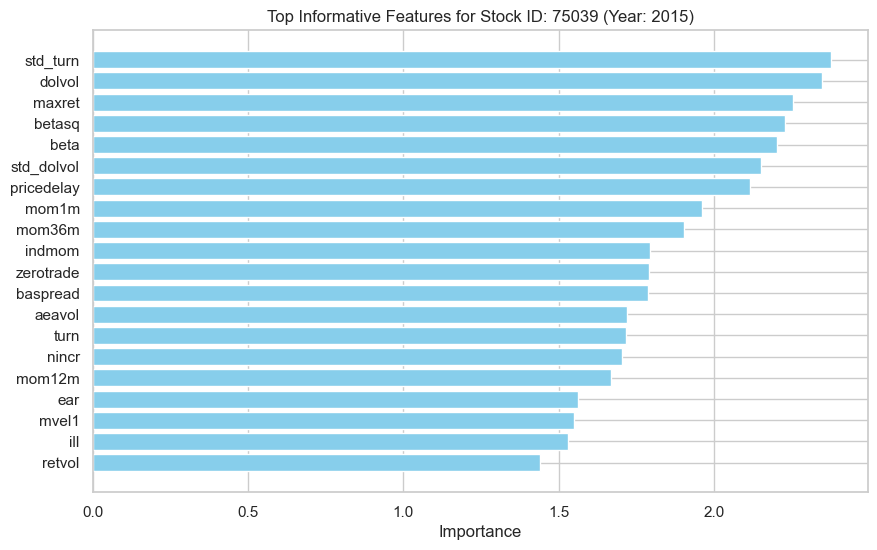

Processing DataFrame 32
Variable Importance:
std_dolvol    2.340066
pricedelay    2.207861
dolvol        2.061206
zerotrade     2.039585
betasq        2.032194
                ...   
grcapx        0.000000
gma           0.000000
ep            0.000000
egr           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
std_dolvol         2.340066
pricedelay         2.207861
dolvol             2.061206
zerotrade          2.039585
betasq             2.032194
nincr              1.993430
beta               1.964432
pchsale_pchxsga    1.943616
mom1m              1.938398
retvol             1.858107
std_turn           1.827154
maxret             1.799081
orgcap             1.725296
mvel1              1.692671
baspread           1.657121
mom12m             1.638514
mom36m             1.590643
turn               1.586847
mom6m              1.584002
ill                1.564215
dtype: float64


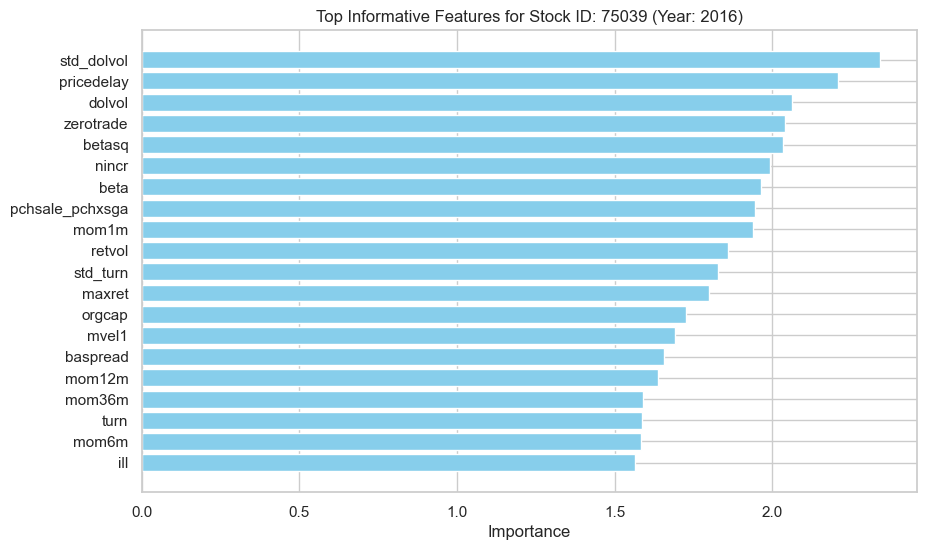

Processing DataFrame 33
Variable Importance:
std_dolvol    2.205808
ill           2.036335
mom1m         2.032318
mvel1         1.925587
baspread      1.916955
                ...   
divo          0.000000
securedind    0.000000
dy            0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
std_dolvol    2.205808
ill           2.036335
mom1m         2.032318
mvel1         1.925587
baspread      1.916955
zerotrade     1.841492
mom6m         1.777763
stdcf         1.763684
betasq        1.690288
pricedelay    1.658230
cash          1.654743
beta          1.624038
retvol        1.609490
std_turn      1.603876
cinvest       1.547026
stdacc        1.546225
roavol        1.454295
dolvol        1.446554
idiovol       1.438260
nincr         1.407190
dtype: float64


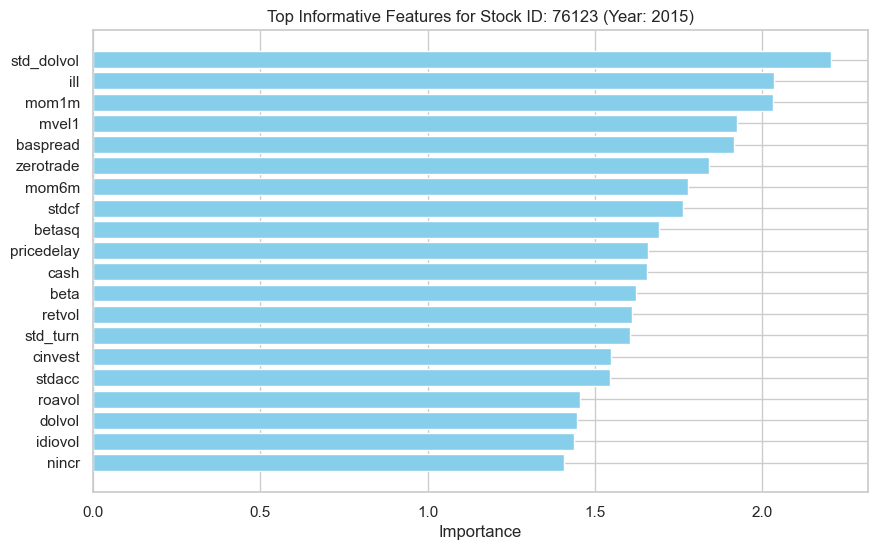

Processing DataFrame 34
Variable Importance:
baspread    2.058316
maxret      2.015471
cinvest     1.909466
mom12m      1.820164
ill         1.806034
              ...   
divi        0.000000
convind     0.000000
chinv       0.000000
sin         0.000000
sic2        0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
baspread      2.058316
maxret        2.015471
cinvest       1.909466
mom12m        1.820164
ill           1.806034
mom1m         1.788547
retvol        1.746022
idiovol       1.732116
dolvol        1.729178
mom36m        1.635680
std_dolvol    1.604500
chmom         1.558206
realestate    1.553090
mvel1         1.524140
pricedelay    1.511223
nincr         1.473413
roaq          1.472886
std_turn      1.450456
ear           1.445026
zerotrade     1.386852
dtype: float64


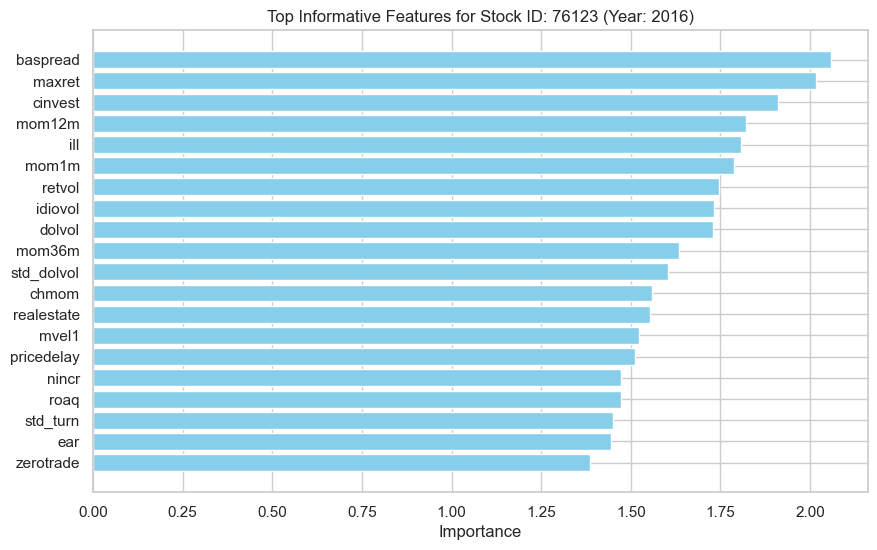

Processing DataFrame 35
Variable Importance:
mvel1         2.081038
indmom        2.066634
retvol        2.041878
dolvol        1.891878
turn          1.881666
                ...   
sin           0.000000
securedind    0.000000
secured       0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1         2.081038
indmom        2.066634
retvol        2.041878
dolvol        1.891878
turn          1.881666
std_dolvol    1.872226
mom12m        1.860526
grcapx        1.850206
zerotrade     1.822188
stdacc        1.743482
mom1m         1.734402
stdcf         1.705360
baspread      1.679400
ill           1.676707
pricedelay    1.670768
mom6m         1.635240
maxret        1.597860
chmom         1.587692
std_turn      1.536790
currat        1.425734
dtype: float64


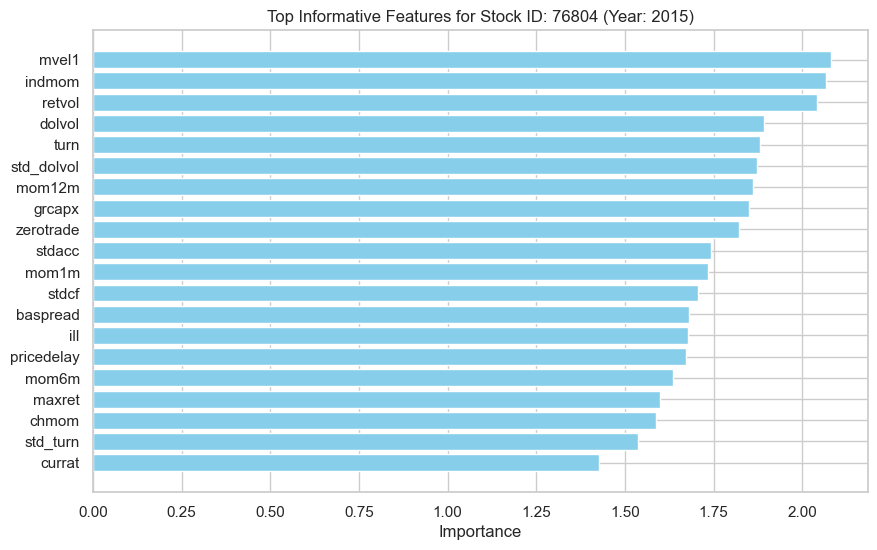

Processing DataFrame 36
Variable Importance:
indmom        2.276902
dolvol        2.216756
pricedelay    2.164515
std_dolvol    2.107239
baspread      2.022265
                ...   
sin           0.000000
securedind    0.000000
secured       0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.276902
dolvol        2.216756
pricedelay    2.164515
std_dolvol    2.107239
baspread      2.022265
maxret        1.976980
realestate    1.939504
zerotrade     1.826498
mvel1         1.823850
ill           1.747686
retvol        1.743314
stdcf         1.715035
std_turn      1.660798
quick         1.656677
stdacc        1.603031
mom6m         1.521479
turn          1.465913
mom1m         1.410012
idiovol       1.363551
beta          1.360910
dtype: float64


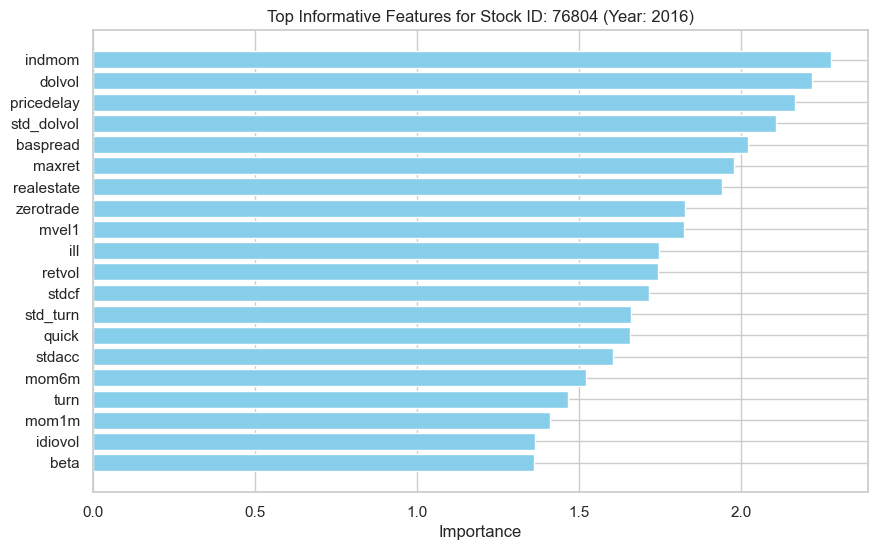

Processing DataFrame 37
Variable Importance:
mom36m        2.468603
maxret        2.199668
beta          2.177594
chmom         2.169289
ill           2.118489
                ...   
divi          0.000000
divo          0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom36m        2.468603
maxret        2.199668
beta          2.177594
chmom         2.169289
ill           2.118489
indmom        2.046933
betasq        2.024377
mvel1         1.942177
pricedelay    1.888474
dolvol        1.882863
std_dolvol    1.845299
aeavol        1.704609
cinvest       1.683352
std_turn      1.665865
baspread      1.664919
mom6m         1.575762
mom12m        1.575401
mom1m         1.560511
zerotrade     1.517523
retvol        1.416888
dtype: float64


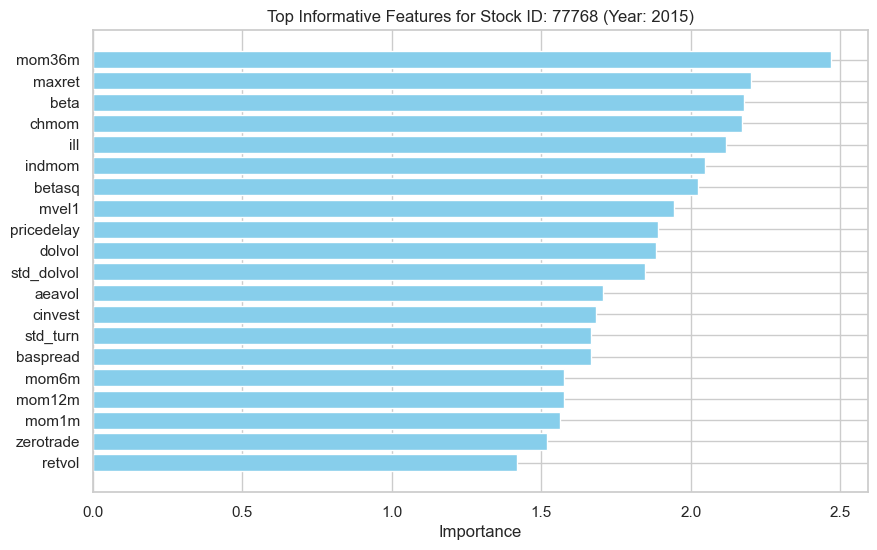

Processing DataFrame 38
Variable Importance:
pricedelay    2.320707
baspread      2.278602
zerotrade     2.228694
maxret        2.140431
dolvol        2.068715
                ...   
divo          0.000000
ps            0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.320707
baspread      2.278602
zerotrade     2.228694
maxret        2.140431
dolvol        2.068715
std_dolvol    2.022639
mvel1         1.995079
std_turn      1.840154
beta          1.771706
ill           1.767341
mom1m         1.755905
retvol        1.706769
chmom         1.698051
realestate    1.553284
aeavol        1.491165
betasq        1.487211
cinvest       1.469029
indmom        1.419333
idiovol       1.389050
chtx          1.362378
dtype: float64


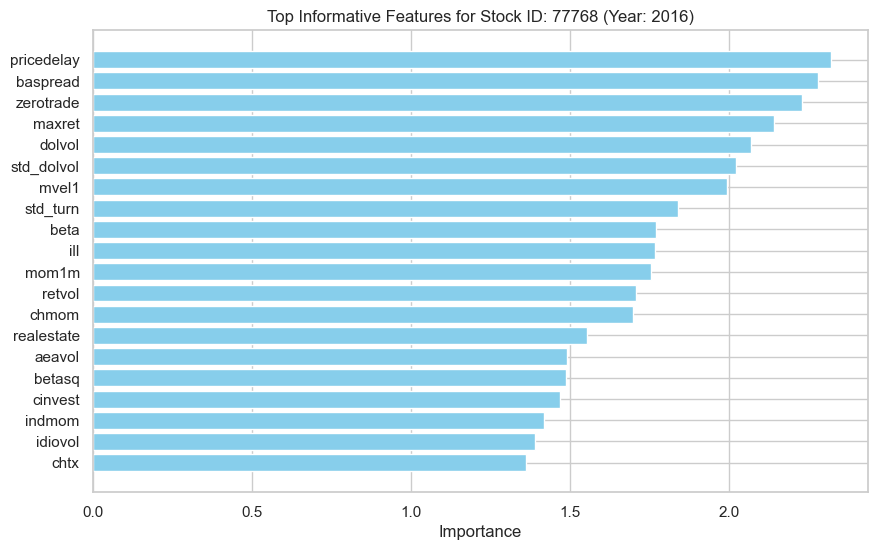

Processing DataFrame 39
Variable Importance:
zerotrade     2.416344
mom1m         2.290549
mvel1         2.157314
pricedelay    2.114013
ear           2.046681
                ...   
mve_ia        0.230826
sin           0.000000
convind       0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
zerotrade     2.416344
mom1m         2.290549
mvel1         2.157314
pricedelay    2.114013
ear           2.046681
dolvol        1.970188
retvol        1.840069
rsup          1.827921
chmom         1.799984
std_dolvol    1.751301
baspread      1.737093
beta          1.647717
indmom        1.578769
betasq        1.561309
mom12m        1.556784
nincr         1.552555
roaq          1.517440
aeavol        1.515963
maxret        1.506504
mom36m        1.470085
dtype: float64


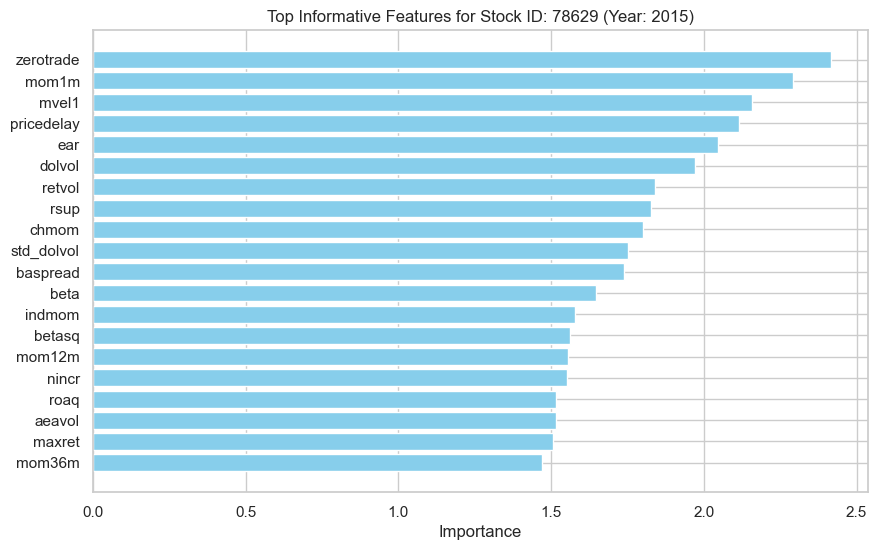

Processing DataFrame 40
Variable Importance:
mvel1         2.304698
indmom        2.037772
mom1m         1.993243
beta          1.931035
mom12m        1.903094
                ...   
convind       0.000000
ps            0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1         2.304698
indmom        2.037772
mom1m         1.993243
beta          1.931035
mom12m        1.903094
realestate    1.889623
mom36m        1.887918
maxret        1.867031
retvol        1.833193
pricedelay    1.822214
dolvol        1.814421
roavol        1.813959
chmom         1.810863
ill           1.785796
nincr         1.676588
baspread      1.663828
betasq        1.570519
idiovol       1.569227
std_dolvol    1.547382
aeavol        1.544331
dtype: float64


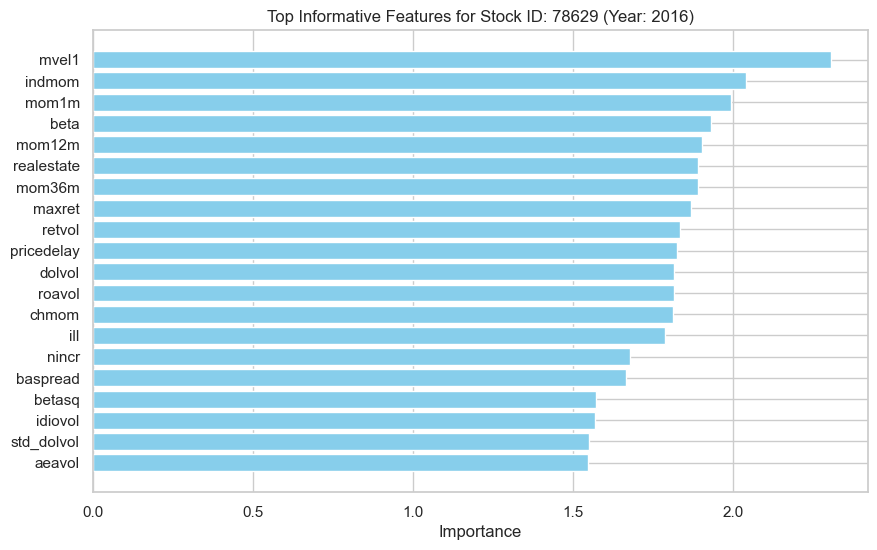

Processing DataFrame 41
Variable Importance:
baspread      2.265676
std_turn      2.189904
std_dolvol    2.116062
mom36m        2.054648
chmom         1.972568
                ...   
divo          0.000000
divi          0.000000
secured       0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
baspread      2.265676
std_turn      2.189904
std_dolvol    2.116062
mom36m        2.054648
chmom         1.972568
beta          1.875204
zerotrade     1.843886
indmom        1.725173
pricedelay    1.701072
mvel1         1.658119
betasq        1.646757
retvol        1.617244
mom1m         1.608438
idiovol       1.580321
ear           1.574709
maxret        1.563689
orgcap        1.538236
ill           1.530497
dolvol        1.477131
chtx          1.460528
dtype: float64


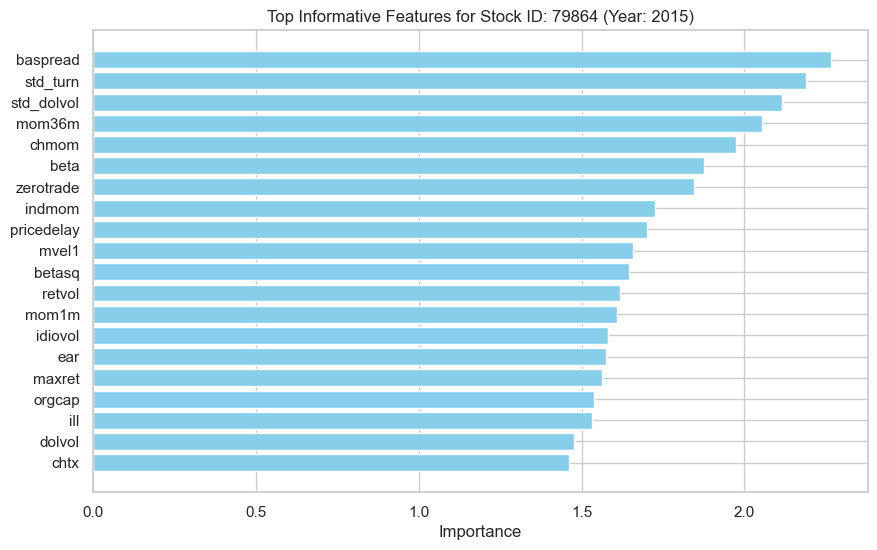

Processing DataFrame 42
Variable Importance:
pricedelay    2.369851
idiovol       2.337728
ill           2.294511
baspread      2.259042
std_dolvol    2.226554
                ...   
securedind    0.000000
secured       0.000000
rd            0.000000
ps            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.369851
idiovol       2.337728
ill           2.294511
baspread      2.259042
std_dolvol    2.226554
mvel1         2.120382
retvol        1.903469
betasq        1.895903
beta          1.788194
indmom        1.760124
mom6m         1.739339
mom1m         1.722584
maxret        1.705236
zerotrade     1.538023
std_turn      1.495302
dolvol        1.428069
cash          1.383582
mom12m        1.311295
chmom         1.293110
cinvest       1.282101
dtype: float64


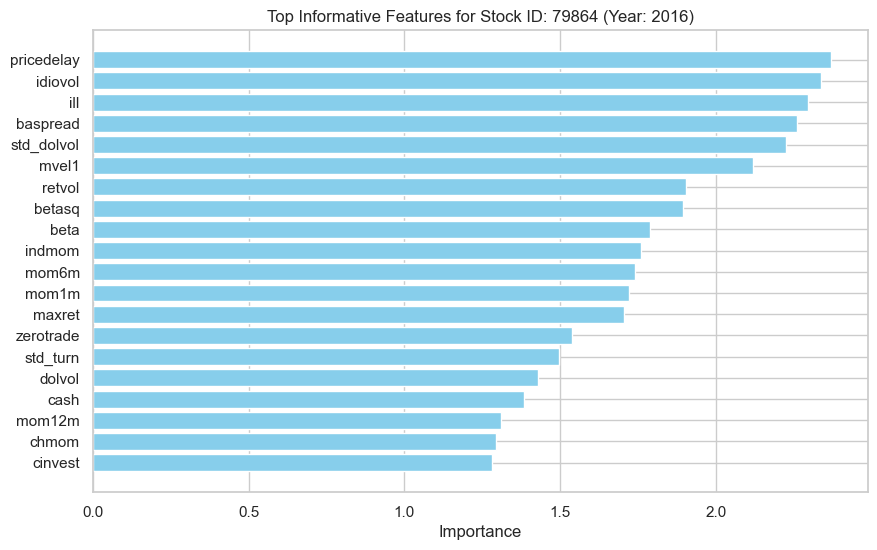

Processing DataFrame 43
Variable Importance:
mvel1         2.422538
dolvol        2.255315
idiovol       2.232569
ill           2.045586
roavol        2.001535
                ...   
sin           0.000000
securedind    0.000000
divo          0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1         2.422538
dolvol        2.255315
idiovol       2.232569
ill           2.045586
roavol        2.001535
turn          1.921917
indmom        1.847730
chmom         1.756014
mom6m         1.750954
stdcf         1.742951
pricedelay    1.729875
mom36m        1.698428
std_dolvol    1.656108
zerotrade     1.644740
maxret        1.548317
mom12m        1.524448
stdacc        1.411795
retvol        1.404241
std_turn      1.381947
mom1m         1.347007
dtype: float64


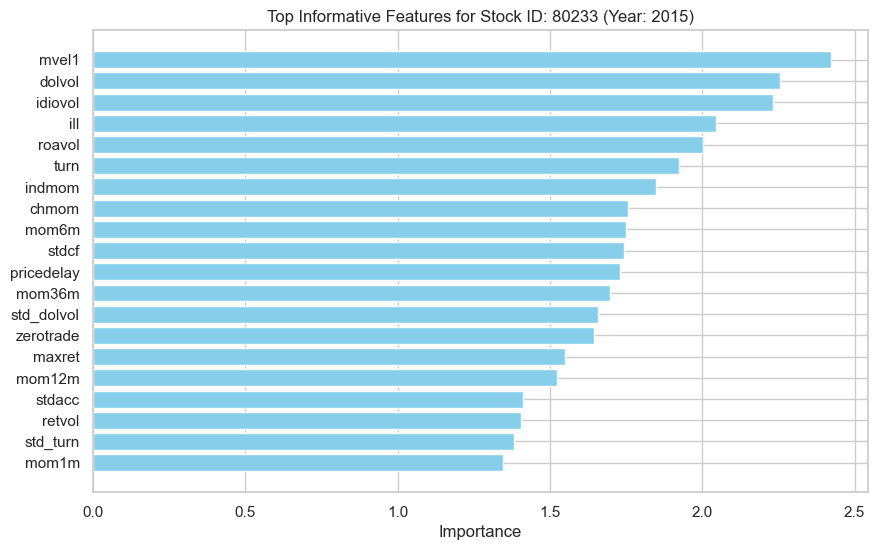

Processing DataFrame 44
Variable Importance:
mom12m        2.221110
mom6m         2.135293
baspread      2.119824
mvel1         2.049837
mom1m         2.011090
                ...   
sin           0.000000
securedind    0.000000
divo          0.000000
ps            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom12m        2.221110
mom6m         2.135293
baspread      2.119824
mvel1         2.049837
mom1m         2.011090
pricedelay    2.009460
ear           1.926821
chmom         1.853554
dolvol        1.838153
ill           1.731663
maxret        1.731038
cinvest       1.688675
zerotrade     1.666588
retvol        1.641965
secured       1.635036
nincr         1.514116
cash          1.510802
aeavol        1.478221
chtx          1.473593
beta          1.426743
dtype: float64


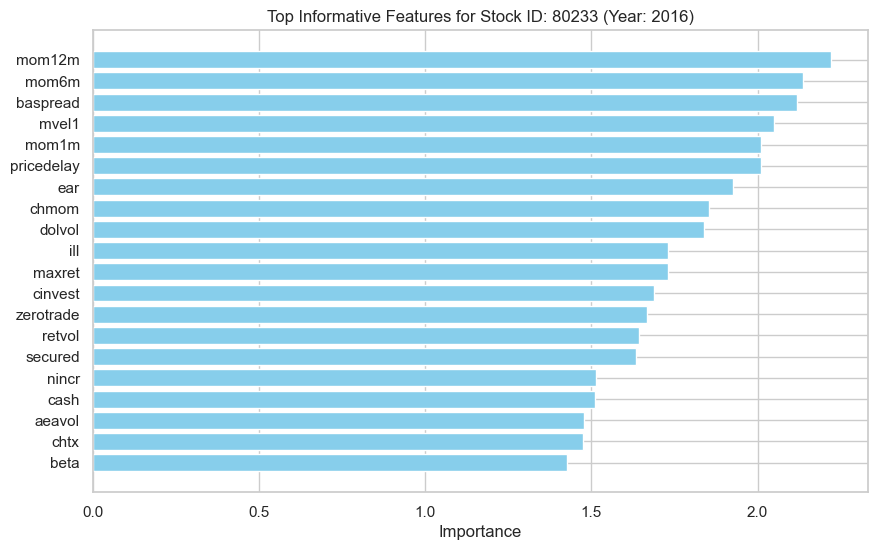

Processing DataFrame 45
Variable Importance:
pricedelay    2.420774
mom1m         2.258917
zerotrade     2.248453
maxret        2.136523
betasq        2.085820
                ...   
divo          0.000000
securedind    0.000000
sin           0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.420774
mom1m         2.258917
zerotrade     2.248453
maxret        2.136523
betasq        2.085820
beta          2.082920
dolvol        1.897978
std_dolvol    1.866087
baspread      1.805029
ill           1.796867
mom36m        1.679849
mvel1         1.640858
chmom         1.623892
retvol        1.543772
cash          1.435147
roaq          1.434408
roeq          1.419153
mom6m         1.405904
roavol        1.333355
std_turn      1.295458
dtype: float64


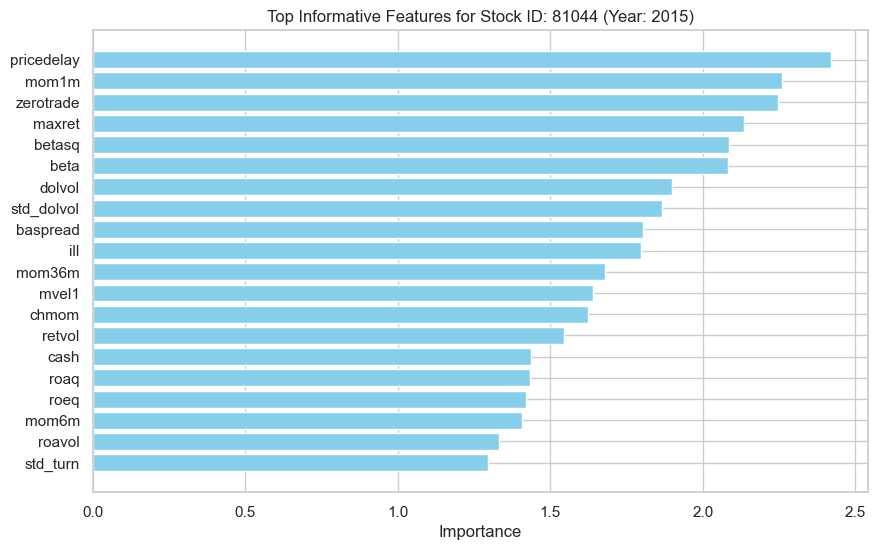

Processing DataFrame 46
Variable Importance:
std_dolvol    2.408379
mvel1         2.368429
dolvol        2.346565
pricedelay    2.320298
baspread      2.098032
                ...   
convind       0.000000
divi          0.000000
divo          0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
std_dolvol    2.408379
mvel1         2.368429
dolvol        2.346565
pricedelay    2.320298
baspread      2.098032
mom1m         2.086067
retvol        2.058644
ill           2.025029
mom6m         1.900481
maxret        1.861413
zerotrade     1.809622
std_turn      1.570069
chmom         1.495542
rsup          1.451153
chtx          1.423538
turn          1.392861
aeavol        1.388121
beta          1.386461
mom12m        1.218268
stdacc        1.153547
dtype: float64


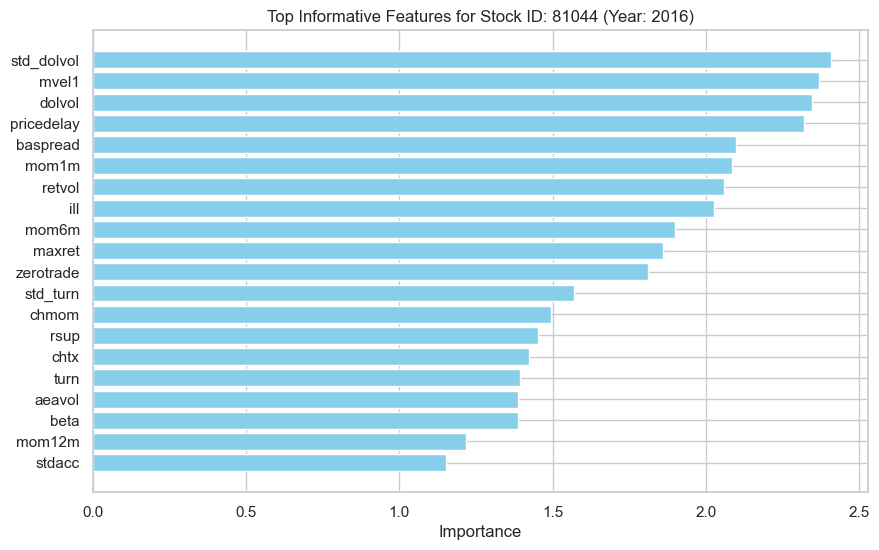

Processing DataFrame 47
Variable Importance:
baspread      2.166471
mom1m         2.142287
std_dolvol    2.097921
mvel1         2.060522
std_turn      1.946947
                ...   
divo          0.000000
dy            0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
baspread      2.166471
mom1m         2.142287
std_dolvol    2.097921
mvel1         2.060522
std_turn      1.946947
retvol        1.823471
maxret        1.809251
zerotrade     1.802732
betasq        1.771261
dolvol        1.741354
turn          1.735707
pricedelay    1.698574
chmom         1.698255
mom6m         1.695649
chtx          1.680254
beta          1.631012
mom36m        1.578045
mom12m        1.543169
cinvest       1.506115
nincr         1.468285
dtype: float64


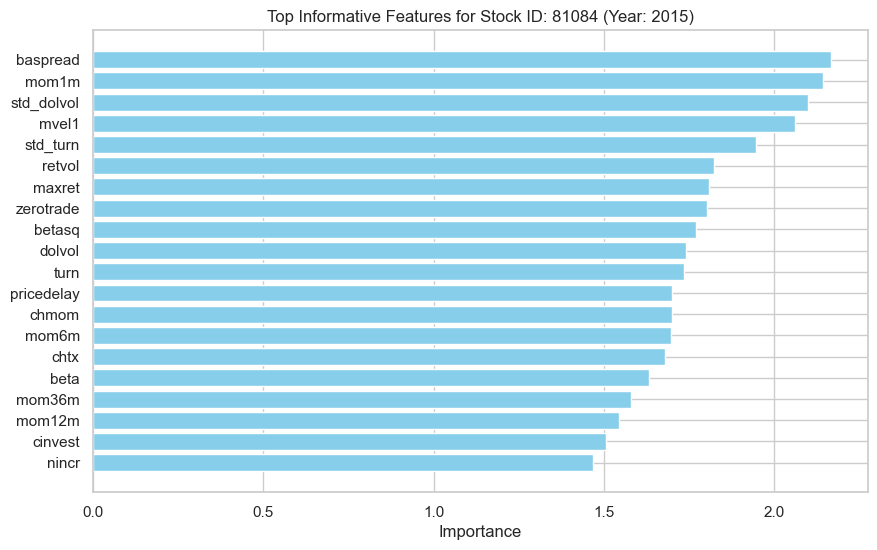

Processing DataFrame 48
Variable Importance:
pricedelay    2.323925
baspread      2.215659
beta          2.145382
mom1m         2.104457
betasq        2.054589
                ...   
divi          0.000000
divo          0.000000
dy            0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.323925
baspread      2.215659
beta          2.145382
mom1m         2.104457
betasq        2.054589
ill           1.979400
mom36m        1.936943
chmom         1.925470
mvel1         1.897885
aeavol        1.794090
zerotrade     1.748607
roeq          1.580258
idiovol       1.555892
std_dolvol    1.507188
mom6m         1.465867
mom12m        1.460175
roaq          1.440652
retvol        1.368300
ear           1.354802
nincr         1.295757
dtype: float64


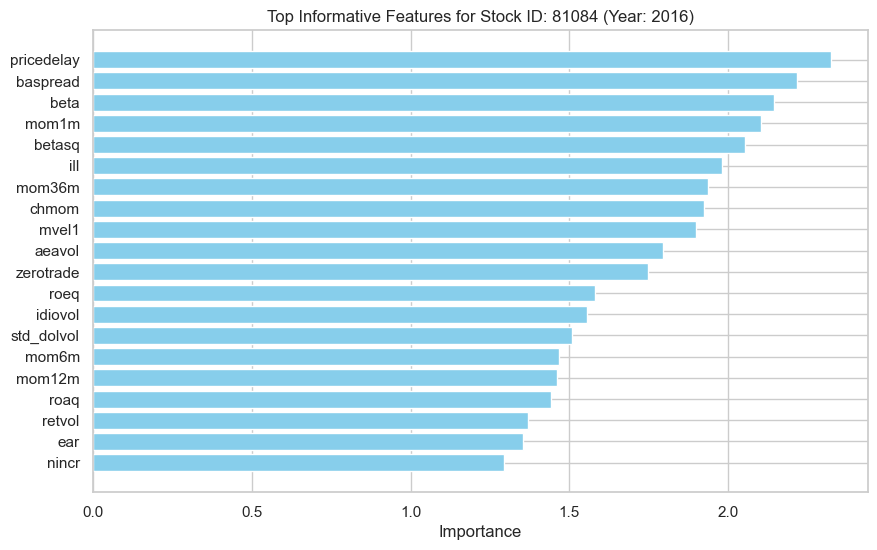

Processing DataFrame 49
Variable Importance:
dolvol       2.217391
zerotrade    2.083363
baspread     1.989256
turn         1.963588
cinvest      1.901153
               ...   
divi         0.000000
sin          0.000000
divo         0.000000
rd           0.000000
sic2         0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.217391
zerotrade     2.083363
baspread      1.989256
turn          1.963588
cinvest       1.901153
beta          1.878422
chmom         1.855891
mvel1         1.818567
mom36m        1.804429
pricedelay    1.804206
maxret        1.793664
std_turn      1.759617
mom6m         1.706652
betasq        1.697122
ill           1.680080
cash          1.678371
retvol        1.672971
std_dolvol    1.621107
mom12m        1.601169
mom1m         1.574460
dtype: float64


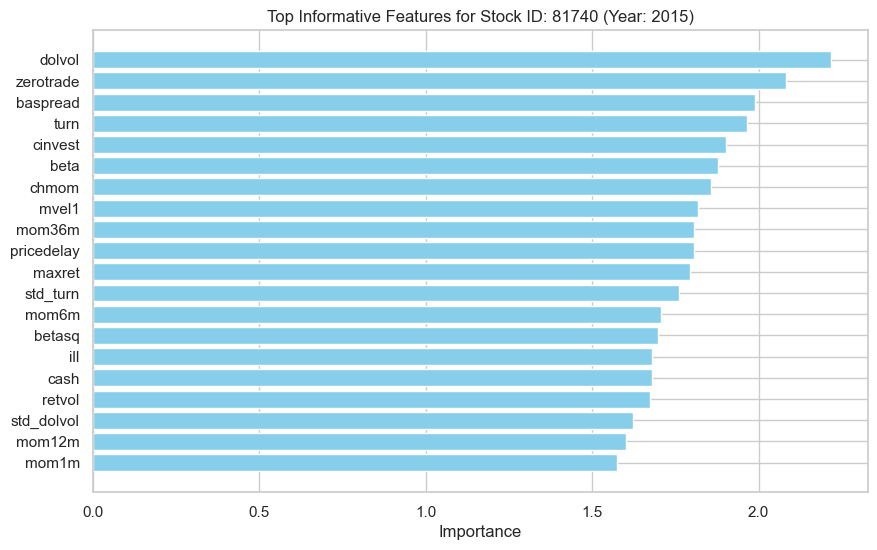

Processing DataFrame 50
Variable Importance:
indmom        2.418763
pricedelay    2.061064
zerotrade     1.944498
mvel1         1.934976
mom1m         1.933071
                ...   
ps            0.000000
sin           0.000000
rd            0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.418763
pricedelay    2.061064
zerotrade     1.944498
mvel1         1.934976
mom1m         1.933071
dolvol        1.898365
maxret        1.895905
ms            1.778164
chmom         1.774961
mom12m        1.765469
baspread      1.752117
retvol        1.714950
std_turn      1.704638
nincr         1.636411
ear           1.597076
beta          1.594596
std_dolvol    1.588339
roavol        1.561187
betasq        1.561045
mom6m         1.406165
dtype: float64


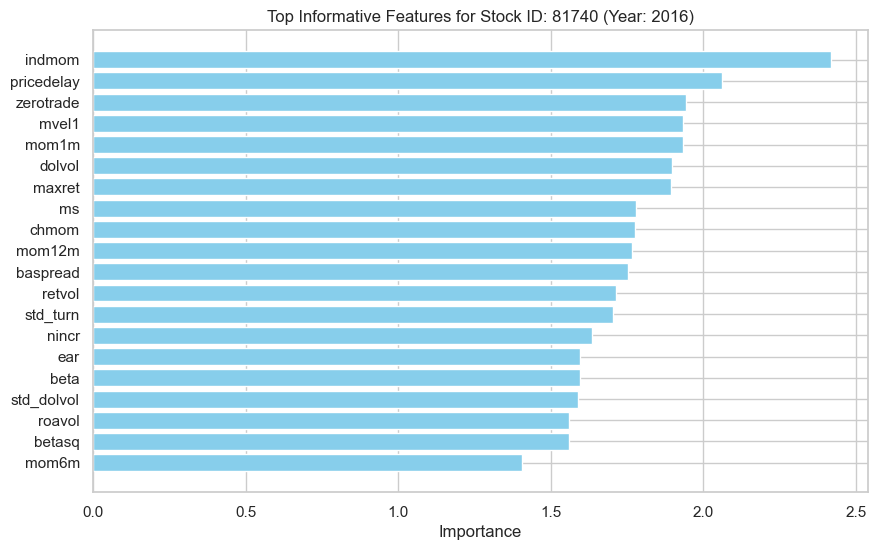

Processing DataFrame 51
Variable Importance:
indmom        2.105820
chmom         1.937684
std_turn      1.918043
zerotrade     1.906312
baspread      1.858073
                ...   
divo          0.000000
securedind    0.000000
rd            0.000000
secured       0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.105820
chmom         1.937684
std_turn      1.918043
zerotrade     1.906312
baspread      1.858073
dolvol        1.829620
maxret        1.704060
ill           1.698352
turn          1.661475
stdacc        1.644534
stdcf         1.628734
pricedelay    1.620238
std_dolvol    1.590738
beta          1.588045
retvol        1.555805
aeavol        1.527826
rsup          1.523930
mvel1         1.423182
cash          1.421285
mom1m         1.370550
dtype: float64


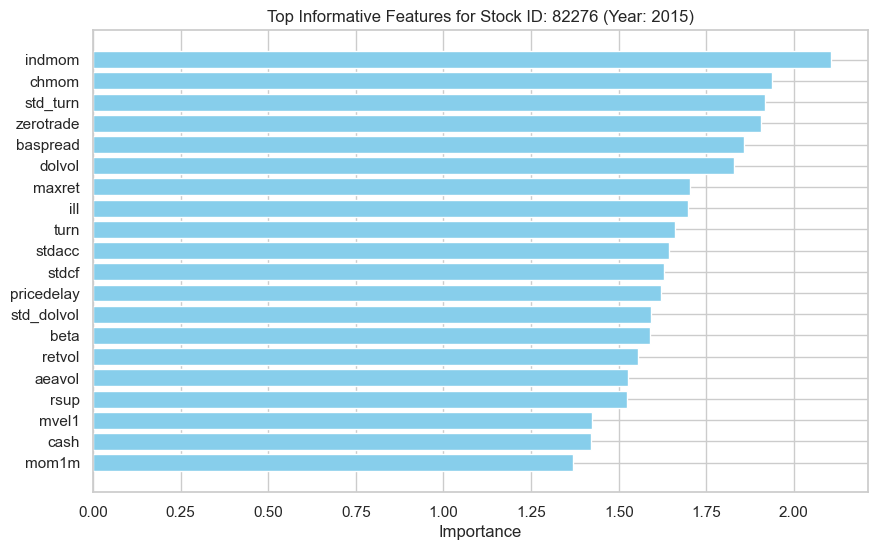

Processing DataFrame 52
Variable Importance:
dolvol        2.176477
mom36m        2.121455
retvol        1.937423
maxret        1.871385
indmom        1.818496
                ...   
divo          0.000000
securedind    0.000000
secured       0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.176477
mom36m        2.121455
retvol        1.937423
maxret        1.871385
indmom        1.818496
betasq        1.774993
pricedelay    1.745151
tang          1.683305
cinvest       1.644858
realestate    1.644205
turn          1.624747
beta          1.619216
ill           1.587592
mom1m         1.572706
mom12m        1.563928
ear           1.493294
mom6m         1.450226
std_dolvol    1.400675
zerotrade     1.391206
stdcf         1.322677
dtype: float64


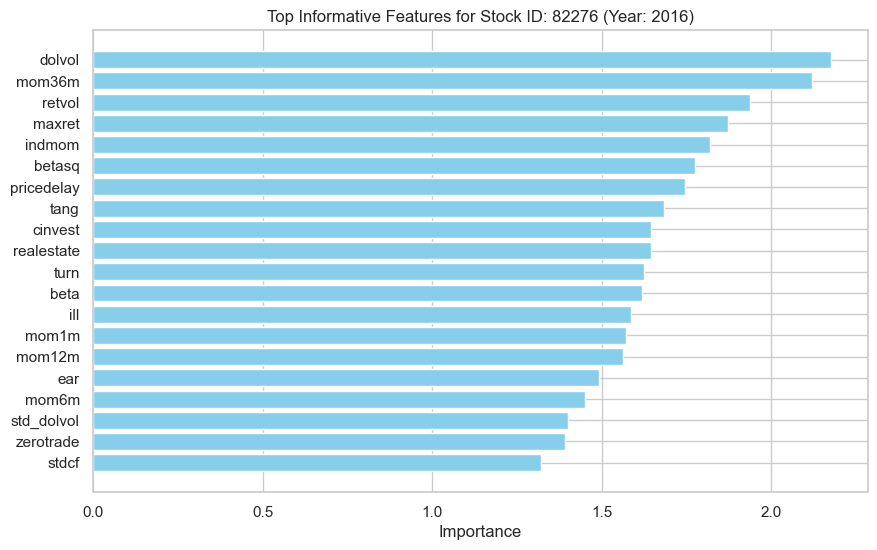

Processing DataFrame 53
Variable Importance:
maxret      2.343829
retvol      2.279047
baspread    2.163188
indmom      1.826383
mom12m      1.817328
              ...   
dy          0.000000
divi        0.000000
divo        0.000000
sin         0.000000
sic2        0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
maxret        2.343829
retvol        2.279047
baspread      2.163188
indmom        1.826383
mom12m        1.817328
mom36m        1.796549
mom1m         1.785580
mom6m         1.774139
dolvol        1.727870
mvel1         1.722305
roavol        1.669812
ill           1.625813
zerotrade     1.586256
pricedelay    1.553781
turn          1.542476
cinvest       1.538908
ear           1.535826
beta          1.500823
cash          1.435908
idiovol       1.420954
dtype: float64


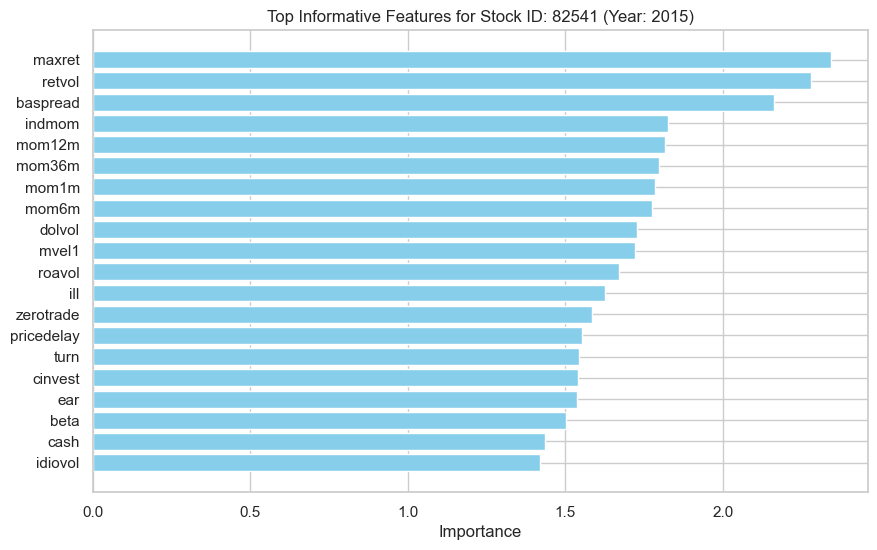

Processing DataFrame 54
Variable Importance:
mom1m         2.213699
dolvol        2.183781
zerotrade     2.135616
pricedelay    2.022130
turn          1.949162
                ...   
dy            0.000000
sin           0.000000
securedind    0.000000
secured       0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom1m         2.213699
dolvol        2.183781
zerotrade     2.135616
pricedelay    2.022130
turn          1.949162
mom36m        1.922871
betasq        1.876595
maxret        1.874459
ill           1.846464
indmom        1.834629
chtx          1.671452
idiovol       1.597858
baspread      1.569886
std_dolvol    1.564286
chmom         1.542790
cinvest       1.477230
mvel1         1.469320
retvol        1.467903
std_turn      1.462055
mom6m         1.437153
dtype: float64


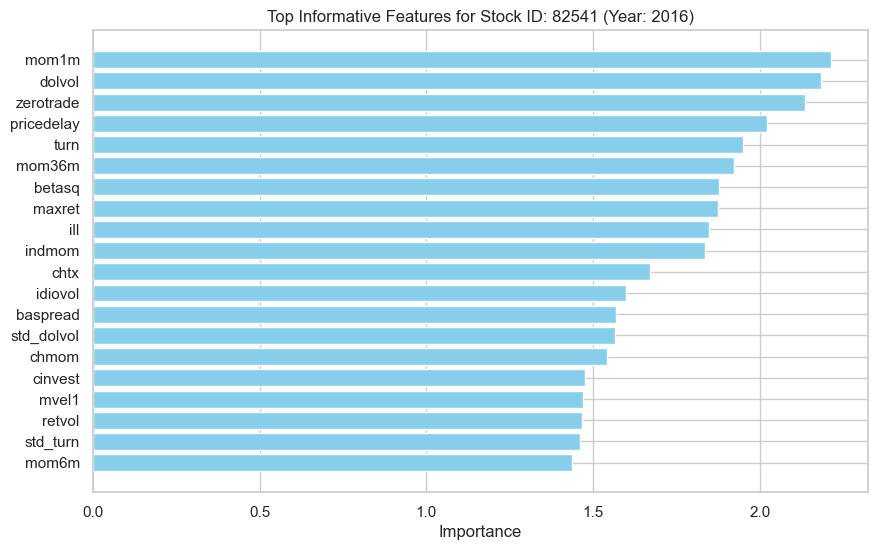

Processing DataFrame 55
Variable Importance:
betasq        2.447697
beta          2.311123
mvel1         2.165882
pricedelay    2.007186
mom1m         1.961962
                ...   
divi          0.000000
divo          0.000000
securedind    0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
betasq        2.447697
beta          2.311123
mvel1         2.165882
pricedelay    2.007186
mom1m         1.961962
mom12m        1.848347
baspread      1.843556
zerotrade     1.812356
ill           1.767765
std_turn      1.732225
cinvest       1.718222
ear           1.690688
mom6m         1.646289
std_dolvol    1.591117
dolvol        1.578985
retvol        1.555724
aeavol        1.477583
maxret        1.393874
roavol        1.392219
chmom         1.372234
dtype: float64


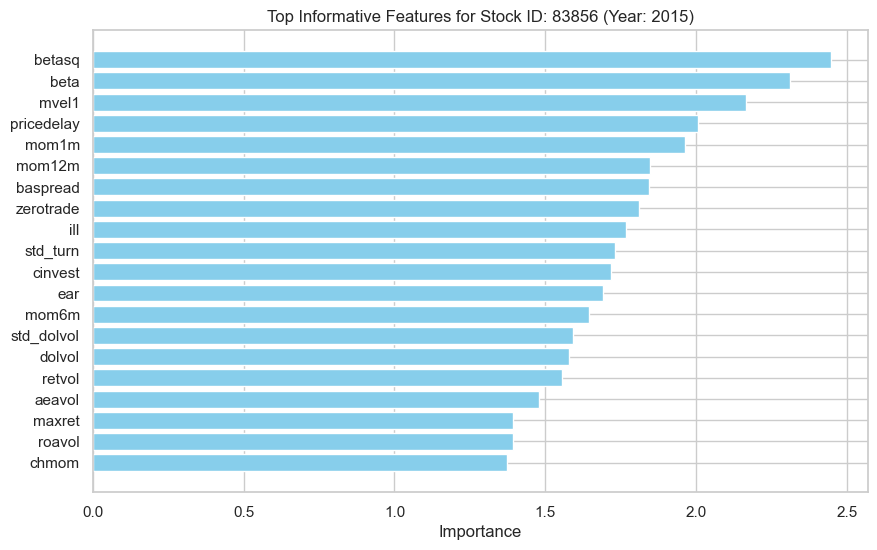

Processing DataFrame 56
Variable Importance:
ill           2.087608
pricedelay    2.034251
mom6m         2.012373
dolvol        1.998970
mom1m         1.982173
                ...   
divi          0.000000
divo          0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
ill           2.087608
pricedelay    2.034251
mom6m         2.012373
dolvol        1.998970
mom1m         1.982173
baspread      1.877742
zerotrade     1.848278
mvel1         1.790324
retvol        1.764235
maxret        1.763780
std_dolvol    1.746867
mom12m        1.706526
mom36m        1.672666
indmom        1.672012
chmom         1.604324
beta          1.558086
roeq          1.551720
realestate    1.507038
cinvest       1.506058
std_turn      1.487774
dtype: float64


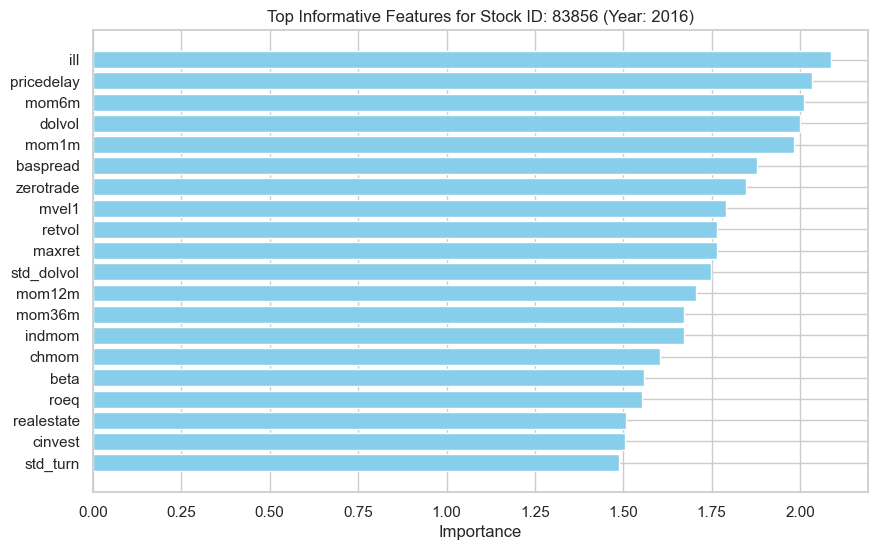

Processing DataFrame 57
Variable Importance:
dolvol        2.387060
turn          2.338529
mvel1         2.029793
baspread      1.982701
beta          1.879225
                ...   
rd_mve        0.000000
rd_sale       0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.387060
turn          2.338529
mvel1         2.029793
baspread      1.982701
beta          1.879225
idiovol       1.876359
pricedelay    1.820181
std_dolvol    1.779414
mom12m        1.768435
zerotrade     1.757897
mom1m         1.713463
ear           1.632733
ill           1.623098
maxret        1.613881
chtx          1.540463
betasq        1.528040
std_turn      1.524446
cash          1.514030
mom36m        1.482595
retvol        1.443162
dtype: float64


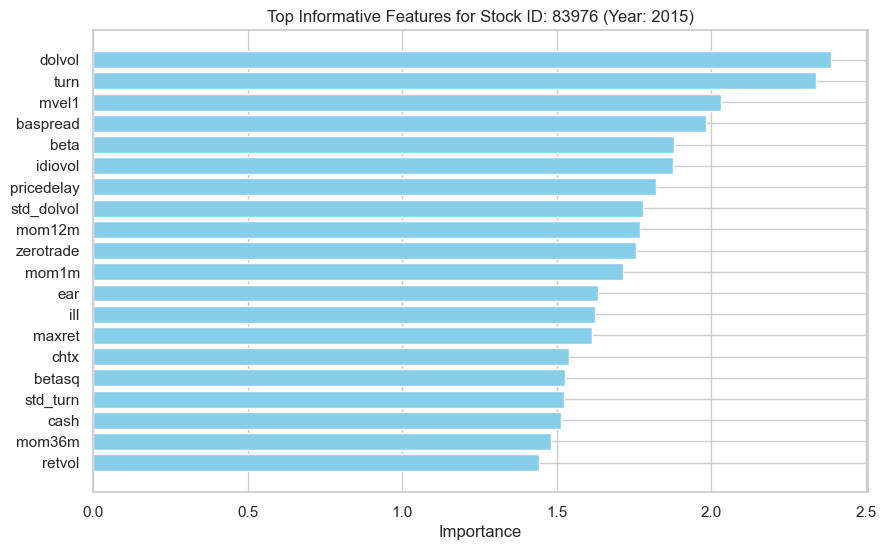

Processing DataFrame 58
Variable Importance:
ill           2.228882
turn          2.215969
std_dolvol    2.120550
indmom        2.016514
baspread      1.947947
                ...   
rd            0.000000
sin           0.000000
rd_mve        0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
ill           2.228882
turn          2.215969
std_dolvol    2.120550
indmom        2.016514
baspread      1.947947
maxret        1.894096
idiovol       1.858979
zerotrade     1.852981
mom36m        1.818536
dolvol        1.770514
mom1m         1.768203
chmom         1.763940
cinvest       1.712344
ms            1.708664
beta          1.642207
betasq        1.640750
std_turn      1.613618
pricedelay    1.611989
mom12m        1.591605
retvol        1.579358
dtype: float64


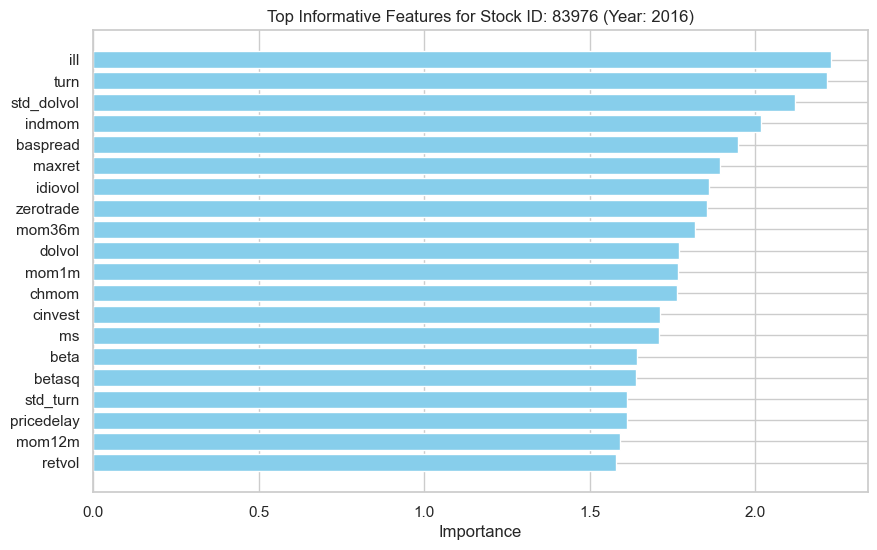

Processing DataFrame 59
Variable Importance:
zerotrade     2.309294
pricedelay    2.187017
mvel1         2.186892
mom1m         2.150630
retvol        2.109329
                ...   
sin           0.000000
securedind    0.000000
secured       0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
zerotrade     2.309294
pricedelay    2.187017
mvel1         2.186892
mom1m         2.150630
retvol        2.109329
ill           2.063378
maxret        2.050394
baspread      1.716673
mom6m         1.713299
std_dolvol    1.678858
dolvol        1.636350
mom36m        1.619151
beta          1.569751
cinvest       1.552850
betasq        1.523529
idiovol       1.474328
indmom        1.425802
aeavol        1.416323
std_turn      1.415654
ear           1.386602
dtype: float64


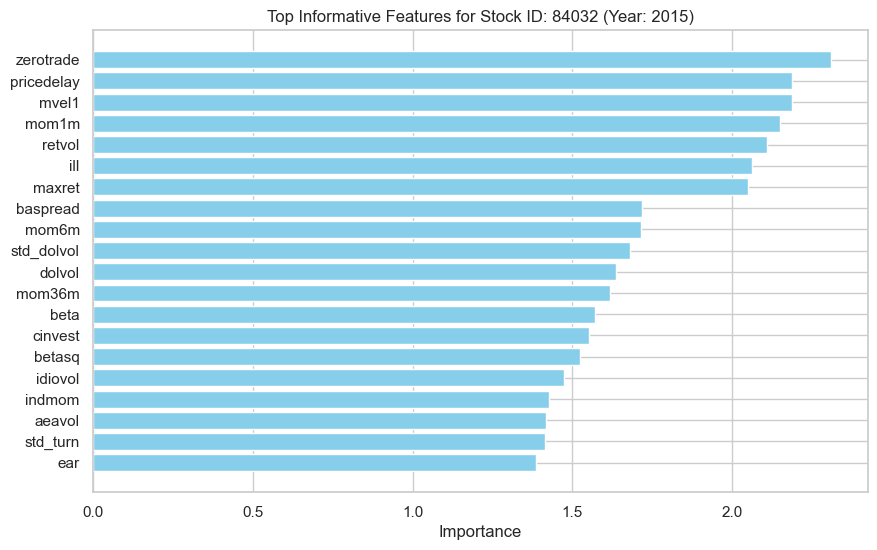

Processing DataFrame 60
Variable Importance:
realestate    2.133465
chmom         2.105580
dolvol        2.099860
std_dolvol    2.049999
std_turn      2.016535
                ...   
divi          0.000000
sin           0.000000
securedind    0.000000
secured       0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
realestate    2.133465
chmom         2.105580
dolvol        2.099860
std_dolvol    2.049999
std_turn      2.016535
ill           1.940344
baspread      1.926762
mom6m         1.912047
cash          1.836548
mvel1         1.813726
indmom        1.812442
mom1m         1.775311
betasq        1.729799
beta          1.724336
pricedelay    1.652009
maxret        1.619771
retvol        1.529454
mom36m        1.505438
zerotrade     1.471877
roeq          1.304752
dtype: float64


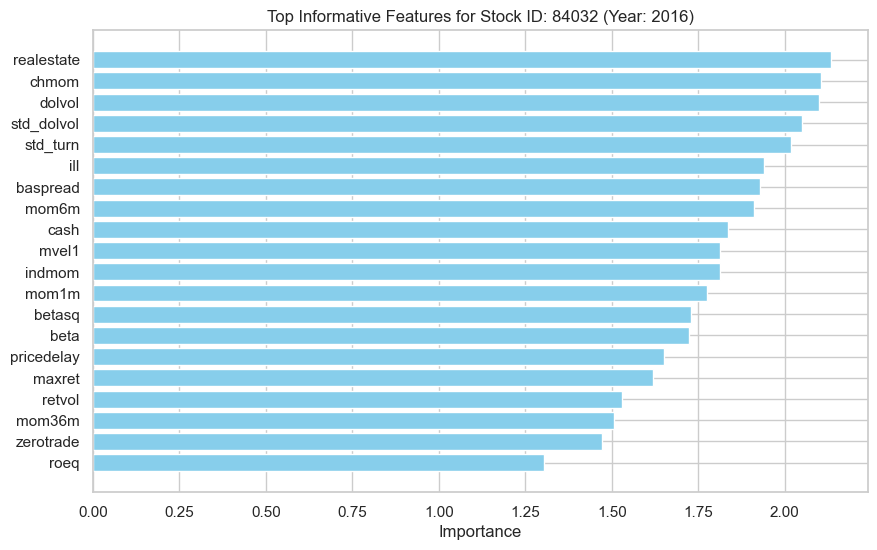

Processing DataFrame 61
Variable Importance:
zerotrade     2.426271
ill           2.276007
dolvol        2.082103
std_dolvol    2.053326
idiovol       1.965469
                ...   
divi          0.000000
divo          0.000000
sin           0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
zerotrade     2.426271
ill           2.276007
dolvol        2.082103
std_dolvol    2.053326
idiovol       1.965469
stdcf         1.949733
mom1m         1.898331
stdacc        1.884643
betasq        1.884528
mvel1         1.810160
indmom        1.808603
mom12m        1.797045
beta          1.777605
pricedelay    1.626623
maxret        1.622648
chmom         1.457751
turn          1.429852
mom6m         1.422570
std_turn      1.382585
baspread      1.359824
dtype: float64


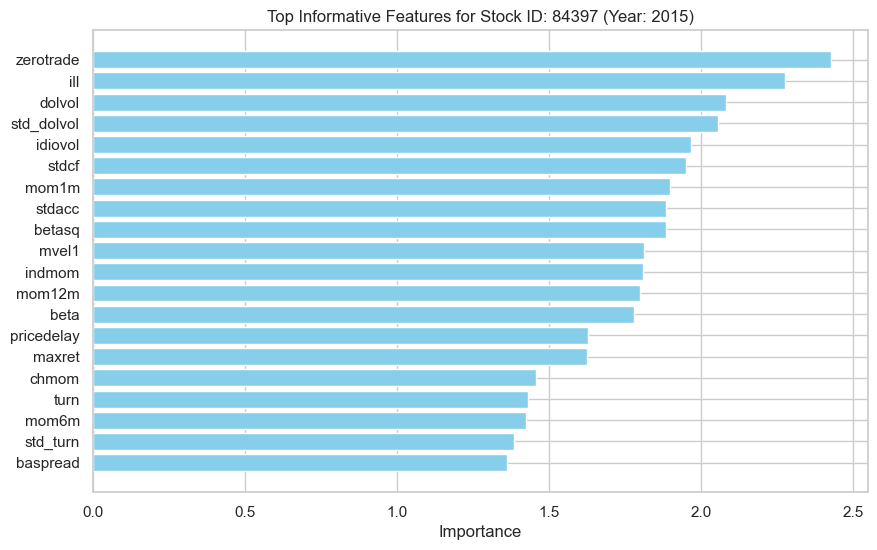

Processing DataFrame 62
Variable Importance:
indmom        2.190637
maxret        2.190270
mvel1         2.114898
pricedelay    2.099894
dolvol        1.952312
                ...   
securedind    0.000000
sin           0.000000
convind       0.000000
divi          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.190637
maxret        2.190270
mvel1         2.114898
pricedelay    2.099894
dolvol        1.952312
mom1m         1.922851
baspread      1.916780
mom36m        1.808902
chmom         1.799941
retvol        1.725474
std_dolvol    1.722245
zerotrade     1.690596
realestate    1.662879
beta          1.629096
std_turn      1.592210
stdcf         1.585015
mom12m        1.488374
mom6m         1.473469
turn          1.462259
stdacc        1.447920
dtype: float64


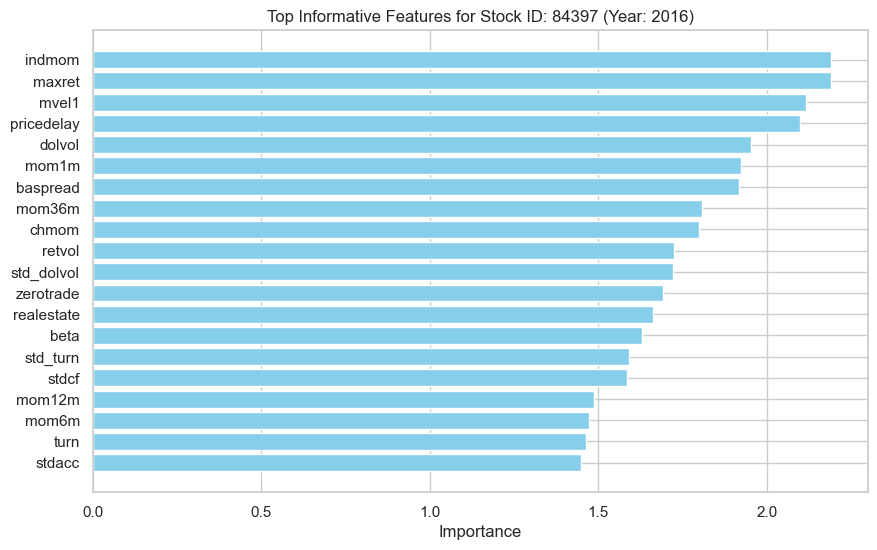

Processing DataFrame 63
Variable Importance:
dolvol        2.399667
zerotrade     2.345262
pricedelay    2.189738
std_dolvol    2.026801
mvel1         2.017549
                ...   
convind       0.000000
sin           0.000000
divi          0.000000
divo          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.399667
zerotrade     2.345262
pricedelay    2.189738
std_dolvol    2.026801
mvel1         2.017549
maxret        1.930000
mom1m         1.902191
ill           1.842733
mom36m        1.836285
grcapx        1.826983
turn          1.711813
std_turn      1.653110
stdcf         1.594590
idiovol       1.591755
chmom         1.584054
stdacc        1.558085
mom6m         1.448616
baspread      1.420471
retvol        1.408102
orgcap        1.341087
dtype: float64


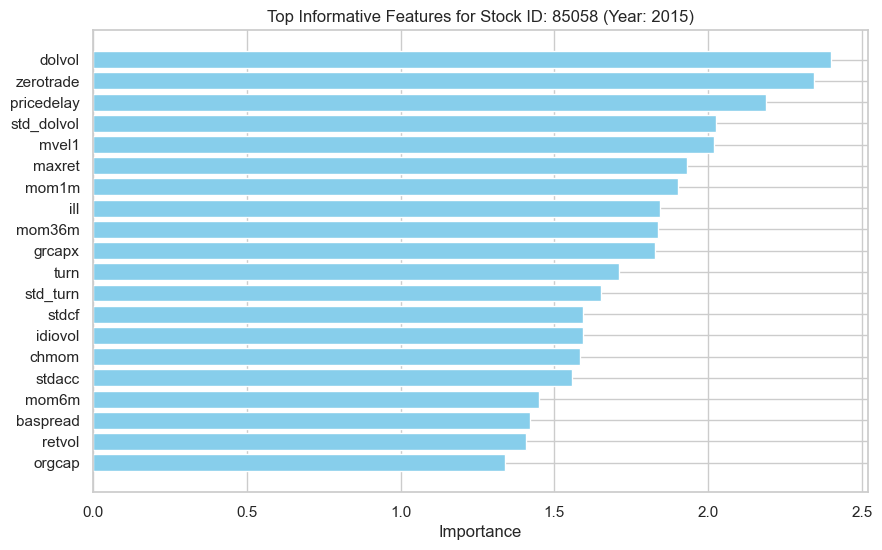

Processing DataFrame 64
Variable Importance:
pricedelay    2.287436
cinvest       2.074934
dolvol        1.956878
realestate    1.947743
mom1m         1.946328
                ...   
rd_sale       0.000000
chtx          0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.287436
cinvest       2.074934
dolvol        1.956878
realestate    1.947743
mom1m         1.946328
zerotrade     1.906740
mvel1         1.872564
turn          1.868281
stdcf         1.695191
betasq        1.689598
std_turn      1.683300
beta          1.666005
stdacc        1.664136
std_dolvol    1.644630
retvol        1.614982
mom36m        1.537721
cash          1.496934
chmom         1.495885
mom6m         1.491177
ill           1.432042
dtype: float64


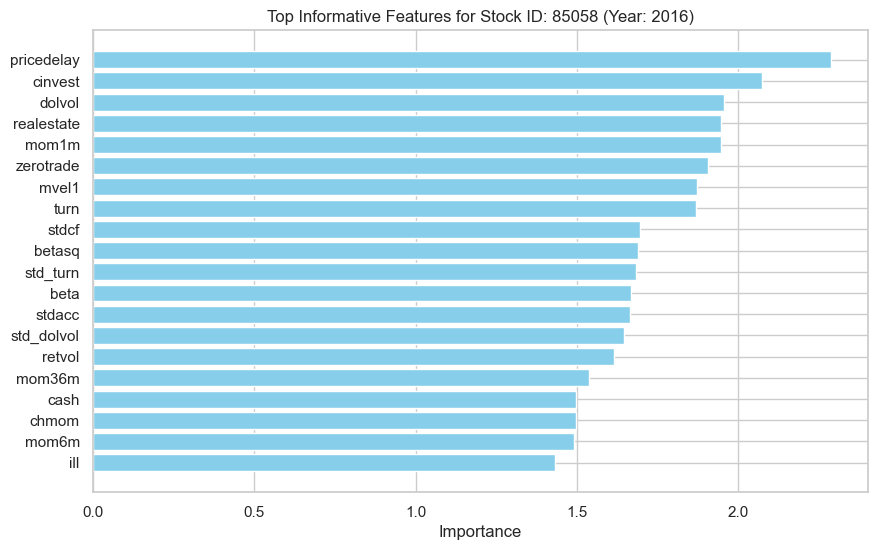

Processing DataFrame 65
Variable Importance:
indmom        2.448388
pricedelay    2.115400
dolvol        2.082529
std_dolvol    1.962096
mom6m         1.932809
                ...   
securedind    0.000000
convind       0.000000
divi          0.000000
divo          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.448388
pricedelay    2.115400
dolvol        2.082529
std_dolvol    1.962096
mom6m         1.932809
chmom         1.918963
zerotrade     1.873130
retvol        1.850253
beta          1.840920
mom1m         1.818901
baspread      1.768932
std_turn      1.768040
betasq        1.675611
ear           1.537424
ill           1.497312
cash          1.454544
chtx          1.380834
rsup          1.376123
idiovol       1.363923
orgcap        1.361731
dtype: float64


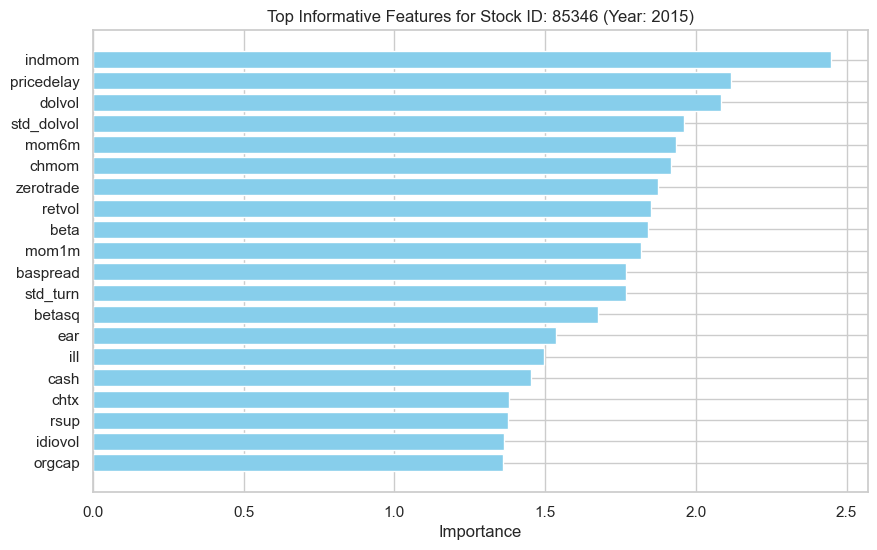

Processing DataFrame 66
Variable Importance:
zerotrade     2.265042
chmom         2.144947
indmom        2.123402
mom1m         1.979108
pricedelay    1.905996
                ...   
secured       0.000000
realestate    0.000000
rd            0.000000
hire          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
zerotrade     2.265042
chmom         2.144947
indmom        2.123402
mom1m         1.979108
pricedelay    1.905996
ear           1.832218
mvel1         1.790608
std_turn      1.782242
maxret        1.779311
ill           1.768091
idiovol       1.691451
cinvest       1.657329
dolvol        1.657069
chtx          1.628907
turn          1.627703
mom6m         1.626747
retvol        1.588995
roeq          1.411689
roavol        1.389209
orgcap        1.302866
dtype: float64


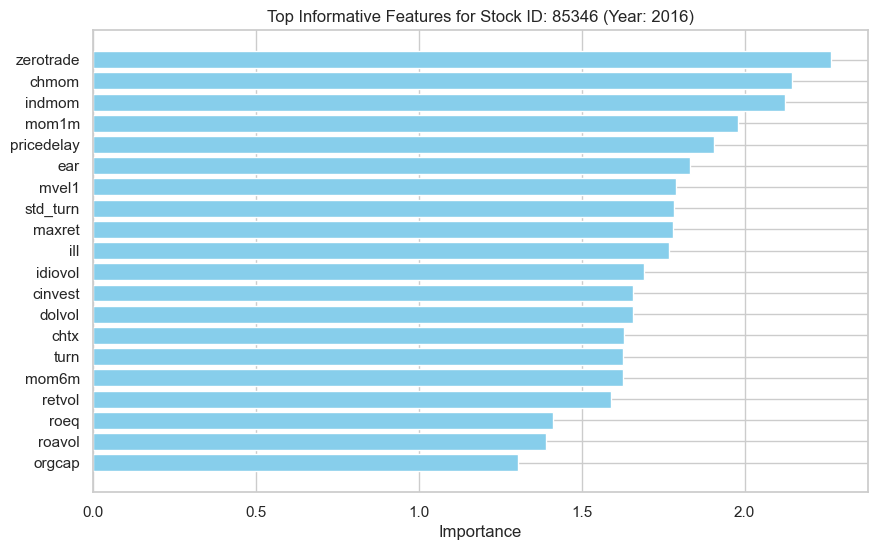

Processing DataFrame 67
Variable Importance:
pricedelay    2.430832
baspread      2.314348
std_dolvol    2.262895
chmom         2.174160
dolvol        2.139543
                ...   
ms            0.000000
securedind    0.000000
rd            0.000000
secured       0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.430832
baspread      2.314348
std_dolvol    2.262895
chmom         2.174160
dolvol        2.139543
maxret        2.021344
zerotrade     1.862828
mom6m         1.746456
mom12m        1.743869
beta          1.733218
retvol        1.681084
std_turn      1.679458
indmom        1.674301
cinvest       1.585854
betasq        1.569088
mom1m         1.474100
chtx          1.418354
aeavol        1.416019
stdacc        1.411578
mvel1         1.410411
dtype: float64


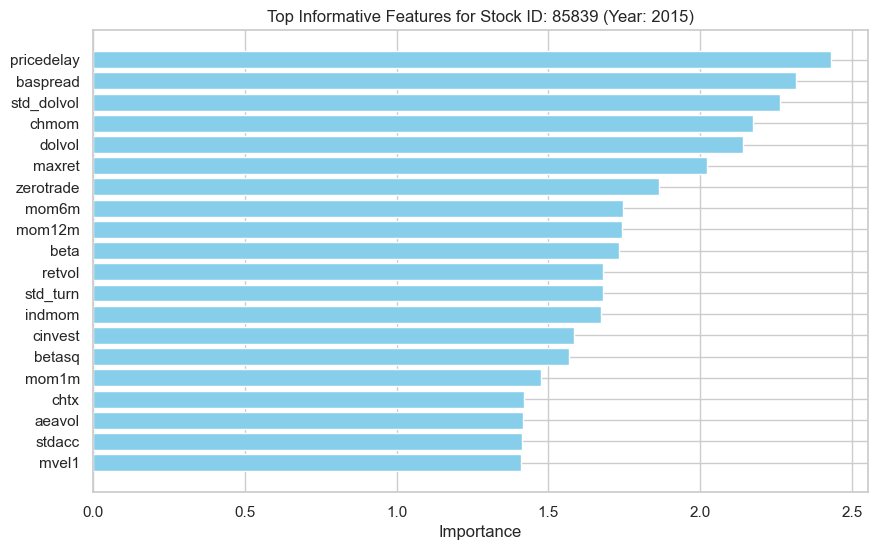

Processing DataFrame 68
Variable Importance:
pricedelay    2.656423
dolvol        2.411727
mom36m        2.070488
zerotrade     2.045307
baspread      1.962069
                ...   
dy            0.000000
sin           0.000000
securedind    0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.656423
dolvol        2.411727
mom36m        2.070488
zerotrade     2.045307
baspread      1.962069
ill           1.869591
mom1m         1.829393
turn          1.798306
indmom        1.664995
idiovol       1.663896
ear           1.653955
mom12m        1.634703
std_turn      1.593718
roaq          1.546418
retvol        1.534862
mom6m         1.534150
beta          1.532166
chtx          1.529199
chmom         1.521305
std_dolvol    1.454430
dtype: float64


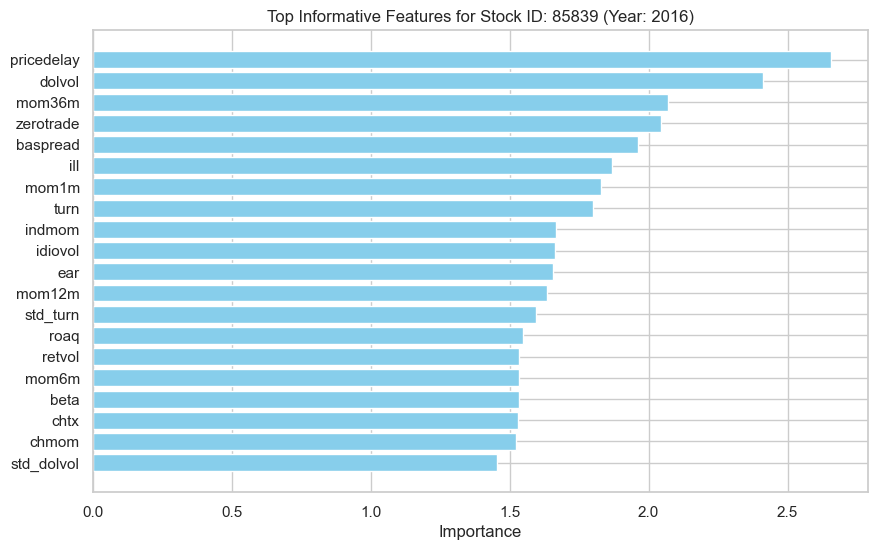

Processing DataFrame 69
Variable Importance:
mom1m         2.438310
baspread      2.372005
indmom        2.309229
pricedelay    2.074883
dolvol        2.048414
                ...   
grcapx        0.000000
gma           0.000000
ep            0.000000
egr           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom1m         2.438310
baspread      2.372005
indmom        2.309229
pricedelay    2.074883
dolvol        2.048414
ill           2.016849
mvel1         2.013807
chmom         1.930455
beta          1.803509
aeavol        1.792758
betasq        1.777815
chtx          1.753963
idiovol       1.739179
std_turn      1.648316
retvol        1.624123
maxret        1.615055
zerotrade     1.614589
mom36m        1.572372
rd_sale       1.541283
mom12m        1.528475
dtype: float64


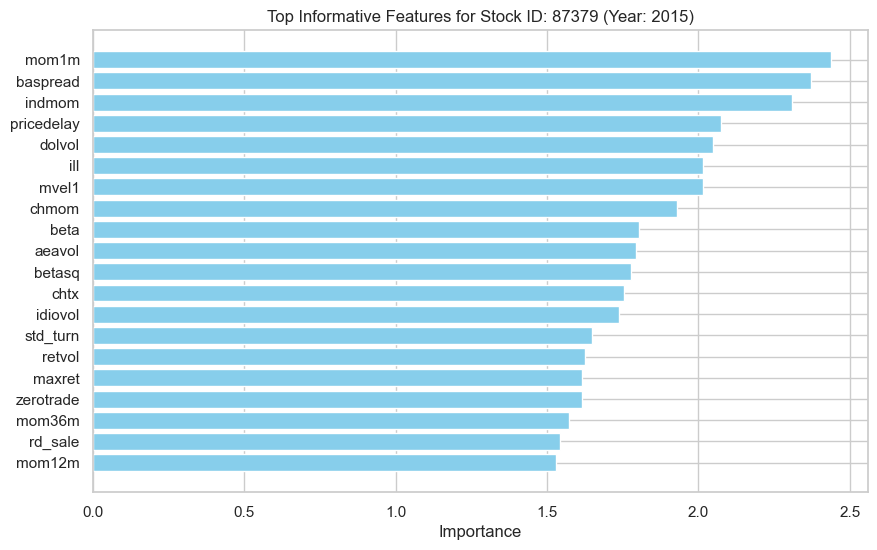

Processing DataFrame 70
Variable Importance:
ill           2.452606
maxret        2.382450
pricedelay    2.211475
cinvest       2.119459
roic          2.040239
                ...   
grcapx        0.000000
gma           0.000000
ep            0.000000
egr           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
ill           2.452606
maxret        2.382450
pricedelay    2.211475
cinvest       2.119459
roic          2.040239
dolvol        2.013904
zerotrade     1.994381
stdacc        1.864622
idiovol       1.851904
std_turn      1.848799
indmom        1.843460
mom1m         1.838497
std_dolvol    1.812787
chmom         1.785919
baspread      1.692159
mom12m        1.664641
chtx          1.612088
aeavol        1.572637
secured       1.545976
retvol        1.464667
dtype: float64


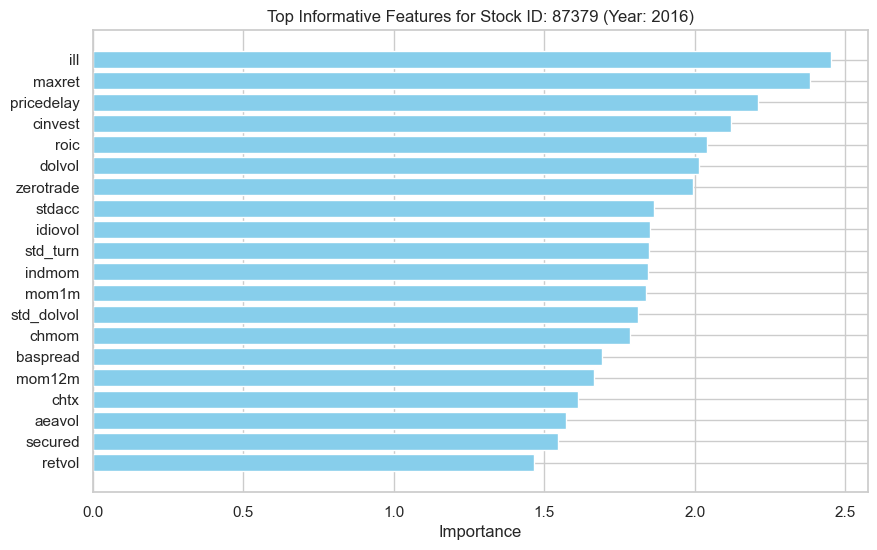

Processing DataFrame 71
Variable Importance:
zerotrade     2.404937
pricedelay    2.326100
ill           2.079065
turn          2.009901
mom36m        1.982450
                ...   
divi          0.000000
securedind    0.000000
rd            0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
zerotrade     2.404937
pricedelay    2.326100
ill           2.079065
turn          2.009901
mom36m        1.982450
beta          1.918947
betasq        1.914510
mvel1         1.849927
dolvol        1.848103
maxret        1.809264
mom1m         1.790252
chmom         1.744832
mom6m         1.635212
std_turn      1.506702
std_dolvol    1.477701
cash          1.439175
baspread      1.437255
orgcap        1.424343
stdacc        1.347524
ear           1.266964
dtype: float64


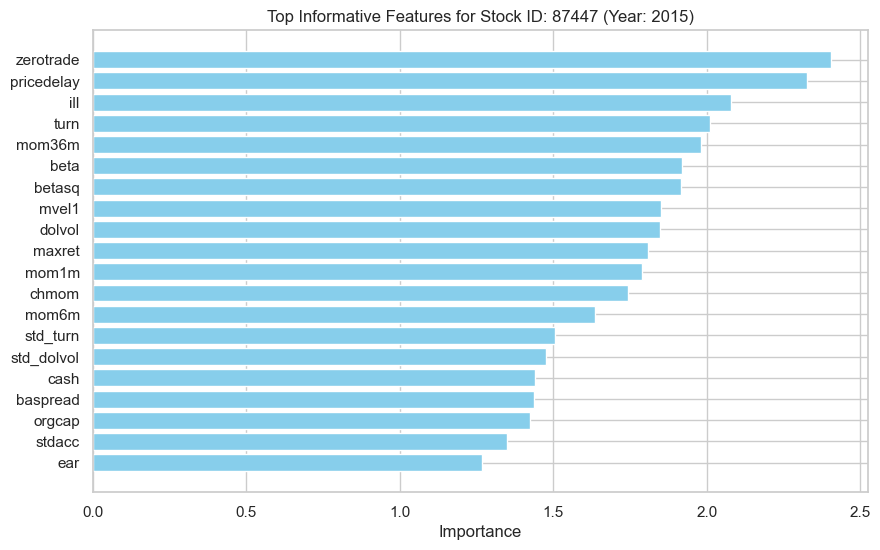

Processing DataFrame 72
Variable Importance:
dolvol        2.535994
ill           2.243508
mvel1         2.112286
zerotrade     2.009383
retvol        1.944686
                ...   
rd            0.000000
sin           0.000000
securedind    0.000000
ps            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.535994
ill           2.243508
mvel1         2.112286
zerotrade     2.009383
retvol        1.944686
indmom        1.841962
idiovol       1.802061
maxret        1.772877
turn          1.748761
pricedelay    1.723081
mom36m        1.713713
std_dolvol    1.690102
chmom         1.659553
chtx          1.580357
std_turn      1.575736
mom1m         1.572184
cash          1.533517
orgcap        1.483438
ear           1.473512
aeavol        1.458493
dtype: float64


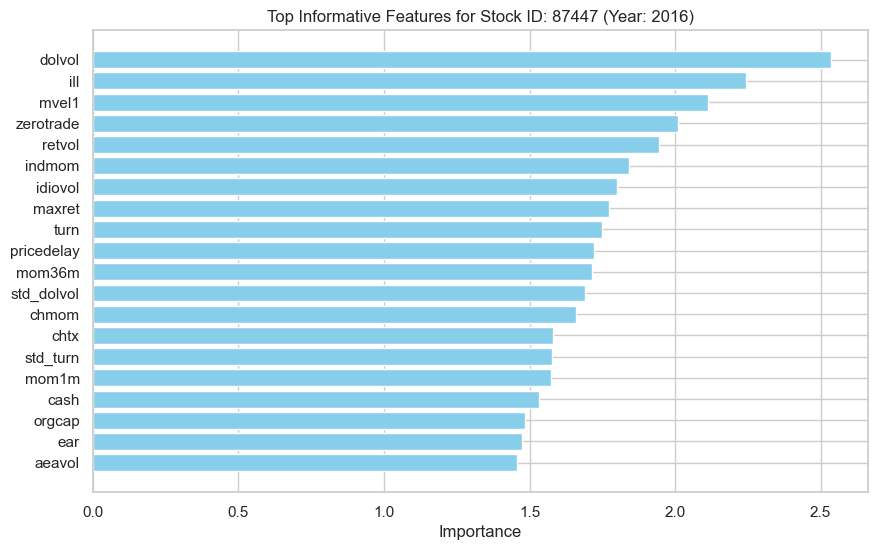

Processing DataFrame 73
Variable Importance:
pricedelay    2.429506
idiovol       2.370515
retvol        2.290346
baspread      2.077263
beta          2.006985
                ...   
divo          0.000000
sin           0.000000
securedind    0.000000
ps            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.429506
idiovol       2.370515
retvol        2.290346
baspread      2.077263
beta          2.006985
stdcf         1.959383
ill           1.932300
dolvol        1.921768
indmom        1.896987
std_dolvol    1.873662
stdacc        1.832961
chmom         1.781551
mom6m         1.731239
maxret        1.656791
betasq        1.604010
std_turn      1.593019
mvel1         1.530335
zerotrade     1.504643
mom1m         1.493871
rsup          1.478402
dtype: float64


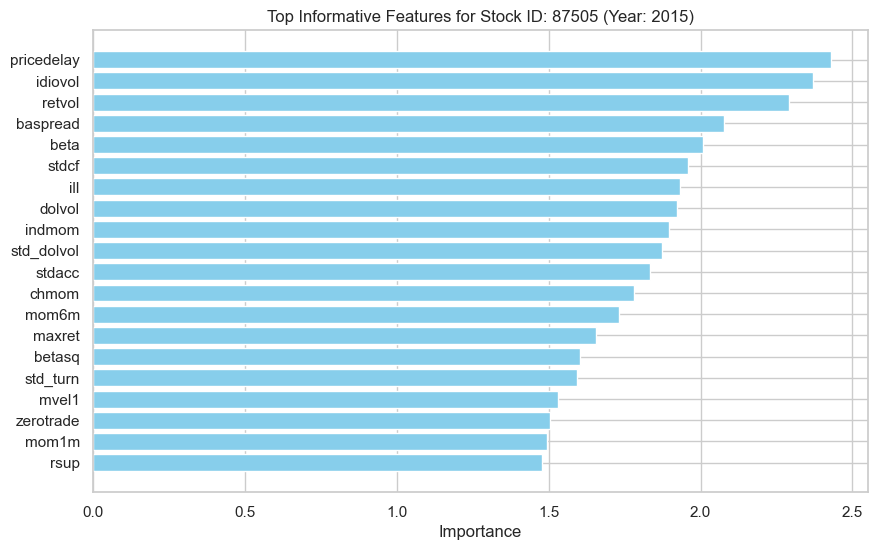

Processing DataFrame 74
Variable Importance:
indmom        2.304278
mvel1         2.302393
mom1m         1.997095
std_turn      1.943678
baspread      1.879298
                ...   
divo          0.000000
sin           0.000000
securedind    0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.304278
mvel1         2.302393
mom1m         1.997095
std_turn      1.943678
baspread      1.879298
mom36m        1.877475
ill           1.805307
pricedelay    1.794391
realestate    1.782780
stdacc        1.778211
stdcf         1.763283
maxret        1.757690
mom12m        1.684090
retvol        1.619988
idiovol       1.614694
dolvol        1.569434
betasq        1.555058
zerotrade     1.548514
chmom         1.537575
roavol        1.486754
dtype: float64


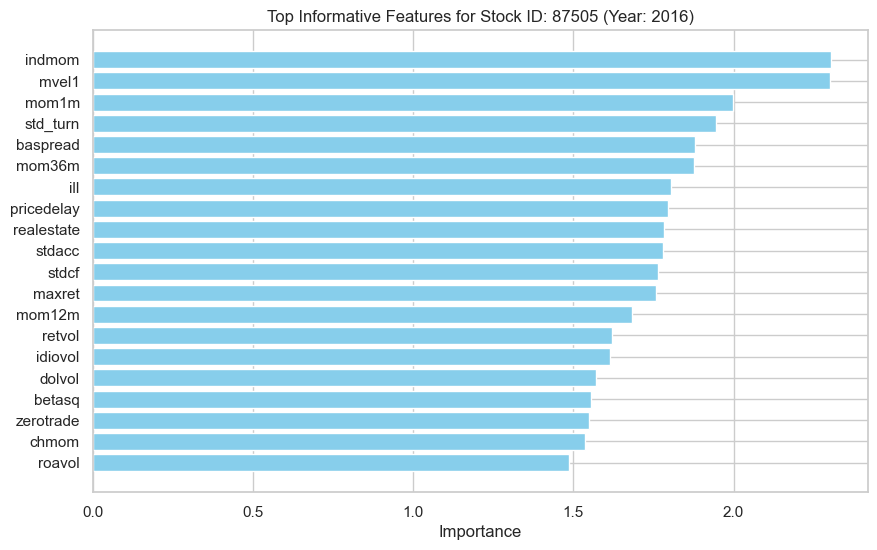

Processing DataFrame 75
Variable Importance:
indmom        2.395059
mvel1         2.356287
chmom         2.224487
std_dolvol    2.195103
dolvol        2.171983
                ...   
ms            0.000000
divo          0.000000
divi          0.000000
convind       0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.395059
mvel1         2.356287
chmom         2.224487
std_dolvol    2.195103
dolvol        2.171983
retvol        2.138156
zerotrade     2.008545
maxret        1.938698
mom1m         1.856812
ill           1.829359
pricedelay    1.821095
chtx          1.807398
mom12m        1.767048
mom36m        1.765246
turn          1.754877
beta          1.752411
mom6m         1.736939
baspread      1.707012
idiovol       1.706850
betasq        1.682354
dtype: float64


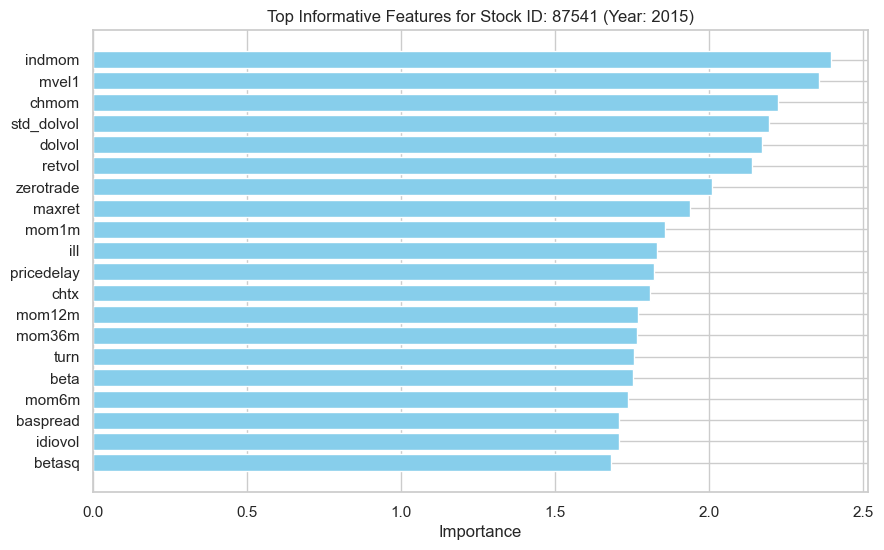

Processing DataFrame 76
Variable Importance:
maxret        2.638900
dolvol        2.638253
pricedelay    2.324049
zerotrade     2.075787
mvel1         2.013469
                ...   
divo          0.000000
rd            0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
maxret        2.638900
dolvol        2.638253
pricedelay    2.324049
zerotrade     2.075787
mvel1         2.013469
baspread      1.830916
std_dolvol    1.792676
idiovol       1.737831
chmom         1.719078
ill           1.692744
indmom        1.685109
mom6m         1.655323
mom1m         1.649778
retvol        1.593075
std_turn      1.524698
mom12m        1.414783
turn          1.333161
beta          1.306500
betasq        1.290695
rsup          1.222587
dtype: float64


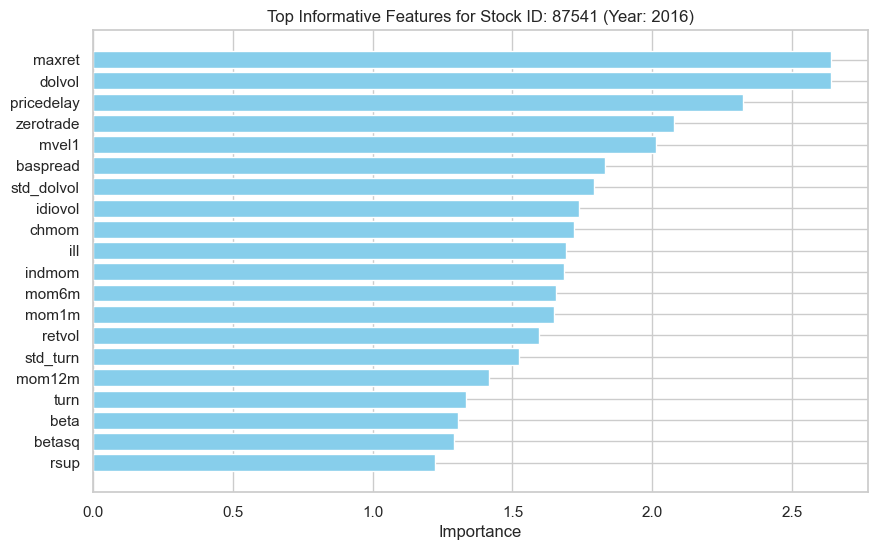

Processing DataFrame 77
Variable Importance:
mvel1         2.298838
zerotrade     2.132219
dolvol        2.115179
chmom         1.977288
baspread      1.960559
                ...   
sin           0.000000
securedind    0.000000
secured       0.000000
ps            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1         2.298838
zerotrade     2.132219
dolvol        2.115179
chmom         1.977288
baspread      1.960559
std_turn      1.937201
idiovol       1.903462
ill           1.871257
pricedelay    1.849190
cinvest       1.845552
mom12m        1.841257
maxret        1.778643
ear           1.722622
mom36m        1.691616
std_dolvol    1.538306
chtx          1.517391
indmom        1.502501
nincr         1.478658
cash          1.416047
aeavol        1.414401
dtype: float64


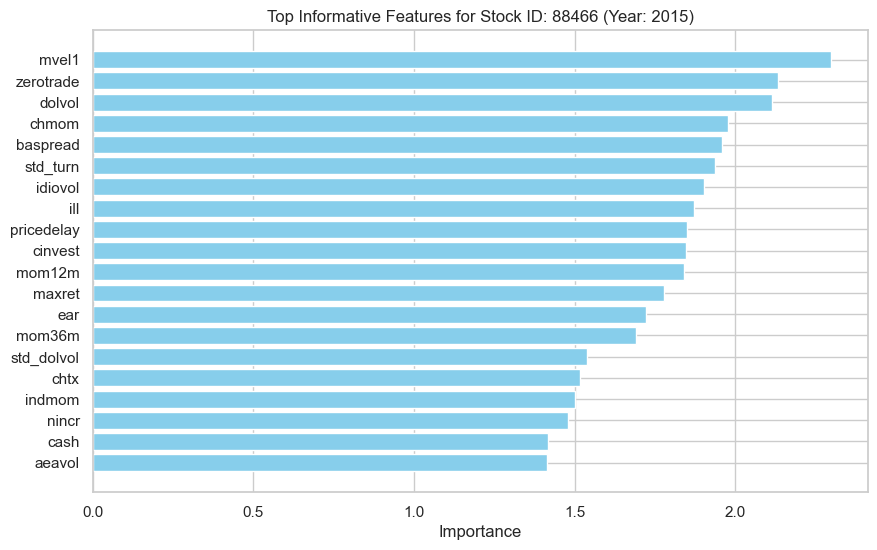

Processing DataFrame 78
Variable Importance:
mom1m        2.163204
mvel1        2.147615
zerotrade    2.045815
ill          2.010532
mom12m       1.925548
               ...   
dy           0.000000
sin          0.000000
secured      0.000000
rd           0.000000
sic2         0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom1m         2.163204
mvel1         2.147615
zerotrade     2.045815
ill           2.010532
mom12m        1.925548
mom36m        1.903797
dolvol        1.865793
maxret        1.838624
mom6m         1.714302
beta          1.701753
chmom         1.679732
betasq        1.653834
turn          1.641777
pricedelay    1.630344
baspread      1.616932
idiovol       1.605477
std_dolvol    1.592331
retvol        1.591390
chtx          1.527911
std_turn      1.516696
dtype: float64


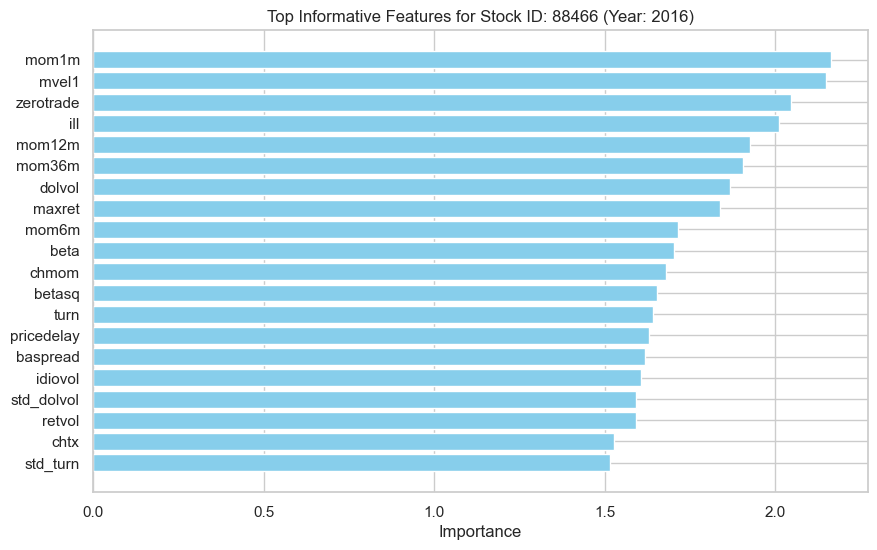

Processing DataFrame 79
Variable Importance:
zerotrade     2.363637
mom1m         2.251358
mom6m         2.225677
std_dolvol    2.106660
mom36m        2.053903
                ...   
sin           0.000000
divi          0.000000
divo          0.000000
dy            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
zerotrade     2.363637
mom1m         2.251358
mom6m         2.225677
std_dolvol    2.106660
mom36m        2.053903
beta          2.026720
betasq        1.943609
ill           1.779323
chmom         1.701108
mom12m        1.686596
aeavol        1.664852
maxret        1.590249
mvel1         1.583886
indmom        1.555254
roavol        1.520650
turn          1.520273
dolvol        1.518397
std_turn      1.502110
rsup          1.482031
idiovol       1.445258
dtype: float64


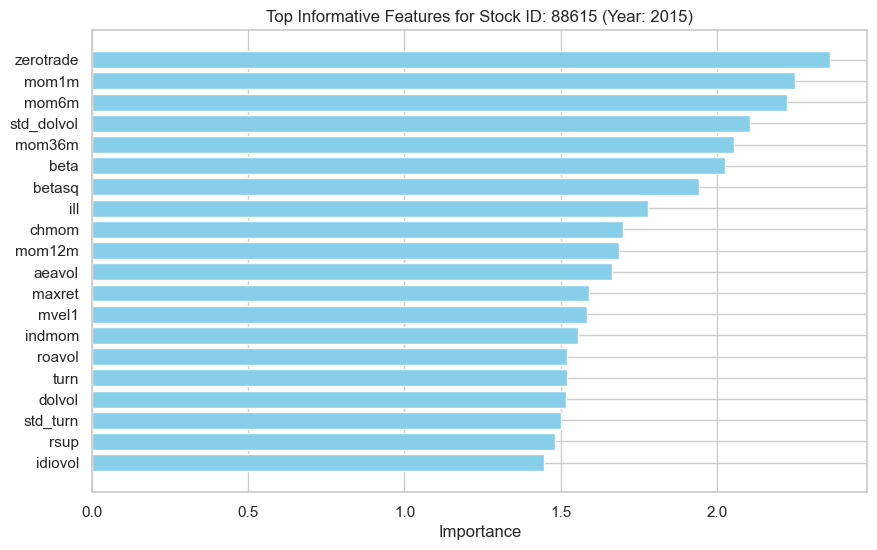

Processing DataFrame 80
Variable Importance:
maxret        2.386867
std_dolvol    2.094196
betasq        2.019301
beta          1.945335
baspread      1.942980
                ...   
rd            0.000000
divo          0.000000
dy            0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
maxret        2.386867
std_dolvol    2.094196
betasq        2.019301
beta          1.945335
baspread      1.942980
mvel1         1.933936
dolvol        1.914617
mom36m        1.857898
indmom        1.839115
turn          1.826141
mom1m         1.824288
chmom         1.793199
retvol        1.763489
mom6m         1.762356
pricedelay    1.587870
zerotrade     1.586327
nincr         1.448392
std_turn      1.408836
cinvest       1.390715
aeavol        1.389099
dtype: float64


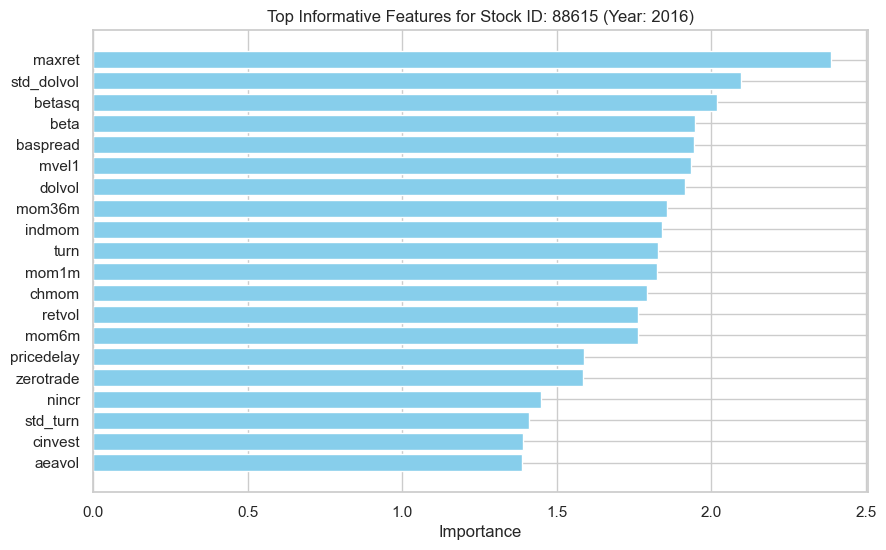

Processing DataFrame 81
Variable Importance:
mom1m         1.986201
std_dolvol    1.969089
indmom        1.960163
idiovol       1.881366
std_turn      1.829575
                ...   
sin           0.000000
securedind    0.000000
secured       0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom1m         1.986201
std_dolvol    1.969089
indmom        1.960163
idiovol       1.881366
std_turn      1.829575
baspread      1.792393
mvel1         1.753418
ill           1.732822
cash          1.662346
mom12m        1.655664
beta          1.649901
zerotrade     1.611057
pricedelay    1.577891
mom6m         1.528861
chmom         1.472557
aeavol        1.439838
maxret        1.439674
chtx          1.415461
betasq        1.391073
cinvest       1.382205
dtype: float64


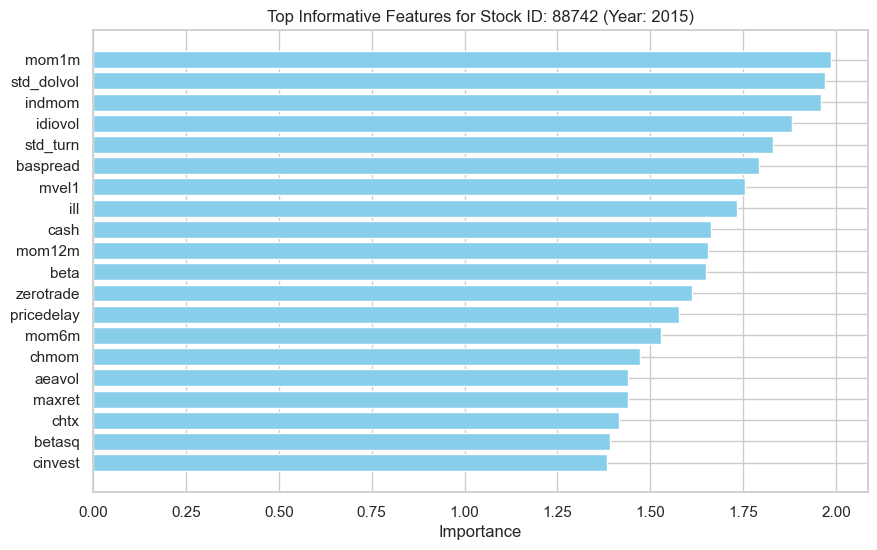

Processing DataFrame 82
Variable Importance:
maxret        2.297567
baspread      2.185659
pricedelay    2.057749
mvel1         2.004028
idiovol       1.979053
                ...   
securedind    0.000000
sin           0.000000
convind       0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
maxret        2.297567
baspread      2.185659
pricedelay    2.057749
mvel1         2.004028
idiovol       1.979053
std_dolvol    1.947853
indmom        1.886652
mom12m        1.875422
mom36m        1.831044
zerotrade     1.805144
mom1m         1.749300
realestate    1.717571
mom6m         1.703952
nincr         1.685464
retvol        1.643961
ill           1.567932
cash          1.505116
std_turn      1.498881
chmom         1.436021
chtx          1.427417
dtype: float64


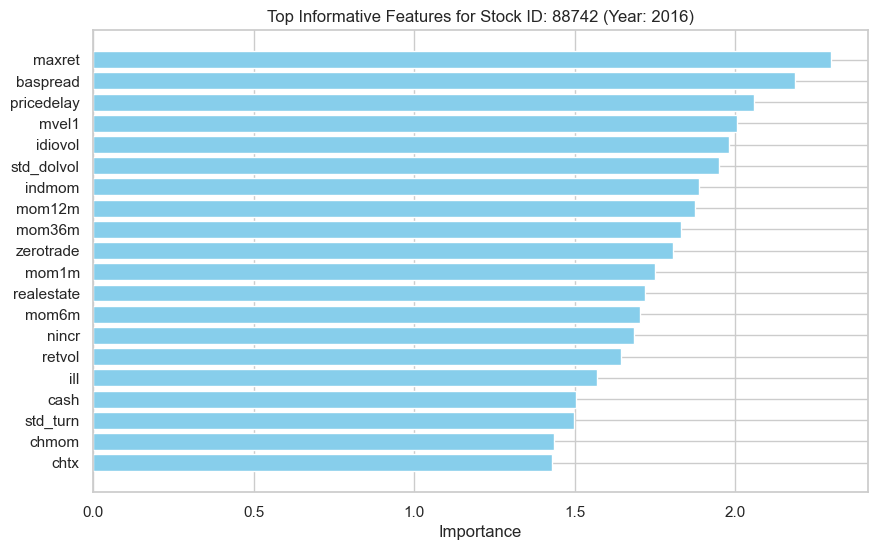

Processing DataFrame 83
Variable Importance:
pricedelay    2.123927
mom1m         2.034593
securedind    1.930141
mvel1         1.774067
currat        1.752694
                ...   
divi          0.000000
ms            0.000000
ps            0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.123927
mom1m         2.034593
securedind    1.930141
mvel1         1.774067
currat        1.752694
ill           1.690401
mom36m        1.686547
retvol        1.684227
mom12m        1.672003
quick         1.637820
idiovol       1.596452
maxret        1.556727
std_dolvol    1.486826
std_turn      1.483436
dolvol        1.447254
ear           1.412720
beta          1.408359
sp            1.397021
herf          1.361175
stdacc        1.274365
dtype: float64


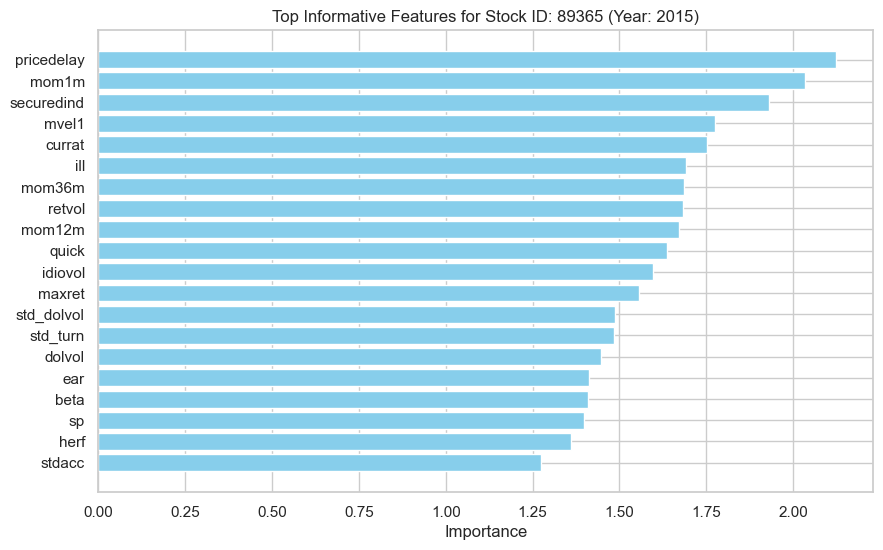

Processing DataFrame 84
Variable Importance:
pricedelay    2.198151
std_turn      2.016132
dolvol        1.974230
ill           1.962190
zerotrade     1.941486
                ...   
ps            0.000000
rd            0.000000
chtx          0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.198151
std_turn      2.016132
dolvol        1.974230
ill           1.962190
zerotrade     1.941486
std_dolvol    1.875377
retvol        1.841332
maxret        1.755419
betasq        1.685094
mom1m         1.683610
realestate    1.651097
dy            1.607689
cinvest       1.564027
mvel1         1.481051
turn          1.406973
rsup          1.393689
mom6m         1.387464
ear           1.375611
baspread      1.295386
tang          1.204542
dtype: float64


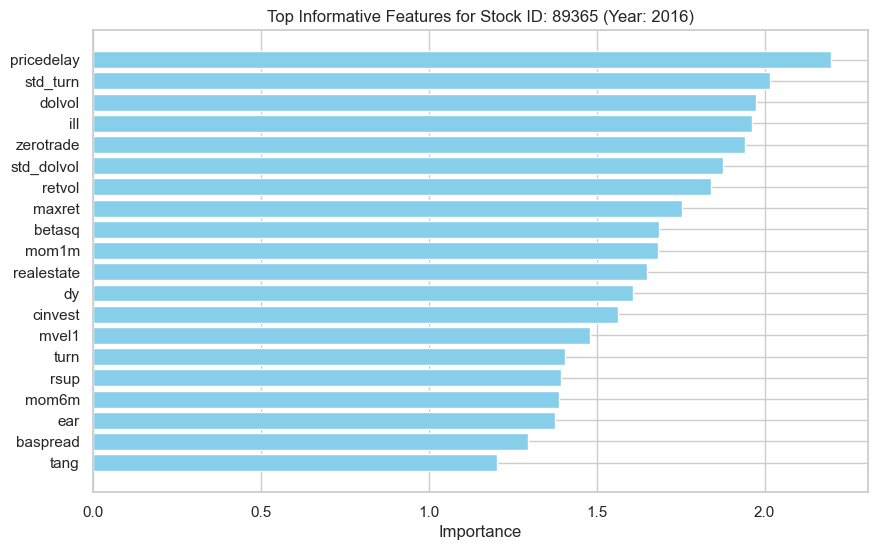

Processing DataFrame 85
Variable Importance:
betasq        1.927967
currat        1.831446
zerotrade     1.829948
securedind    1.796268
ill           1.723880
                ...   
chinv         0.000000
ps            0.000000
age           0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
betasq        1.927967
currat        1.831446
zerotrade     1.829948
securedind    1.796268
ill           1.723880
dolvol        1.677947
sp            1.646079
chtx          1.642882
mom1m         1.632351
mom36m        1.585839
cash          1.571696
maxret        1.550026
chmom         1.521959
beta          1.475052
retvol        1.473391
mvel1         1.431770
std_turn      1.428357
grcapx        1.374654
ear           1.362562
baspread      1.352807
dtype: float64


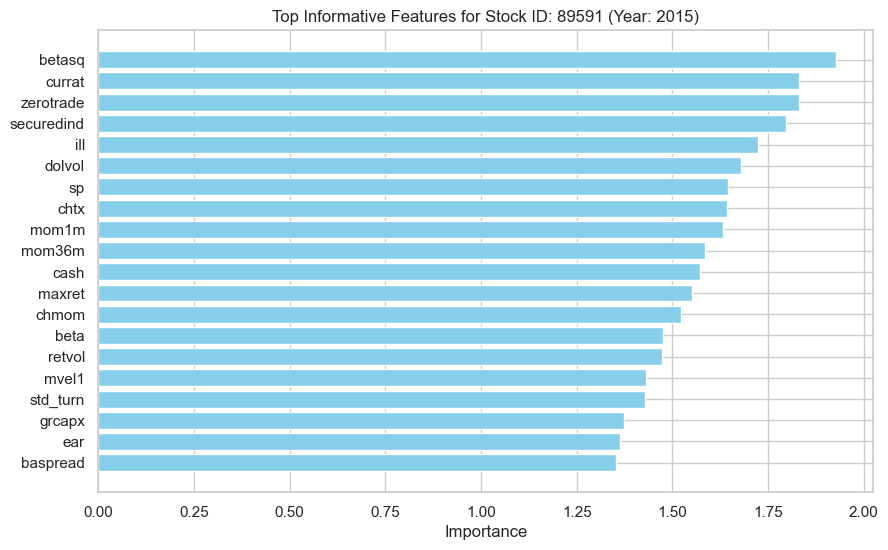

Processing DataFrame 86
Variable Importance:
dolvol        2.001775
ill           1.869377
pricedelay    1.866029
ear           1.848918
zerotrade     1.803147
                ...   
ps            0.000000
rd            0.000000
securedind    0.000000
chtx          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.001775
ill           1.869377
pricedelay    1.866029
ear           1.848918
zerotrade     1.803147
std_dolvol    1.786792
cinvest       1.759235
betasq        1.751319
mom1m         1.725726
turn          1.656289
aeavol        1.536767
rsup          1.510328
beta          1.457035
dy            1.430107
cash          1.418744
realestate    1.400792
mom6m         1.397055
nincr         1.393572
idiovol       1.392045
baspread      1.387740
dtype: float64


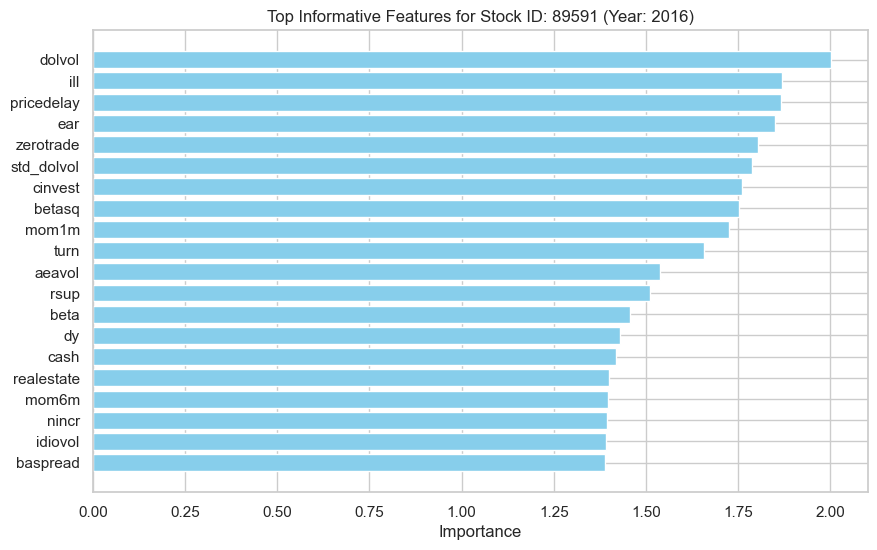

Processing DataFrame 87
Variable Importance:
dolvol       2.042940
maxret       1.878069
currat       1.853387
ill          1.789087
zerotrade    1.769995
               ...   
divi         0.000000
divo         0.000000
rd           0.000000
ps           0.000000
sic2         0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.042940
maxret        1.878069
currat        1.853387
ill           1.789087
zerotrade     1.769995
securedind    1.716743
baspread      1.701747
chtx          1.650009
ear           1.636679
grcapx        1.632818
quick         1.573173
std_turn      1.549619
pricedelay    1.539260
sp            1.535788
std_dolvol    1.523860
idiovol       1.462886
beta          1.429802
retvol        1.423041
mom1m         1.354254
roavol        1.343422
dtype: float64


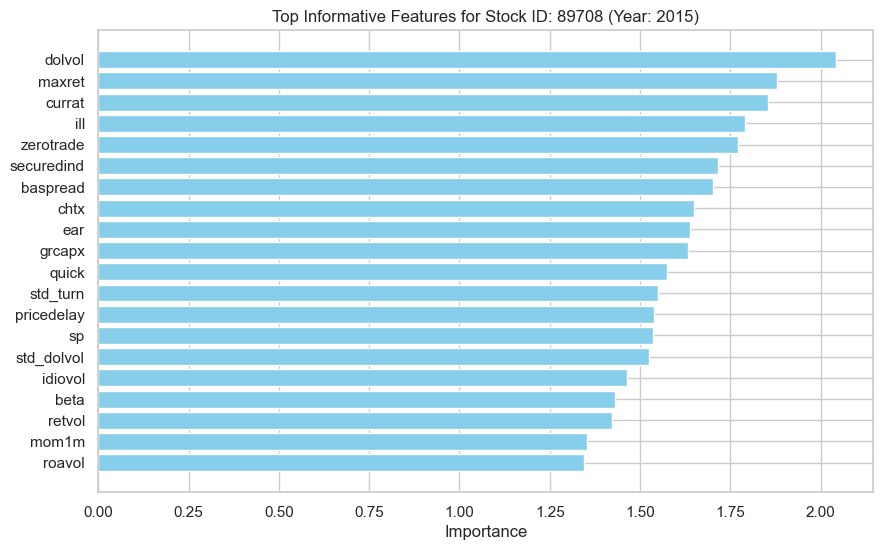

Processing DataFrame 88
Variable Importance:
dolvol        1.863371
mom1m         1.849094
ill           1.746745
beta          1.745898
turn          1.725142
                ...   
chtx          0.000000
ps            0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        1.863371
mom1m         1.849094
ill           1.746745
beta          1.745898
turn          1.725142
cinvest       1.705331
baspread      1.691843
dy            1.681468
mom6m         1.661073
realestate    1.636355
betasq        1.622687
zerotrade     1.612610
idiovol       1.574388
mvel1         1.555296
pricedelay    1.524838
ear           1.506296
rsup          1.492641
retvol        1.491603
aeavol        1.479509
maxret        1.394124
dtype: float64


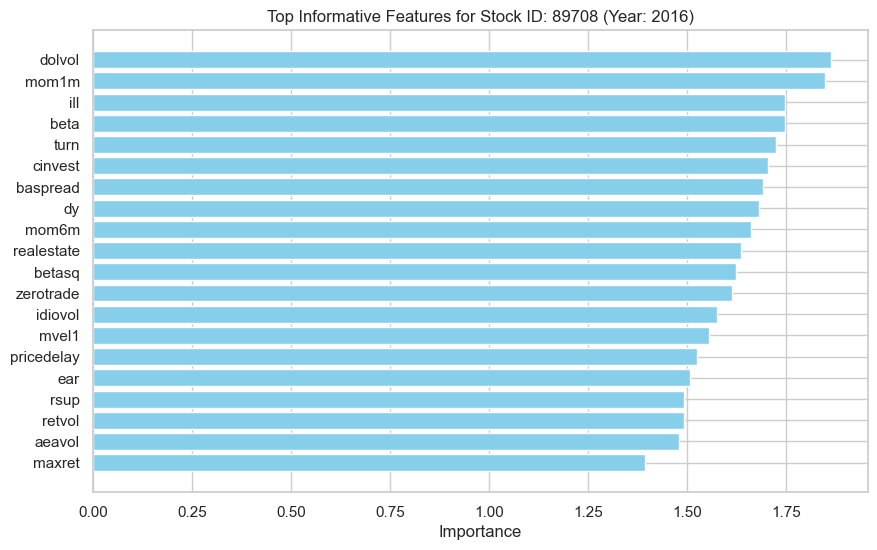

Processing DataFrame 89
Variable Importance:
pricedelay    2.042577
dolvol        2.006242
idiovol       1.926173
sp            1.800638
std_turn      1.746388
                ...   
convind       0.000000
divi          0.000000
divo          0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.042577
dolvol        2.006242
idiovol       1.926173
sp            1.800638
std_turn      1.746388
baspread      1.602217
mvel1         1.600911
zerotrade     1.600316
mom1m         1.577317
securedind    1.572633
currat        1.563901
chtx          1.470738
grcapx        1.458605
std_dolvol    1.447771
maxret        1.406723
quick         1.394104
mom12m        1.358809
ill           1.348093
ear           1.318782
beta          1.303672
dtype: float64


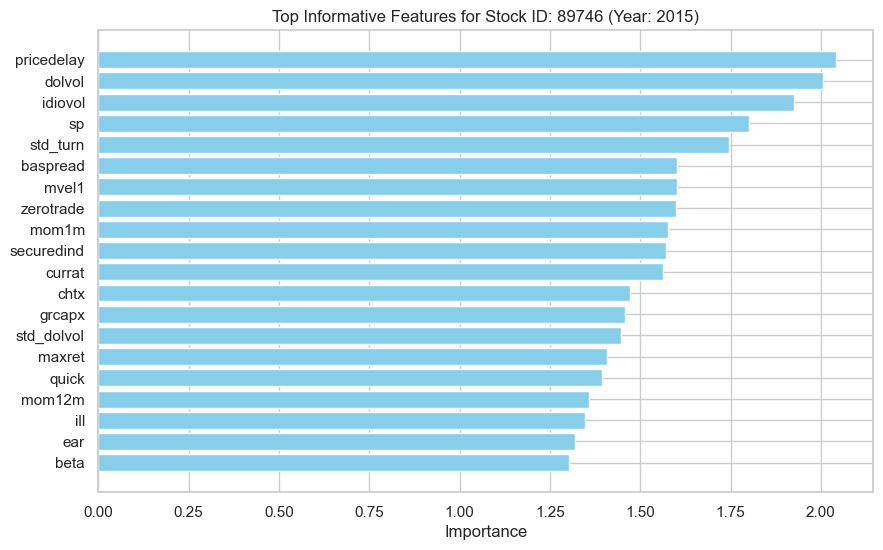

Processing DataFrame 90
Variable Importance:
dolvol        2.209841
cinvest       2.154640
std_dolvol    1.799931
mom36m        1.776922
dy            1.731845
                ...   
divo          0.000000
divi          0.000000
convind       0.000000
chinv         0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.209841
cinvest       2.154640
std_dolvol    1.799931
mom36m        1.776922
dy            1.731845
ear           1.721713
ill           1.717425
zerotrade     1.697089
std_turn      1.673476
mom1m         1.605268
realestate    1.481090
retvol        1.473633
beta          1.461446
rsup          1.460948
maxret        1.435311
cash          1.432539
baspread      1.374653
turn          1.368890
chmom         1.362998
aeavol        1.351272
dtype: float64


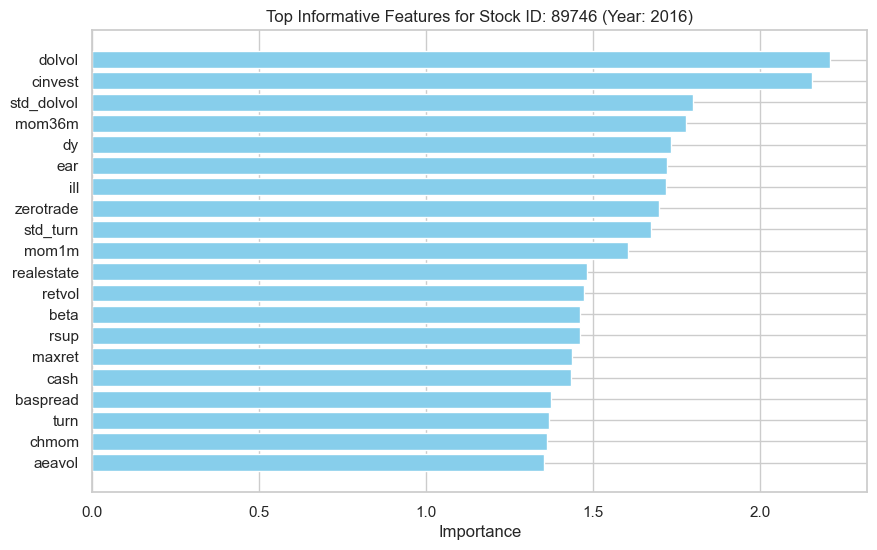

Processing DataFrame 91
Variable Importance:
pricedelay    2.119443
dolvol        2.104524
securedind    1.945537
std_dolvol    1.718642
maxret        1.688519
                ...   
chinv         0.000000
age           0.000000
ps            0.000000
rd            0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.119443
dolvol        2.104524
securedind    1.945537
std_dolvol    1.718642
maxret        1.688519
quick         1.652689
mom1m         1.636892
beta          1.609707
chtx          1.588356
sp            1.566528
mom12m        1.539330
retvol        1.525092
mvel1         1.479925
betasq        1.467092
currat        1.466317
zerotrade     1.462967
baspread      1.449364
ear           1.442110
grcapx        1.374509
herf          1.359831
dtype: float64


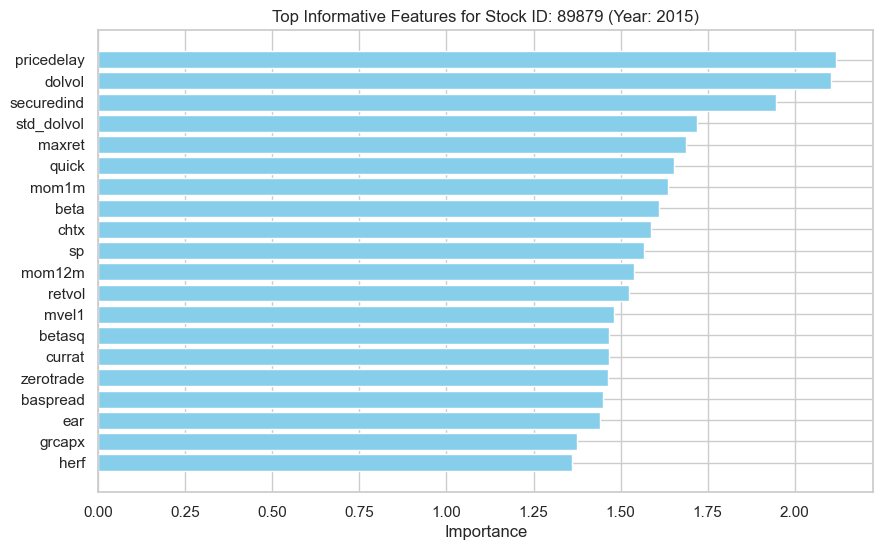

Processing DataFrame 92
Variable Importance:
dolvol     2.215208
ill        2.072393
mom36m     1.987334
mom1m      1.853125
maxret     1.828701
             ...   
divo       0.000000
divi       0.000000
convind    0.000000
chinv      0.000000
sic2       0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.215208
ill           2.072393
mom36m        1.987334
mom1m         1.853125
maxret        1.828701
std_dolvol    1.800123
cinvest       1.759786
retvol        1.733042
dy            1.715586
rsup          1.646551
ear           1.629972
pricedelay    1.558111
realestate    1.501458
mvel1         1.500300
zerotrade     1.469401
saleinv       1.370740
std_turn      1.334889
aeavol        1.316854
quick         1.305616
beta          1.286434
dtype: float64


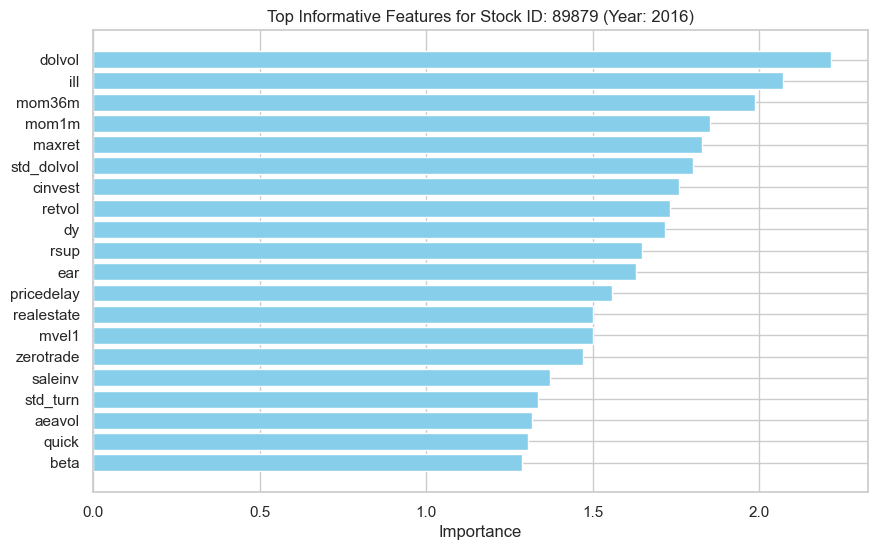

Processing DataFrame 93
Variable Importance:
securedind    2.394572
ill           1.836502
quick         1.830561
ear           1.772243
mom1m         1.732295
                ...   
divi          0.000000
divo          0.000000
ps            0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
securedind    2.394572
ill           1.836502
quick         1.830561
ear           1.772243
mom1m         1.732295
currat        1.718037
maxret        1.660697
chmom         1.556138
zerotrade     1.507374
mom12m        1.444376
sp            1.436519
std_dolvol    1.406608
betasq        1.405087
baspread      1.382208
mom6m         1.363762
dolvol        1.349864
chtx          1.343883
pricedelay    1.341879
herf          1.341551
indmom        1.335211
dtype: float64


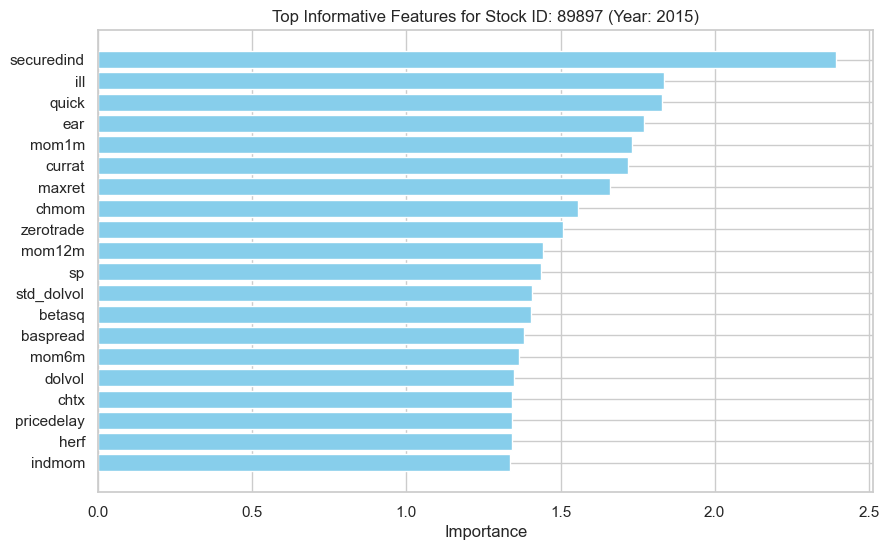

Processing DataFrame 94
Variable Importance:
beta          2.008704
pricedelay    1.944967
dy            1.878883
betasq        1.747615
zerotrade     1.687937
                ...   
ps            0.000000
rd            0.000000
securedind    0.000000
chtx          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
beta          2.008704
pricedelay    1.944967
dy            1.878883
betasq        1.747615
zerotrade     1.687937
ear           1.678525
mvel1         1.643406
mom1m         1.642886
dolvol        1.642731
cinvest       1.606920
mom12m        1.562563
maxret        1.530119
ill           1.456389
mom6m         1.445218
realestate    1.434038
nincr         1.393551
aeavol        1.392037
quick         1.355916
std_dolvol    1.351741
saleinv       1.304791
dtype: float64


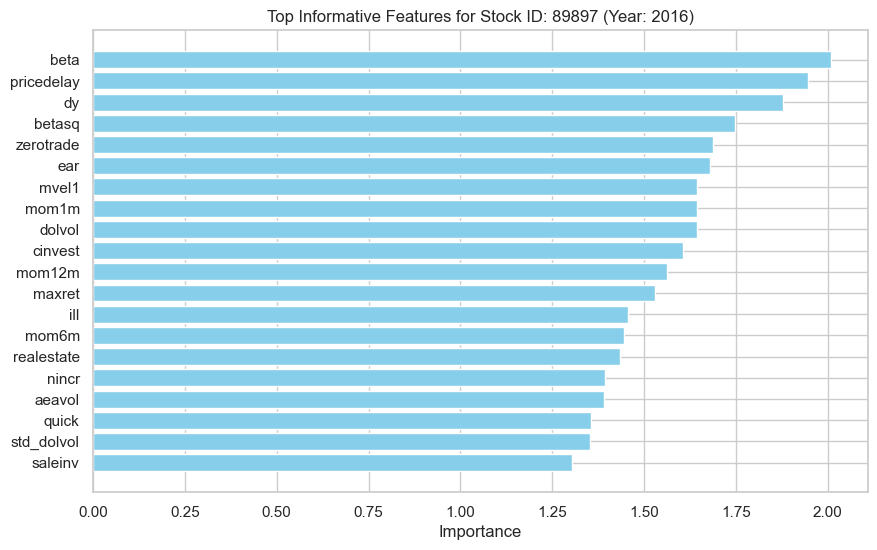

Processing DataFrame 95
Variable Importance:
mom1m         2.205144
baspread      2.149585
mvel1         2.031193
pricedelay    2.019477
indmom        1.855004
                ...   
rd            0.000000
divo          0.000000
dy            0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mom1m         2.205144
baspread      2.149585
mvel1         2.031193
pricedelay    2.019477
indmom        1.855004
std_dolvol    1.840298
retvol        1.822718
mom6m         1.739259
maxret        1.694164
stdcf         1.690117
ill           1.685846
dolvol        1.672231
std_turn      1.667513
betasq        1.627953
zerotrade     1.550030
chmom         1.509456
mom12m        1.504553
mom36m        1.490128
orgcap        1.413536
beta          1.381383
dtype: float64


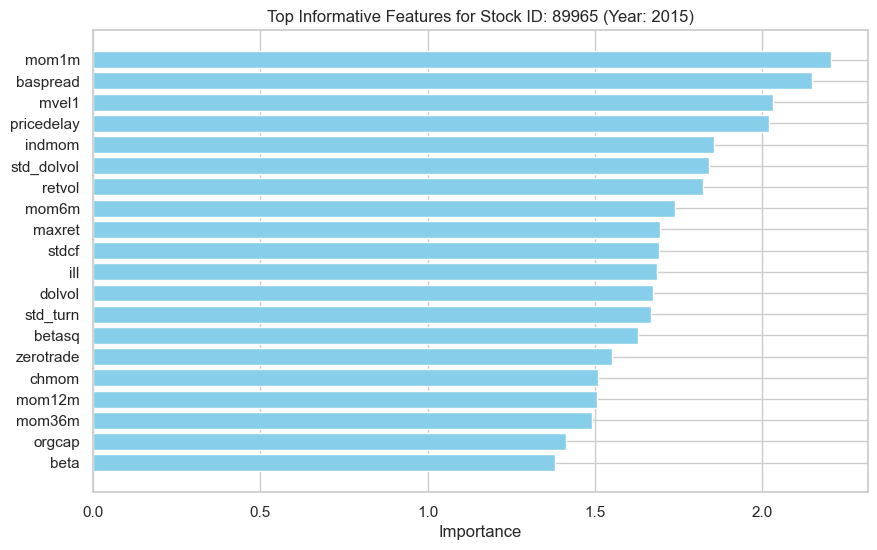

Processing DataFrame 96
Variable Importance:
mvel1       2.281360
mom1m       2.189587
retvol      2.141745
maxret      1.920604
baspread    1.875814
              ...   
salerec     0.000000
salecash    0.000000
gma         0.000000
rd          0.000000
sic2        0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
mvel1         2.281360
mom1m         2.189587
retvol        2.141745
maxret        1.920604
baspread      1.875814
ill           1.779787
std_dolvol    1.774099
betasq        1.751316
beta          1.721138
chtx          1.683568
mom12m        1.677873
cinvest       1.614313
mom36m        1.582928
zerotrade     1.571342
stdcf         1.570453
std_turn      1.563525
realestate    1.415952
aeavol        1.415396
chmom         1.415182
saleinv       1.378513
dtype: float64


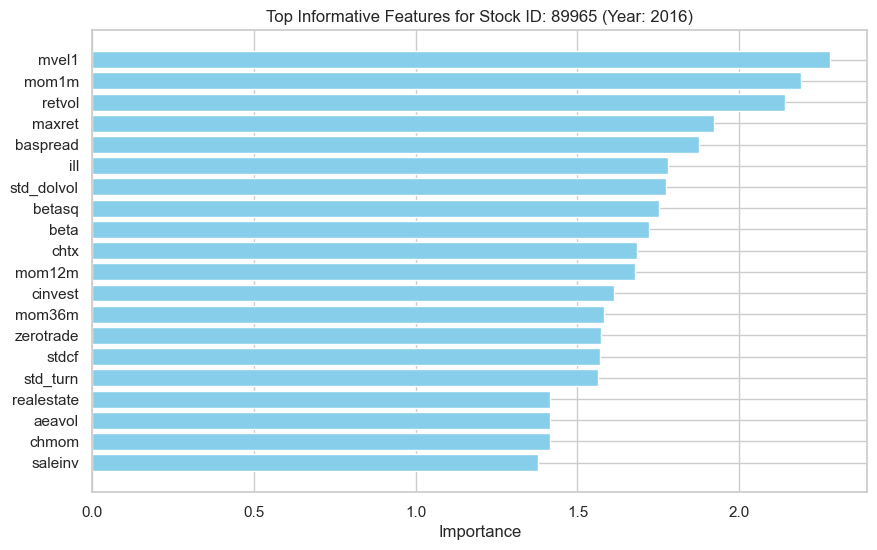

Processing DataFrame 97
Variable Importance:
beta          2.348437
baspread      2.275024
betasq        2.210258
std_dolvol    2.152272
dolvol        2.124291
                ...   
dy            0.000000
securedind    0.000000
rd            0.000000
sin           0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
beta          2.348437
baspread      2.275024
betasq        2.210258
std_dolvol    2.152272
dolvol        2.124291
retvol        1.956652
idiovol       1.902153
pricedelay    1.858627
chmom         1.843656
indmom        1.772975
mom1m         1.753572
maxret        1.718018
ill           1.670819
zerotrade     1.586309
mom36m        1.580986
cinvest       1.561239
aeavol        1.451179
std_turn      1.433947
ear           1.424668
nincr         1.404096
dtype: float64


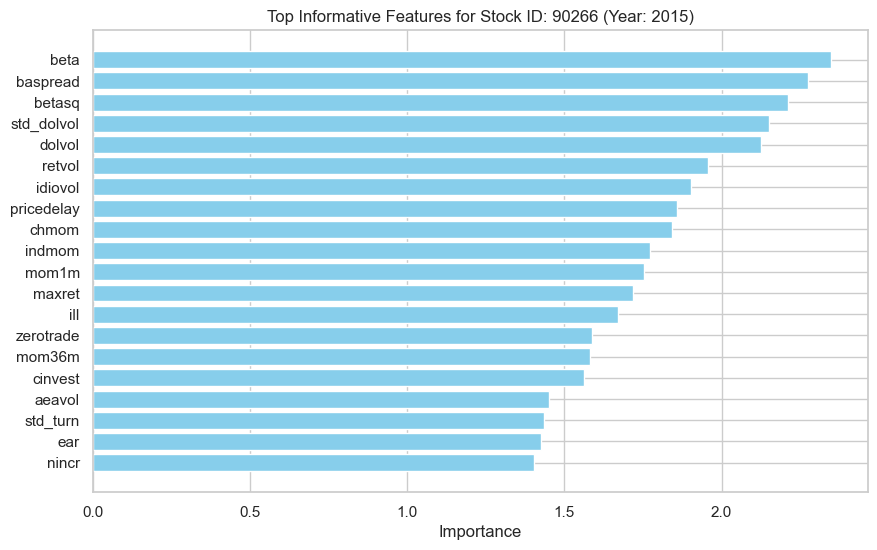

Processing DataFrame 98
Variable Importance:
dolvol       2.632658
maxret       2.487027
baspread     2.140580
zerotrade    2.065455
mom1m        2.047764
               ...   
chcsho       0.000000
ms           0.000000
convind      0.000000
divo         0.000000
sic2         0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
dolvol        2.632658
maxret        2.487027
baspread      2.140580
zerotrade     2.065455
mom1m         2.047764
retvol        2.019711
idiovol       1.986449
chmom         1.943981
mvel1         1.887385
std_turn      1.847606
ear           1.799537
ill           1.763040
mom6m         1.726344
std_dolvol    1.700324
turn          1.552009
indmom        1.482857
cinvest       1.477218
mom36m        1.466313
beta          1.461574
stdcf         1.412089
dtype: float64


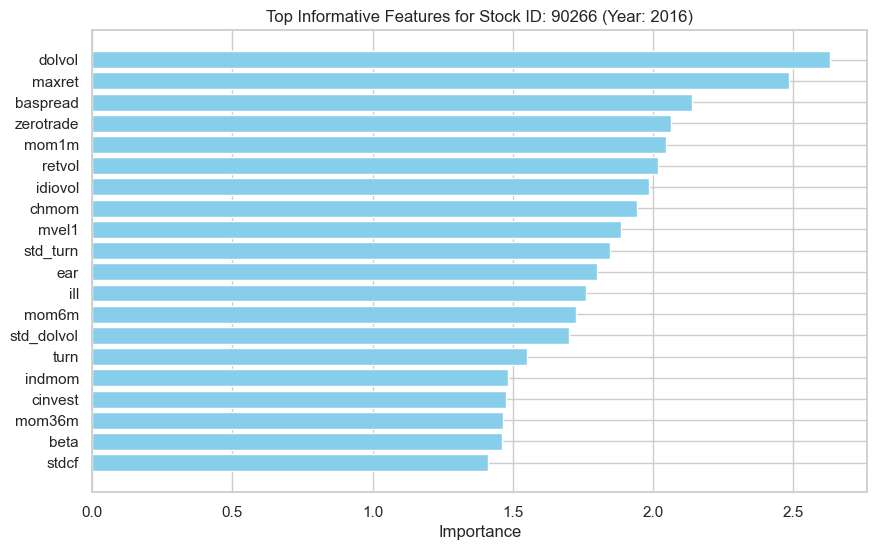

Processing DataFrame 99
Variable Importance:
pricedelay    2.424300
baspread      2.380093
dolvol        2.267370
indmom        2.262704
mom1m         2.182484
                ...   
ms            0.000000
convind       0.000000
divi          0.000000
divo          0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
pricedelay    2.424300
baspread      2.380093
dolvol        2.267370
indmom        2.262704
mom1m         2.182484
idiovol       2.076954
chmom         2.027663
mom36m        2.023741
std_turn      2.011397
betasq        1.840418
ill           1.807269
maxret        1.750370
std_dolvol    1.689957
zerotrade     1.680729
nincr         1.558594
realestate    1.547481
retvol        1.407575
beta          1.345524
mvel1         1.331249
orgcap        1.194065
dtype: float64


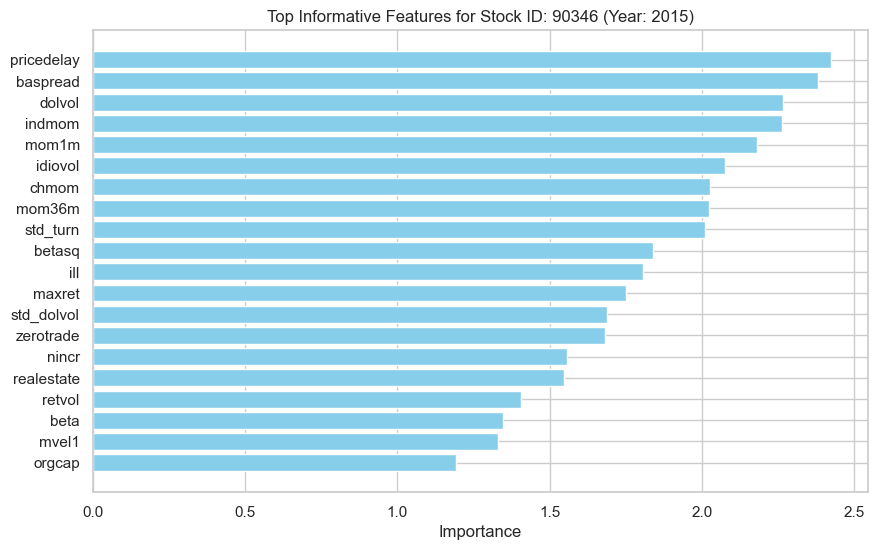

Processing DataFrame 100
Variable Importance:
indmom        2.454763
dolvol        2.342316
pricedelay    2.219098
cinvest       2.205206
zerotrade     2.109559
                ...   
convind       0.000000
ps            0.000000
sin           0.000000
securedind    0.000000
sic2          0.000000
Length: 95, dtype: float64
Top 20 Most Important Variables:
indmom        2.454763
dolvol        2.342316
pricedelay    2.219098
cinvest       2.205206
zerotrade     2.109559
mom1m         2.076391
std_dolvol    2.030802
mvel1         1.839049
chmom         1.765103
ill           1.763764
mom6m         1.727457
maxret        1.718701
realestate    1.674906
beta          1.609279
std_turn      1.606875
orgcap        1.597221
retvol        1.556366
nincr         1.397550
turn          1.347748
betasq        1.325792
dtype: float64


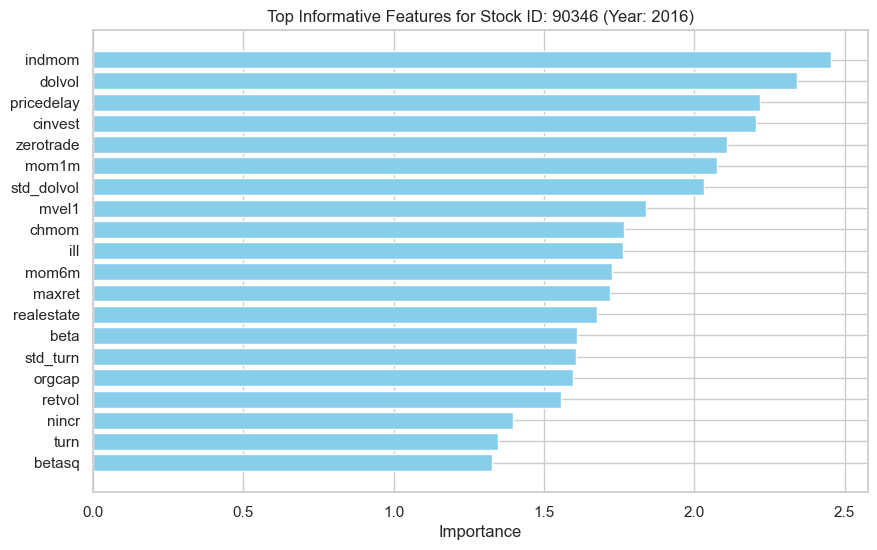

Common Variables DataFrame:
      Variable  Count
0        mom1m     99
1    zerotrade     98
2       dolvol     96
3   pricedelay     93
4   std_dolvol     93
5       maxret     92
6          ill     91
7        mvel1     89
8     std_turn     88
9     baspread     85
10      retvol     81
11        beta     75
12       chmom     73
13      betasq     70
14       mom6m     68
15      indmom     64
16      mom36m     64
17      mom12m     61
18     idiovol     56
19        turn     50


In [47]:
def top_features(loadings, stock_id, year):
    # Compute the absolute loadings
    absolute_loadings = loadings.abs()

    # Sum the absolute loadings for each variable across all components
    variable_importance = absolute_loadings.sum(axis=1)

    # Sort variables by importance
    sorted_importance = variable_importance.sort_values(ascending=False)

    print("Variable Importance:")
    print(sorted_importance)

    # Select the top 20 most important variables
    top_20_variables = sorted_importance.head(20)

    print("Top 20 Most Important Variables:")
    print(top_20_variables)

    # Plot the top features
    plt.figure(figsize=(10, 6))
    plt.barh(top_20_variables.index, top_20_variables.values, color='skyblue')
    plt.xlabel('Importance')
    plt.title(f'Top Informative Features for Stock ID: {stock_id} (Year: {year})')
    plt.gca().invert_yaxis()  # Invert y-axis to have the most important feature on top
    plt.show()

    # Ensure the directory exists
    #if not os.path.exists(save_dir):
        #os.makedirs(save_dir)
    
    # Save the plot
    #plot_path = os.path.join(save_dir, f'top_features_{stock_id}_{year}.png')
    #plt.savefig(plot_path)
    #plt.close()


    return top_20_variables.index.tolist()
    
    
# Counter to store the occurrences of each variable
variable_counter = Counter()

# Directory to save plots
#save_dir = '50_permno_pca'

# Iterate over each DataFrame in loadings_dfs and apply the top_features function
for i, loadings_df in enumerate(loadings_dfs):
    print(f"Processing DataFrame {i+1}")
    stock_id = metadata[i]['stock_id']
    year = metadata[i]['year']
    top_20_variables = top_features(loadings_df, stock_id, year)
    
    # Count the occurrences of each variable
    variable_counter.update(top_20_variables)

# Identify the most occurring variables
most_common_variables = variable_counter.most_common(20)

# Create a DataFrame to store the common variables
common_variables_df = pd.DataFrame(most_common_variables, columns=['Variable', 'Count'])

# Print the DataFrame
print("Common Variables DataFrame:")
print(common_variables_df)

### Conclusion

The following PCA model was iterated for 50 stock ids for the year 2015 and 2016. 

Reason: The reason behind this iterative PCA model is to account for the high-dimensional time series in which there is a unique pca applied on every stock at each year for optimal results. 
In addition, this will help me identify thee best stock features for a unique stock for further analysis.

After finalizing the model, I extracted the most occuring features for all stocks to have a general idea on what stock features are important in analyzing stock market data (Fundemantal Analysis).

The top 20 informative stock level characteritics ranked in order are:

0) mom1m    
1) zerotrade     
2) dolvol     
3) pricedelay     
4) std_dolvol     
5) maxret     
6) ill     
7) mvel1     
8) std_turn     
9) baspread     
10) retvol     
11) beta     
12) chmom     
13) betasq     
14) mom6m     
15) indmom     
16) mom36m     
17) mom12m     
18) idiovol     
19) turn     